# Modified VAE Notebook: Addressing Class Imbalance

This notebook is a modified version of `vae_fc_aal_raw`.

## Goal

The goal of this modification is to reduce bias introduced by class imbalance between real TMS (C) and sham TMS (S) sessions. By addressing this imbalance, we encourage the VAE to learn latent embeddings that are not dominated by overrepresented conditions, thereby improving its ability to capture condition-relevant variance.

## Weighted Sampling Strategy

To mitigate the effects of class imbalance during VAE training, we implemented a weighted sampling strategy:

- **Weighted sampling per session**: A `WeightedRandomSampler` was constructed to ensure that each subject–condition pair contributes proportionally to the training batches.
- **Inverse frequency weighting**: Each session was assigned a weight inversely proportional to the number of sessions in its subject–condition group.
- **Balanced batch composition**: The sampler was used to draw training batches so that C and S conditions were more equally represented, despite natural imbalance in the dataset.


---

## 🔍 Main findings so far

- 




In [10]:
# Auto-Reload for Fast Iteration
%load_ext autoreload
%autoreload 2

# Add project root to sys.path
import sys
import os
sys.path.append(os.path.abspath('..'))

# Import from base_script.py (which is in the root folder)
from base_script import *

# Import custom functions from your utils package
from utils.models import VAE, CVAE

from utils.train_utils import (
    train_vae,
    loss_function,
    get_latent_mu,
    get_latent_mu_cvae,
    compute_condition_distances
)

from utils.data_utils import (
    load_all_fc_data,
    preprocess_for_torch
)

from utils.utils_plotting import (
    plot_vae_losses,
    plot_latent_embedding_by_condition_and_subject,
    plot_subject_distance_comparison
)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# fix the random seeds for Python, NumPy, and PyTorch
random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed_all(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [3]:
sub_cond_path = '/Users/liuq13/NODEAP_scripts/data_input/SubConds.xlsx'
base_nifti_folder = '/Volumes/X9Pro/NODEAP/FuncConn_AAL'
condition_map = {'N': 0, 'S': 1, 'C': 2}

In [4]:
# Load and preprocess
# load aal FC matrix
all_corr_data, all_tms_type, all_subject_id, all_stimloc, all_session = load_all_fc_data(sub_cond_path, base_nifti_folder, mat_filename='conn_matrix.mat')
X_tensor = preprocess_for_torch(all_corr_data)

[WARN] File not found: /Volumes/X9Pro/NODEAP/FuncConn_AAL/NODEAP_30/S3D2/conn_matrix.mat
[WARN] File not found: /Volumes/X9Pro/NODEAP/FuncConn_AAL/NODEAP_44/S1D1/conn_matrix.mat
[WARN] File not found: /Volumes/X9Pro/NODEAP/FuncConn_AAL/NODEAP_83/S3D1/conn_matrix.mat
[WARN] File not found: /Volumes/X9Pro/NODEAP/FuncConn_AAL/NODEAP_87/D0/conn_matrix.mat
[WARN] File not found: /Volumes/X9Pro/NODEAP/FuncConn_AAL/NODEAP_88/D0/conn_matrix.mat
Columns with NaN: 229 / 6670
Tensor shape after preprocessing: torch.Size([331, 6441])


In [8]:
condition_list = np.array([condition_map[t] for t in all_tms_type]) # map tms type to 0,1,2
condition_tensor = torch.tensor(condition_list, dtype=torch.long)

In [41]:
# Create unique key: subject + condition
combo_keys = np.array([f"{s}_{c}" for s, c in zip(all_subject_id, condition_list)])
combo_counts = Counter(combo_keys)

# Create a weight vector with one entry per sample (not per unique combo)
weights = np.array([1.0 / combo_counts[k] for k in combo_keys]) # assign weights based on counts (rare pairs get higher weights)
weights_tensor = torch.DoubleTensor(weights) # convert to torch tensor with dtype torch.float64

le = LabelEncoder()
subject_labels = le.fit_transform(all_subject_id) # transform subject id to 0, 1, 2, ...
subject_tensor = torch.tensor(subject_labels, dtype=torch.long) # 64-bit integer

In [30]:
X_tensor.shape

torch.Size([331, 6441])

In [31]:
subject_tensor.shape

torch.Size([331])

In [32]:
condition_tensor.shape

torch.Size([331])

In [39]:
# prepare dataset with FC as X, subject, and condition (3-tuple)
dataset = TensorDataset(X_tensor, subject_tensor, condition_tensor)

In [36]:
# create a weighted sampler that draws samples w/ prob proportional to weight
sampler = WeightedRandomSampler(weights_tensor, num_samples=len(weights_tensor), replacement=True)
# create a dataloader using the sampler instead of random shuffle
dataloader = DataLoader(dataset, batch_size=32, sampler=sampler)

In [37]:
# Set up model, optimizer, and device
input_dim = X_tensor.shape[1]
latent_dim = 10
model = VAE(input_dim=input_dim, latent_dim=latent_dim)

In [45]:
NUM_EPOCH = 1000
LR = 3e-4
BETA = 4.0
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
total_loss_hist, recon_loss_hist, kld_loss_hist = train_vae(model, dataloader, optimizer, device=DEVICE, 
                                                            epochs=NUM_EPOCH, beta=BETA,
                                                            label_encoder=le, log_batch_info=True)


===== Epoch 1 =====


Epoch 1/1000:   0%|                                                      | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['N', 'S', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_79: ['S', 'N', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Sub

Epoch 1/1000:  45%|████████████████████▉                         | 5/11 [00:00<00:00, 46.29it/s]


--- Batch 6 ---
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['C']

--- Batch 7 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'S', 'C', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_36: ['N']
  Sub

Epoch 1/1000: 100%|█████████████████████████████████████████████| 11/11 [00:00<00:00, 60.17it/s]


Epoch 1, Loss: 950.9606, Recon: 731.6927, KL: 54.8170

===== Epoch 2 =====


Epoch 2/1000:   0%|                                                      | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_43: ['C', 'C', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45:

Epoch 2/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 112.01it/s]



--- Batch 10 ---
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N', 'N', 'S', 'N']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['N', 'S', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_86: ['C', 'N', 'N']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_86: ['C']
Epoch 2, Loss: 935.8875, Recon: 714.7193, KL:

Epoch 3/1000:   0%|                                                      | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N', 'S', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N', 'S', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['N']
  Subject 

Epoch 3/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 106.50it/s]


Epoch 3, Loss: 830.6266, Recon: 610.8879, KL: 54.9347

===== Epoch 4 =====


Epoch 4/1000:   0%|                                                      | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S', 'N', 'N']
  Subject NODEAP_60: ['N', 'S', 'C', 'N', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEA

Epoch 4/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 112.94it/s]

  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']
Epoch 4, Loss: 838.7879, Recon: 615.8149, KL: 55.7432

===== Epoch 5 =====



Epoch 5/1000:   0%|                                                      | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'C']
  Subjec

Epoch 5/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 105.78it/s]

Epoch 5, Loss: 872.7945, Recon: 652.0070, KL: 55.1969

===== Epoch 6 =====



Epoch 6/1000:   0%|                                                      | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_86: ['N', 'C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_46: ['C', 'C', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S', 'S', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: [

Epoch 6/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 116.40it/s]



--- Batch 10 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_17: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_77: ['S', 'N', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subj

Epoch 7/1000:   0%|                                                      | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_30: ['N', 'S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C', 'S', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N'

Epoch 7/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 103.83it/s]


Epoch 7, Loss: 870.1091, Recon: 645.6378, KL: 56.1178

===== Epoch 8 =====


Epoch 8/1000:   0%|                                                      | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S', 'N', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subjec

Epoch 8/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 116.09it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_68: 

Epoch 8, Loss: 914.5951, Recon: 695.1262, KL: 54.8672

===== Epoch 9 =====


Epoch 9/1000:   0%|                                                      | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['S', 'S', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['C', 'C', 'S']
  Subjec

Epoch 9/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 106.87it/s]


Epoch 9, Loss: 864.7302, Recon: 643.2144, KL: 55.3789

===== Epoch 10 =====


Epoch 10/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C', 'S']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C'

Epoch 10/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 118.97it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_88: ['S']
Epoch 10, Loss: 824.8846, Recon: 602.1696, KL: 55.6788

===== Epoch 11 =====


Epoch 11/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N', 'C', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 

Epoch 11/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 102.62it/s]


Epoch 11, Loss: 876.1331, Recon: 655.1395, KL: 55.2484

===== Epoch 12 =====


Epoch 12/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['S', 'C', 'N']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['N'

Epoch 12/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 120.34it/s]


  Subject NODEAP_79: ['C']
  Subject NODEAP_86: ['C']
Epoch 12, Loss: 813.0910, Recon: 594.1715, KL: 54.7299

===== Epoch 13 =====


Epoch 13/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_36: ['S', 'C', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_55: ['N']
  Subject 

Epoch 13/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 110.22it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S', 'N', 'S']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'N', 'S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_86: ['C']

--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_84: ['N']
E

Epoch 14/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['C', 'C', 'C', 'C']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'S', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: [

Epoch 14/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 126.10it/s]



--- Batch 6 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_70: ['S', 'C', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_85: ['C']

--- Batch 7 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N', 'N']
  Subject 

Epoch 15/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['S', 'S', 'N', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_13: ['N', 'C', 'N']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'C']
  Subject NO

Epoch 15/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 98.75it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N', 'S', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
Epoch 15, Loss: 883.8343, Recon: 657.8873, KL: 56.4867

===== Epoch 16 =====


Epoch 16/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S', 'C', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['S', 'S', 'S']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N', 'S', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: [

Epoch 16/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 117.72it/s]


Epoch 16, Loss: 918.6197, Recon: 698.8961, KL: 54.9309

===== Epoch 17 =====


Epoch 17/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_10: ['C', 'N', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C', 'S', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N', 'N', 'C', 'N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Sub

Epoch 17/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 105.28it/s]


  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']
Epoch 17, Loss: 857.6510, Recon: 633.8615, KL: 55.9474

===== Epoch 18 =====


Epoch 18/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_44: ['S', 'N', 'S']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S'

Epoch 18/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 118.92it/s]



--- Batch 7 ---
  Subject NODEAP_06: ['C', 'S', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 8 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_35: ['N']
  S

Epoch 19/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_64: ['S', 'S', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'N', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_30: ['S']
  S

Epoch 19/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 109.32it/s]


Epoch 19, Loss: 832.9409, Recon: 609.3366, KL: 55.9011

===== Epoch 20 =====


Epoch 20/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S', 'N', 'C', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53:

Epoch 20/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 116.91it/s]



--- Batch 8 ---
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S', 'S', 'S', 'S', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']

--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S', 'S', 'S']
  Subject NODEAP_46: [

Epoch 21/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_77: ['N', 'C', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S', 'S', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_26: ['N', 'C', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_53: [

Epoch 21/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 110.52it/s]


Epoch 21, Loss: 782.1866, Recon: 558.8584, KL: 55.8321

===== Epoch 22 =====


Epoch 22/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_51: ['N', 'S', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C', 'C', 'C']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'N', 'N', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_44: ['C', 'N']


Epoch 22/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 119.51it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N', 'C', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['S', 'N', 'N']
  Subject NODEAP_48: ['N', 'N', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']

--- Batch 10 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['C']
  Su

Epoch 23/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'S', 'N']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_48:

Epoch 23/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 110.45it/s]


  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['S']
Epoch 23, Loss: 860.9489, Recon: 639.1774, KL: 55.4429

===== Epoch 24 =====


Epoch 24/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S', 'C', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['S', 'C', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['C']
  Sub

Epoch 24/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 118.86it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_85: ['N']
Epoch 24, Loss: 813.8701, Recon: 587.5107, KL: 56.5899

===== Epoch 25 =====


Epoch 25/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'C']
  Subjec

Epoch 25/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 117.26it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N', 'S', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_17: ['C', 'N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_44: ['C']
  Subject

Epoch 26/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_44:

Epoch 26/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 114.90it/s]



--- Batch 9 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'N', 'S']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  

Epoch 27/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N', 'N', 'S']
  Subject NODEAP_68: ['C', 'S', 'S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_39: ['S', 'C', 'N', 'C', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['C']


Epoch 27/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 95.61it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['N']
Epoch 27, Loss: 869.9210, Recon: 648.7352, KL: 55.2964

===== Epoch 28 =====


Epoch 28/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_56: ['C', 'C', 'C']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N', 'C', 'S']
  Subject NODEAP_74: ['N', 'S', 'S']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_

Epoch 28/1000:  73%|████████████████████████████████▋            | 8/11 [00:00<00:00, 76.57it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_44: ['N', 'S', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S', 'S', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['S']

--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_51: ['C']
  Subject NODE

Epoch 28/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 78.88it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_87: ['C']


Epoch 28, Loss: 857.3589, Recon: 637.5248, KL: 54.9585

===== Epoch 29 =====


Epoch 29/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N', 'N', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C', 'N', 'S']
  Subject NODEAP_84: ['S', 'S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['C', 'N', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Sub

Epoch 29/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 85.15it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['N', 'N', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['N', 'C', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['N', 'N', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S']
Epoch 29, Loss: 865.550

Epoch 30/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['C', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S', 'N', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_30: ['S', 'S', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEA

Epoch 30/1000:  82%|████████████████████████████████████▊        | 9/11 [00:00<00:00, 85.19it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_87: ['S', 'C']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subj

Epoch 30/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 86.11it/s]


Epoch 30, Loss: 875.2401, Recon: 653.3898, KL: 55.4626

===== Epoch 31 =====


Epoch 31/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S', 'S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S', 'S', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C', 'S', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['N', 'N', 'S']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['N']
  Sub

Epoch 31/1000:  82%|████████████████████████████████████▊        | 9/11 [00:00<00:00, 88.81it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N', 'N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C', 'C']
  Subject NODEAP_88: ['C']


Epoch 31/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 89.44it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N', 'S', 'S']
  Subject NODEAP_88: ['S']
Epoch 31, Loss: 872.8324, Recon: 651.8359, KL: 55.2491

===== Epoch 32 =====


Epoch 32/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'C', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['C', 'C', 'S']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['C', 'S', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject 

Epoch 32/1000:  82%|████████████████████████████████████▊        | 9/11 [00:00<00:00, 83.14it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N', 'N', 'S']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_63: ['S', 'N', 'N']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'S', 'C']
  Subject NODEAP_87: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_45

Epoch 32/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 83.87it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['S']
Epoch 32, Loss: 887.3509, Recon: 667.5772, KL: 54.9434

===== Epoch 33 =====


Epoch 33/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_68: ['N', 'N', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEA

Epoch 33/1000:  82%|████████████████████████████████████▊        | 9/11 [00:00<00:00, 82.14it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['N']

--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP

Epoch 33/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 81.70it/s]


Epoch 33, Loss: 862.0180, Recon: 640.9560, KL: 55.2655

===== Epoch 34 =====


Epoch 34/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_68: ['N', 'C', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['C', 'N', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_43: ['N', 'C', 'N', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_63: ['S']
  Subje

Epoch 34/1000:  73%|████████████████████████████████▋            | 8/11 [00:00<00:00, 79.32it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['C', 'S', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C

Epoch 34/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 79.35it/s]


Epoch 34, Loss: 853.2779, Recon: 633.7090, KL: 54.8922

===== Epoch 35 =====


Epoch 35/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S', 'S', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C', 'S', 'N']
  Subject NODEAP_36: ['N'

Epoch 35/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 90.53it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['S', 'C', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C', 'C']

--- Batch 11 ---
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_46: ['N', 'C', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']


Epoch 35/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 89.88it/s]


Epoch 35, Loss: 850.9805, Recon: 629.2366, KL: 55.4360

===== Epoch 36 =====


Epoch 36/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_36: ['N', 'S', 'C', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject 

Epoch 36/1000:  82%|████████████████████████████████████▊        | 9/11 [00:00<00:00, 86.40it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S', 'C', 'S', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']

--- Batch 10 ---
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_43

Epoch 36/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 87.30it/s]


Epoch 36, Loss: 836.0441, Recon: 613.2045, KL: 55.7099

===== Epoch 37 =====


Epoch 37/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N', 'C', 'S', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C', 'N', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N'

Epoch 37/1000:  82%|████████████████████████████████████▊        | 9/11 [00:00<00:00, 75.01it/s]


--- Batch 10 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C', 'N', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']


Epoch 37/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 75.57it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_86: ['S']
Epoch 37, Loss: 909.3995, Recon: 689.8953, KL: 54.8761

===== Epoch 38 =====


Epoch 38/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S', 'N']
  S

Epoch 38/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 91.78it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['S', 'S', 'C']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: [

Epoch 38/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 92.10it/s]


Epoch 38, Loss: 895.7487, Recon: 674.4250, KL: 55.3309

===== Epoch 39 =====


Epoch 39/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_56: ['C', 'C', 'C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N', 'S', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N'

Epoch 39/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 96.86it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'S', 'S']
  Subject NODEAP_45: ['S', 'C', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S', 'N', 'N', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']

--- Batch 11 ---
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['C', 'C', 'S']


Epoch 39/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 96.05it/s]


Epoch 39, Loss: 817.2538, Recon: 594.0939, KL: 55.7900

===== Epoch 40 =====


Epoch 40/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N', 'C', 'N', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_64: ['N', 'S']
  Subje

Epoch 40/1000:  82%|████████████████████████████████████▊        | 9/11 [00:00<00:00, 89.51it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['S', 'S', 'N']
  Subject NODEAP_70: ['C', 'N', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N', 'S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N

Epoch 40/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 88.83it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C']
Epoch 40, Loss: 907.5715, Recon: 687.9495, KL: 54.9055

===== Epoch 41 =====


Epoch 41/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['C', 'S', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S', 'S', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  S

Epoch 41/1000:  64%|████████████████████████████▋                | 7/11 [00:00<00:00, 62.87it/s]


--- Batch 8 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C', 'S', 'N']


Epoch 41/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 65.92it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']

--- Batch 10 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['S', 'C', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject

Epoch 41, Loss: 841.9810, Recon: 620.9394, KL: 55.2604

===== Epoch 42 =====


Epoch 42/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'N', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S'

Epoch 42/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 85.56it/s]



--- Batch 11 ---
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_80: ['N']
Epoch 42, Loss: 916.7623, Recon: 695.6898, KL: 55.2681

===== Epoch 43 =====


Epoch 43/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_48: ['N', 'S', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NOD

Epoch 43/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 91.82it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
Epoch 43, Loss: 856.3075, Recon: 636.0648, KL: 55.0607

===== Epoch 44 =====


Epoch 44/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C', 'N', 'C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N', 'S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['C', 'S']
  Sub

Epoch 44/1000:  73%|████████████████████████████████▋            | 8/11 [00:00<00:00, 79.49it/s]


--- Batch 8 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_10: ['S', 'S', 'C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']

--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEA

Epoch 44/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 81.94it/s]


Epoch 44, Loss: 865.0265, Recon: 646.5878, KL: 54.6097

===== Epoch 45 =====


Epoch 45/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['N', 'C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['C', 'C', 'C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C'

Epoch 45/1000:  36%|████████████████▎                            | 4/11 [00:00<00:00, 38.43it/s]


--- Batch 5 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['N', 'N', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N', 'S', 'C', 'C']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']

--- Batch 6 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C', 'C', 'C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 

Epoch 45/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 64.21it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_84: ['C', 'C']
Epoch 45, Loss: 832.8121, Recon: 610.1489, KL: 55.6658

===== Epoch 46 =====


Epoch 46/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['N', 'C', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  S

Epoch 46/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 116.59it/s]



--- Batch 5 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S', 'C', 'N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C', 'C', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_73: ['C', 'S', 'C', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['S', 'N', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']

--- Batch 6 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']


Epoch 47/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['C', 'S', 'C']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_15: ['S', 'N', 'C']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_43: ['S', 'N', 'N']
  Subject NODEAP_51: ['S']


Epoch 47/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 108.06it/s]


Epoch 47, Loss: 861.4164, Recon: 642.3322, KL: 54.7711

===== Epoch 48 =====


Epoch 48/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['C', 'C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NOD

Epoch 48/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 118.31it/s]



--- Batch 6 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N', 'C', 'N']
  Subject NODEAP_43: ['N', 'C', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S', 'C', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']

--- Batch 7 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C', 'C', 'N', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Sub

Epoch 49/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'N', 'S']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C', 'S', 'C']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEA

Epoch 49/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 117.44it/s]


Epoch 49, Loss: 812.6415, Recon: 589.4322, KL: 55.8023

===== Epoch 50 =====


Epoch 50/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'S', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39:

Epoch 50/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 114.57it/s]



--- Batch 8 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C', 'S']
  Subject NODEAP_88: ['C']

--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['S']
  S

Epoch 51/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_85: ['S', 'S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NOD

Epoch 51/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 117.55it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_86: ['C']
Epoch 51, Loss: 804.1865, Recon: 582.4128, KL: 55.4434

===== Epoch 52 =====


Epoch 52/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'N', 'N']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Sub

Epoch 52/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 110.66it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C', 'S']

--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['S', 'C']
  Subject N

Epoch 53/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['C']
  S

Epoch 53/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 116.94it/s]


Epoch 53, Loss: 816.1312, Recon: 595.4621, KL: 55.1673

===== Epoch 54 =====


Epoch 54/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N', 'S', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N', 'N']
  Subjec

Epoch 54/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 106.84it/s]



--- Batch 11 ---
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['S']
Epoch 54, Loss: 846.9900, Recon: 626.7891, KL: 55.0502

===== Epoch 55 =====


Epoch 55/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'C', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_15: ['N', 'C', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39:

Epoch 55/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 90.90it/s]


--- Batch 11 ---
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']


Epoch 55/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 91.06it/s]


Epoch 55, Loss: 842.5750, Recon: 624.4958, KL: 54.5198

===== Epoch 56 =====


Epoch 56/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_55: ['N', 'S', 'S']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C', 'N']
  S

Epoch 56/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 93.08it/s]

  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_56: ['C']


Epoch 56/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 94.05it/s]


Epoch 56, Loss: 787.3633, Recon: 564.5881, KL: 55.6938

===== Epoch 57 =====


Epoch 57/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C', 'N', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['C', 'C', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S', 'C', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['N', 'C', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'C']
  Sub

Epoch 57/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 102.14it/s]



--- Batch 11 ---
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_88: ['S']
Epoch 57, Loss: 824.6454, Recon: 602.9152, KL: 55.4325

===== Epoch 58 =====


Epoch 58/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N', 'S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N', 'S', 'S']
  Subject 

Epoch 58/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 99.53it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_85: ['S']
Epoch 58, Loss: 810.8441, Recon: 591.1862, KL: 54.9145

===== Epoch 59 =====


Epoch 59/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'C', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S', 'N', 'S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'C', 'N']
  Subject NODEAP_41: ['N'

Epoch 59/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 96.80it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_86: ['C']
Epoch 59, Loss: 942.9340, Recon: 720.3540, KL: 55.6450

===== Epoch 60 =====


Epoch 60/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['S', 'C', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_44:

Epoch 60/1000:  82%|████████████████████████████████████▊        | 9/11 [00:00<00:00, 86.84it/s]


--- Batch 9 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['N', 'C', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_86: ['N']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['C', 'N', 'C', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['C']
  Subject NODE

Epoch 60/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 89.07it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['N']
Epoch 60, Loss: 788.6647, Recon: 565.2714, KL: 55.8483

===== Epoch 61 =====


Epoch 61/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'N', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_55: ['N', 'C', 'C']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['C']
  Subjec

Epoch 61/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 88.25it/s]

  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_24: ['N', 'S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['N']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['C']


Epoch 61/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 88.16it/s]


Epoch 61, Loss: 814.2516, Recon: 592.1008, KL: 55.5377

===== Epoch 62 =====


Epoch 62/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N', 'N', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S', 'N', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N', 'S', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'N', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S', 'N']
  Sub

Epoch 62/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 96.82it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S', 'S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_12: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_77: ['C']
  Subj

Epoch 63/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C', 'C', 'N']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C', 'S', 'N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['S', 'C', 'N']
  Subject NODEAP_10: ['C', 'S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_30: ['C', 'C', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N', 'S']
  Subject NO

Epoch 63/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 96.04it/s]



--- Batch 10 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['N', 'S', 'S']
  Subject NODEAP_84: ['C']

--- Batch 11 ---
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['S', 'S', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
Epoch 63, Loss: 911.1295, Recon: 690.1101, KL

Epoch 64/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C', 'C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N', 'C', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S']
  S

Epoch 64/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 98.79it/s]


--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']


Epoch 64/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 98.27it/s]


Epoch 64, Loss: 831.6543, Recon: 610.6937, KL: 55.2402

===== Epoch 65 =====


Epoch 65/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C', 'S']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['S', 'N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['C']
  Sub

Epoch 65/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 96.87it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']
Epoch 65, Loss: 803.1633, Recon: 577.9450, KL: 56.3046

===== Epoch 66 =====


Epoch 66/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['C', 'N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEA

Epoch 66/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 94.10it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_59: ['N', 'C', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['N']

Epoch 66/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 94.75it/s]


Epoch 66, Loss: 868.7981, Recon: 649.7326, KL: 54.7664

===== Epoch 67 =====


Epoch 67/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_60: ['N', 'N', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C', 'S', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['N']
  Sub

Epoch 67/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 95.66it/s]


--- Batch 11 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_80: ['S', 'N']


Epoch 67, Loss: 870.7880, Recon: 650.4514, KL: 55.0841

===== Epoch 68 =====


Epoch 68/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_16: ['S', 'C', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C'

Epoch 68/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 97.45it/s]

  Subject NODEAP_55: ['S', 'C', 'S']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C', 'S']

--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N', 'N', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_85: ['S']

--- Batch 

Epoch 68/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 98.26it/s]


Epoch 68, Loss: 874.4444, Recon: 653.3873, KL: 55.2643

===== Epoch 69 =====


Epoch 69/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['S', 'N', 'S', 'C']
  Subject NODEAP_45: ['N', 'S', 'N', 'C', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45:

Epoch 69/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 103.24it/s]


Epoch 69, Loss: 881.1190, Recon: 664.2566, KL: 54.2156

===== Epoch 70 =====


Epoch 70/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N', 'C']
  S

Epoch 70/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 89.03it/s]

  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']

--- Batch 10 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['N', 'S', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NO

Epoch 70, Loss: 794.9430, Recon: 573.4561, KL: 55.3717

===== Epoch 71 =====


Epoch 71/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['N', 'N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['S', 'S', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['N', 'N', 'S']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45:

Epoch 71/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 97.95it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'N', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N', 'C']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODE

Epoch 71/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 97.90it/s]


Epoch 71, Loss: 859.4599, Recon: 636.6632, KL: 55.6992

===== Epoch 72 =====


Epoch 72/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_24: ['N', 'C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C', 'S', 'C']
  Subject NODEAP_45:

Epoch 72/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 97.25it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_24: ['C', 'N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_70: ['N', 'S', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S', 'C']

--- Batch 11 ---
  Subject NODEAP_13: ['C', 'C', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['S']


Epoch 72/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 96.34it/s]


Epoch 72, Loss: 862.4918, Recon: 642.8685, KL: 54.9058

===== Epoch 73 =====


Epoch 73/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C', 'C']
  Subjec

Epoch 73/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 91.94it/s]



--- Batch 11 ---
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_88: ['C']
Epoch 73, Loss: 811.4717, Recon: 589.5938, KL: 55.4695

===== Epoch 74 =====


Epoch 74/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S', 'C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_17: ['C', 'S', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_77: ['C', 'N', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_48: ['C', 

Epoch 74/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 96.99it/s]

  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_66: ['N', 'N', 'N', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S', 'S']

--- Batch 11 ---
  Subject NODEAP_17: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']


Epoch 74/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 89.46it/s]


Epoch 74, Loss: 826.8584, Recon: 606.3513, KL: 55.1268

===== Epoch 75 =====


Epoch 75/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  S

Epoch 75/1000:  73%|████████████████████████████████▋            | 8/11 [00:00<00:00, 79.48it/s]


--- Batch 8 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N', 'S', 'N', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['C', 'C', 'N']

--- Batch 9 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N', 'N', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C', 'N', 'N']
  Sub

Epoch 75/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 80.16it/s]


Epoch 75, Loss: 879.0443, Recon: 655.9201, KL: 55.7811

===== Epoch 76 =====


Epoch 76/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S', 'N']
  Subject NODEAP_15: ['C', 'S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S', 'C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject 

Epoch 76/1000:  73%|████████████████████████████████▋            | 8/11 [00:00<00:00, 77.50it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_87: ['S', 'S']

--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['S']
  Subject

Epoch 76/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 82.41it/s]


Epoch 76, Loss: 861.8612, Recon: 643.1817, KL: 54.6699

===== Epoch 77 =====


Epoch 77/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N', 'S', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_73: ['N', 'S', 'C', 'N']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'N', 'C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject 

Epoch 77/1000:  91%|████████████████████████████████████████    | 10/11 [00:00<00:00, 95.74it/s]


--- Batch 8 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C', 'C', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_87: ['C']

--- Batch 9 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41:

Epoch 77/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 93.97it/s]

  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_84: ['C']


Epoch 77, Loss: 917.7942, Recon: 698.4112, KL: 54.8458

===== Epoch 78 =====


Epoch 78/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C', 'C', 'N']
  Subject NODEAP_56: ['S', 'C', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_16: ['N', 'C', 'S']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['N', 'C']
  Subject 

Epoch 78/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 83.24it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']

--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_78: ['C']
  Subject N

Epoch 79/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C', 'S', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['C', 'C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_10: ['S', 'S', 'C']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject 

Epoch 79/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 110.58it/s]


Epoch 79, Loss: 889.2385, Recon: 670.6712, KL: 54.6418

===== Epoch 80 =====


Epoch 80/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['N', 'S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_41: ['S']
  Subjec

Epoch 80/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 99.40it/s]



--- Batch 11 ---
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['N', 'S']
  Subject NODEAP_87: ['S']
Epoch 80, Loss: 887.4964, Recon: 670.9688, KL: 54.1319

===== Epoch 81 =====


Epoch 81/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_59: ['C', 'N', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NOD

Epoch 81/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 108.06it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_88: ['S']
Epoch 81, Loss: 873.6758, Recon: 653.8697, KL: 54.9515

===== Epoch 82 =====


Epoch 82/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'S', 'S', 'N']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_79: ['S', 'C', 'S']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44:

Epoch 82/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 104.80it/s]


Epoch 82, Loss: 853.2144, Recon: 635.2112, KL: 54.5008

===== Epoch 83 =====


Epoch 83/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_60: ['N', 'C', 'S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['S', 'N', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEA

Epoch 83/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 96.21it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_88: ['S']
Epoch 83, Loss: 862.0484, Recon: 644.3483, KL: 54.4250

===== Epoch 84 =====


Epoch 84/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S', 'S', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C', 'C', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N'

Epoch 84/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 111.39it/s]


Epoch 84, Loss: 894.7859, Recon: 674.8865, KL: 54.9749

===== Epoch 85 =====


Epoch 85/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_30: ['S', 'S', 'S']
  Subject NODEAP_39:

Epoch 85/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 109.91it/s]


Epoch 85, Loss: 870.9403, Recon: 652.6161, KL: 54.5811

===== Epoch 86 =====


Epoch 86/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S', 'C', 'C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_86: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S', 'C']
  Sub

Epoch 86/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 110.95it/s]


Epoch 86, Loss: 948.2194, Recon: 734.1592, KL: 53.5151

===== Epoch 87 =====


Epoch 87/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['C', 'N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N', 'S', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S', 'S', 'S', 'S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_43: ['S']
  Subject 

Epoch 87/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 91.29it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N', 'S', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C', 'S', 'N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_80: ['C']

--- Batch 11 ---
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['S', 'C', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['S']
E

Epoch 88/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['S', 'N', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_41: ['C'

Epoch 88/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 103.63it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_77: ['S']
Epoch 88, Loss: 852.6424, Recon: 628.1732, KL: 56.1173

===== Epoch 89 =====


Epoch 89/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C', 'S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'C', 'C']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['N', 'S', 'S']
  Subject NODEAP_35: ['S']
  Sub

Epoch 89/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 97.64it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N']
Epoch 89, Loss: 872.2715, Recon: 650.5872, KL: 55.4211

===== Epoch 90 =====


Epoch 90/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_44:

Epoch 90/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 104.26it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_83: ['C']
Epoch 90, Loss: 849.4090, Recon: 628.9977, KL: 55.1028

===== Epoch 91 =====


Epoch 91/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N', 'C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S'

Epoch 91/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 111.08it/s]


Epoch 91, Loss: 855.8192, Recon: 638.5418, KL: 54.3193

===== Epoch 92 =====


Epoch 92/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'S', 'C', 'S', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_79: ['N', 'C', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEA

Epoch 92/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 108.69it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N']
Epoch 92, Loss: 875.5044, Recon: 657.8373, KL: 54.4168

===== Epoch 93 =====


Epoch 93/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N', 'N', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEA

Epoch 93/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 111.65it/s]


Epoch 93, Loss: 880.2643, Recon: 656.5131, KL: 55.9378

===== Epoch 94 =====


Epoch 94/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['C', 'N', 'S', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C'

Epoch 94/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 111.25it/s]


Epoch 94, Loss: 889.5599, Recon: 668.0476, KL: 55.3781

===== Epoch 95 =====


Epoch 95/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S', 'C', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['S']
  Subjec

Epoch 95/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 113.60it/s]


Epoch 95, Loss: 864.5510, Recon: 645.8979, KL: 54.6633

===== Epoch 96 =====


Epoch 96/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_34: ['C', 'C', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['C', 'C', 'S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['S']
  Subject 

Epoch 96/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 113.58it/s]


Epoch 96, Loss: 847.6854, Recon: 628.6169, KL: 54.7671

===== Epoch 97 =====


Epoch 97/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N', 'S', 'N', 'N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['N', 'C', 'N']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: [

Epoch 97/1000:  55%|████████████████████████▌                    | 6/11 [00:00<00:00, 57.96it/s]


--- Batch 7 ---
  Subject NODEAP_07: ['N', 'N', 'C']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_10: ['N', 'C', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 8 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'C', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEA

Epoch 97/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 57.74it/s]


Epoch 97, Loss: 842.5872, Recon: 621.2206, KL: 55.3417

===== Epoch 98 =====


Epoch 98/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_65: ['C', 'N', 'C']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_86: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['N', 'C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_

Epoch 98/1000:  82%|████████████████████████████████████▊        | 9/11 [00:00<00:00, 85.89it/s]


--- Batch 7 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C', 'C', 'S', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_86: ['C']

--- Batch 8 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C', 'S', 'S']
  Subject NODEAP_43: ['C']
  Sub

Epoch 98/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 85.79it/s]



--- Batch 11 ---
  Subject NODEAP_16: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_88: ['S']
Epoch 98, Loss: 840.7953, Recon: 620.6694, KL: 55.0315

===== Epoch 99 =====


Epoch 99/1000:   0%|                                                     | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_24: ['S', 'S', 'S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  S

Epoch 99/1000:  73%|████████████████████████████████▋            | 8/11 [00:00<00:00, 78.42it/s]


--- Batch 9 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']


Epoch 99/1000: 100%|████████████████████████████████████████████| 11/11 [00:00<00:00, 83.69it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_41: ['N', 'C', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C', 'N', 'N']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_76: ['S']
Epoch 99, Loss: 872.5876, Recon: 653.5427, KL: 54.7612

===== Epoch 100 =====


Epoch 100/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C', 'S', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S'

Epoch 100/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.03it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: [

Epoch 101/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_53: ['N', 'S', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_83: ['C', 'N', 'C', 'C', 'N']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C', 'C', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['S', 'N

Epoch 101/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.93it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_87: ['S']
Epoch 101, Loss: 872.7360, Recon: 652.3666, KL: 55.0923

===== Epoch 102 =====


Epoch 102/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C', 'C', 'N', 'C']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Sub

Epoch 102/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.26it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['S']
  

Epoch 102, Loss: 871.1013, Recon: 648.3281, KL: 55.6933

===== Epoch 103 =====


Epoch 103/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S', 'C', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_30: ['C']
  S

Epoch 103/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.93it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['N', 'N', 'N']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['S']


Epoch 103, Loss: 873.8992, Recon: 655.8405, KL: 54.5147

===== Epoch 104 =====


Epoch 104/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S', 'S', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['C', 'N', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S', 'S']


Epoch 104/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 88.28it/s]


--- Batch 8 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C', 'S']
  Subject NODEAP_88: ['S']

--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C', 'N', 'S', 'N']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEA

Epoch 104/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.09it/s]


Epoch 104, Loss: 886.7947, Recon: 663.1051, KL: 55.9224

===== Epoch 105 =====


Epoch 105/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_36: ['N', 'C', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'S', 'S']
  Subject NODEAP_30: ['N', 'S', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject 

Epoch 105/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.24it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N', 'N', 'C']
  Subject NODEAP_84: ['N', 'S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_87: ['C']
E

Epoch 106/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_60: ['S', 'S', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N', 'N', 'C']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEA

Epoch 106/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 84.51it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N', 'S', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['S']
  Subject N

Epoch 106/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 84.58it/s]


Epoch 106, Loss: 853.4388, Recon: 634.9075, KL: 54.6328

===== Epoch 107 =====


Epoch 107/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S', 'N', 'S']
  Subject NODEAP_55:

Epoch 107/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 84.76it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S', 'S', 'S']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_46: ['N', 'S', 'S']
  Subject

Epoch 107/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 84.64it/s]


Epoch 107, Loss: 836.6912, Recon: 617.7785, KL: 54.7282

===== Epoch 108 =====


Epoch 108/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N', 'S', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C', 'S', 'C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEA

Epoch 108/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 83.44it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['N', 'C', 'N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_48: ['S', 'S', 'N']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']


Epoch 108/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 84.12it/s]


Epoch 108, Loss: 852.2183, Recon: 633.3568, KL: 54.7154

===== Epoch 109 =====


Epoch 109/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['C', 'N', 'N', 'N']
  Subject NODEAP_41: ['N', 'N', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'N', 'N']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 'S']
  

Epoch 109/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.36it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S', 'C', 'S', 'N']
  Subject NODEAP_86: ['S', 'N', 'C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_88: ['S']


Epoch 109/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 87.36it/s]


Epoch 109, Loss: 832.7048, Recon: 612.0822, KL: 55.1557

===== Epoch 110 =====


Epoch 110/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'C', 'N', 'S']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C', 'S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['S', 'S', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['N', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C', 'C', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject 

Epoch 110/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.55it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['N', 'C', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N', 'N', 'C', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S', 'S', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['C']

--- Batch 10 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C

Epoch 110/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 88.21it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['N']
Epoch 110, Loss: 830.0074, Recon: 610.9072, KL: 54.7751

===== Epoch 111 =====


Epoch 111/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C', 'N', 'S']
  Subject NODEAP_84: ['N', 'S']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEA

Epoch 111/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 95.71it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
Epoch 111, Loss: 896.5157, Recon: 681.9285, KL: 53.6468

===== Epoch 112 =====


Epoch 112/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'C', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  S

Epoch 112/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.37it/s]


Epoch 112, Loss: 872.5921, Recon: 651.2480, KL: 55.3360

===== Epoch 113 =====


Epoch 113/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_79: ['C', 'S', 'C']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'C', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_53: ['S']
  Sub

Epoch 113/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.74it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C', 'S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['C', 'C', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_87: ['S']
Epoch 113, Loss: 885.4953, Recon: 666.2603, K

Epoch 114/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['S', 'C', 'N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_36: ['S', 'N'

Epoch 114/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.10it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['N', 'S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_68: ['N']
  Subject N

Epoch 115/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N', 'N', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_35: ['N'

Epoch 115/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.86it/s]


  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['C']
Epoch 115, Loss: 827.5538, Recon: 604.4398, KL: 55.7785

===== Epoch 116 =====


Epoch 116/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_78: ['S', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43:

Epoch 116/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 121.69it/s]


Epoch 116, Loss: 892.8739, Recon: 675.6999, KL: 54.2935

===== Epoch 117 =====


Epoch 117/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'S', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N'

Epoch 117/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.58it/s]


Epoch 117, Loss: 851.8233, Recon: 632.7764, KL: 54.7617

===== Epoch 118 =====


Epoch 118/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_79: ['C', 'N', 'C']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C', 'S']
  Subject NODEAP_64: ['C', 'C']


Epoch 118/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.87it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_85: ['S']
Epoch 118, Loss: 835.1177, Recon: 615.6186, KL: 54.8748

===== Epoch 119 =====


Epoch 119/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_86: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C', 'C']
  S

Epoch 119/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.92it/s]


Epoch 119, Loss: 893.6701, Recon: 677.4142, KL: 54.0640

===== Epoch 120 =====


Epoch 120/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_59: ['N', 'C', 'C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  S

Epoch 120/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.36it/s]


Epoch 120, Loss: 899.4508, Recon: 683.6952, KL: 53.9389

===== Epoch 121 =====


Epoch 121/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['S', 'N', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subjec

Epoch 121/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.63it/s]


Epoch 121, Loss: 845.1544, Recon: 627.7240, KL: 54.3576

===== Epoch 122 =====


Epoch 122/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'N', 'C', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N', 'C', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  S

Epoch 122/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.72it/s]


Epoch 122, Loss: 848.7009, Recon: 630.8580, KL: 54.4607

===== Epoch 123 =====


Epoch 123/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_17: ['C', 'N', 'N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36:

Epoch 123/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 98.38it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['C']


Epoch 123/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.72it/s]


Epoch 123, Loss: 852.3042, Recon: 633.9362, KL: 54.5920

===== Epoch 124 =====


Epoch 124/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45:

Epoch 124/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 75.73it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S', 'S', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['C', 'N', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['N']

--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N', 'S', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'N', 'C', 'N']
  Su

Epoch 124/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 78.75it/s]


Epoch 124, Loss: 856.5519, Recon: 639.3637, KL: 54.2971

===== Epoch 125 =====


Epoch 125/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'S', 'S', 'C']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'N', 'N', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C', 'C', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['C', 'S', 'C', 'S']
  Subject NODEAP_35: [

Epoch 125/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.24it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['C']
Epoch 125, Loss: 875.6231, Recon: 660.3125, KL: 53.8277

===== Epoch 126 =====


Epoch 126/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'C', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S', 'S', 'C', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S', 'N', 'N']
  Subject NODEAP_63: ['C', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S', 'N', 'S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'N', 'N', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_53: [

Epoch 126/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.57it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['S']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_86: ['N', 'N']
Epoch 126, Loss: 834.2822, Recon: 614.2809, KL: 55.0003

===== Epoch 127 =====


Epoch 127/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N', 'S', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'C', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S', 'N', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S', 'S', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C', 'N', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEA

Epoch 127/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.28it/s]


Epoch 127, Loss: 879.8138, Recon: 661.6100, KL: 54.5509

===== Epoch 128 =====


Epoch 128/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C', 'C', 'C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C', 'C', 'C', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C', 'S']
  Subject 

Epoch 128/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.48it/s]


Epoch 128, Loss: 821.3774, Recon: 601.2028, KL: 55.0437

===== Epoch 129 =====


Epoch 129/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N', 'S', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N', 'S']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'C', 'S']
  Subject NODEAP_34: ['C'

Epoch 129/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.49it/s]


Epoch 129, Loss: 881.8242, Recon: 665.7123, KL: 54.0280

===== Epoch 130 =====


Epoch 130/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'S', 'N', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_43: ['S', 'N', 'S']
  Subject NODEA

Epoch 130/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.58it/s]



--- Batch 11 ---
  Subject NODEAP_35: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['N']
Epoch 130, Loss: 868.3539, Recon: 651.4233, KL: 54.2327

===== Epoch 131 =====


Epoch 131/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_17: ['C', 'S', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_30: ['C', 'N', 'S']
  Subject NODEA

Epoch 131/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.56it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C']
Epoch 131, Loss: 839.3026, Recon: 617.3838, KL: 55.4797

===== Epoch 132 =====


Epoch 132/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEA

Epoch 132/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.80it/s]


Epoch 132, Loss: 789.0989, Recon: 572.6829, KL: 54.1040

===== Epoch 133 =====


Epoch 133/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['C', 'N', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subjec

Epoch 133/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.91it/s]


Epoch 133, Loss: 805.4492, Recon: 588.1094, KL: 54.3350

===== Epoch 134 =====


Epoch 134/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'N', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N', 'N', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['S', 'S', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_

Epoch 134/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.96it/s]


Epoch 134, Loss: 895.7386, Recon: 678.9746, KL: 54.1910

===== Epoch 135 =====


Epoch 135/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N', 'C', 'S']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35:

Epoch 135/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.41it/s]


Epoch 135, Loss: 833.9363, Recon: 618.4490, KL: 53.8718

===== Epoch 136 =====


Epoch 136/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'S', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'N', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'N', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'C', 'C', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['C', 'C', 'N']
  Subject NODEAP_

Epoch 136/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.75it/s]


Epoch 136, Loss: 833.5795, Recon: 613.8545, KL: 54.9312

===== Epoch 137 =====


Epoch 137/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['N', 'N', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_08: ['N', 'N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'S']
  Sub

Epoch 137/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.36it/s]


Epoch 137, Loss: 892.9475, Recon: 675.5217, KL: 54.3565

===== Epoch 138 =====


Epoch 138/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'N', 'C']
  Subject NODEAP_43: ['N', 'S', 'S']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  S

Epoch 138/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.31it/s]



--- Batch 9 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'N', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['S', 'C', 'C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45

Epoch 139/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C', 'N', 'N']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_86: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C', 'C', 'C']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 

Epoch 139/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.48it/s]


Epoch 139, Loss: 891.7483, Recon: 672.1802, KL: 54.8920

===== Epoch 140 =====


Epoch 140/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'C', 'S', 'N', 'S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_30: ['N']


Epoch 140/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.76it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['N', 'C', 'C', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']

--- Batch 10 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N']
  Subje

Epoch 141/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_73: ['N', 'C']
  Subject NODEAP_74: ['C', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NOD

Epoch 141/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.32it/s]


Epoch 141, Loss: 859.9082, Recon: 648.7383, KL: 52.7925

===== Epoch 142 =====


Epoch 142/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_59: ['N', 'S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C'

Epoch 142/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.96it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['N', 'C', 'N', 'N']
  Subject NODEAP_78: ['C', 'C', 'N', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S', 'N']

--- Batch 11 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']
Epoch 142, Loss: 841.02

Epoch 143/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C', 'N', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_73: ['N', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S', 'S']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41:

Epoch 143/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.33it/s]


Epoch 143, Loss: 880.8374, Recon: 661.7152, KL: 54.7805

===== Epoch 144 =====


Epoch 144/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_65: ['S', 'N']
  Subject NODEAP_68: ['S', 'N', 'N', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N', 'C', 'C']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C', 'C', 'S', 'N']
  Subject NO

Epoch 144/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.82it/s]


Epoch 144, Loss: 865.9638, Recon: 644.2721, KL: 55.4229

===== Epoch 145 =====


Epoch 145/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_44: ['C', 'C', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_64: ['C', 'N', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['S', 'S']
  Sub

Epoch 145/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.89it/s]



--- Batch 11 ---
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_80: ['C']
Epoch 145, Loss: 767.1858, Recon: 546.4400, KL: 55.1865

===== Epoch 146 =====


Epoch 146/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_45: ['N', 'C', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NOD

Epoch 146/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.86it/s]


Epoch 146, Loss: 846.5147, Recon: 627.6533, KL: 54.7154

===== Epoch 147 =====


Epoch 147/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S', 'N', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  S

Epoch 147/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.81it/s]


Epoch 147, Loss: 929.6050, Recon: 712.1424, KL: 54.3657

===== Epoch 148 =====


Epoch 148/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_41: ['C', 'C', 'N']
  Subject NODEA

Epoch 148/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 82.82it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_43: ['S', 'S', 'C', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S', 'S']

--- Batch 11 ---
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['S']


Epoch 148/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 82.54it/s]


Epoch 148, Loss: 850.5699, Recon: 634.0676, KL: 54.1256

===== Epoch 149 =====


Epoch 149/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_13: ['N', 'S', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'C', 'N', 'C']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['N'

Epoch 149/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.12it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['N', 'C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'C', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N', 'S', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_59: ['N', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['C', 'C', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']

--- Batch 11 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_83: ['C']


Epoch 149/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.92it/s]


Epoch 149, Loss: 880.7091, Recon: 663.3013, KL: 54.3520

===== Epoch 150 =====


Epoch 150/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S', 'C', 'N']
  Subject NODEAP_65: ['C', 'S', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['S', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['S']
  Sub

Epoch 150/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 90.92it/s]


--- Batch 11 ---
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']


Epoch 150/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 89.83it/s]


Epoch 150, Loss: 855.8856, Recon: 635.7876, KL: 55.0245

===== Epoch 151 =====


Epoch 151/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N', 'N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_59: ['N', 'C', 'C', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_83: ['N', 'C', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']


Epoch 151/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.72it/s]


--- Batch 8 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['C', 'C', 'S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_87: ['S']

--- Batch 9 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['C']
  Subjec

Epoch 151/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.79it/s]


Epoch 151, Loss: 854.7716, Recon: 632.2144, KL: 55.6393

===== Epoch 152 =====


Epoch 152/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'N', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39:

Epoch 152/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 86.94it/s]


--- Batch 10 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_78: ['N', 'C', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S', 'S', 'C']


Epoch 152/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 87.38it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_86: ['N', 'N']
Epoch 152, Loss: 868.6784, Recon: 652.8309, KL: 53.9619

===== Epoch 153 =====


Epoch 153/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['C', 'N', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEA

Epoch 153/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.82it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_85: ['S']
Epoch 153, Loss: 843.1990, Recon: 623.8170, KL: 54.8455

===== Epoch 154 =====


Epoch 154/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['N', 'C', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'C', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEA

Epoch 154/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.17it/s]


Epoch 154, Loss: 841.3069, Recon: 623.0656, KL: 54.5603

===== Epoch 155 =====


Epoch 155/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NOD

Epoch 155/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.48it/s]


Epoch 155, Loss: 861.1943, Recon: 642.9695, KL: 54.5562

===== Epoch 156 =====


Epoch 156/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C', 'N', 'N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  S

Epoch 156/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 94.83it/s]

  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_83: ['N', 'N']


Epoch 156/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 95.78it/s]


Epoch 156, Loss: 841.3489, Recon: 620.5768, KL: 55.1930

===== Epoch 157 =====


Epoch 157/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N', 'S', 'N']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_85: ['S', 'S', 'S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46:

Epoch 157/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 77.44it/s]


--- Batch 8 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'N', 'C', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'C']

--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_39: ['S', 'C', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEA

Epoch 157/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 80.07it/s]



  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_83: ['N']
Epoch 157, Loss: 796.2775, Recon: 578.3134, KL: 54.4910

===== Epoch 158 =====


Epoch 158/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'S', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36:

Epoch 158/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.24it/s]


Epoch 158, Loss: 886.8150, Recon: 668.1638, KL: 54.6628

===== Epoch 159 =====


Epoch 159/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['C', 'S', 'S']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['N']
  Subject 

Epoch 159/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.84it/s]


Epoch 159, Loss: 853.7123, Recon: 633.7538, KL: 54.9896

===== Epoch 160 =====


Epoch 160/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C', 'S', 'C']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N']
  Subject NOD

Epoch 160/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.32it/s]


Epoch 160, Loss: 866.9770, Recon: 648.4811, KL: 54.6240

===== Epoch 161 =====


Epoch 161/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C', 'N', 'S', 'C']
  Subject NODEAP_10: ['S', 'C', 'C']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEA

Epoch 161/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 123.52it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C', 'N', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['C']

--- Batch 11 ---
  Subject NODEAP_10: ['N', 'C', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C', 'N']


Epoch 161, Loss: 828.6910, Recon: 610.3002, KL: 54.5977

===== Epoch 162 =====


Epoch 162/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_15: ['N', 'N', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'C', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C', 'C', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S'

Epoch 162/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.23it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['N', 'S', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'C', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S', 'S', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S', 'C']

--- Batch 11 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
Epoch 162, Loss: 791.8184, Recon: 573.5934, KL: 54.5563

===== Epoc

Epoch 163/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_80: ['N', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_44: ['C', 'N']
  Subject 

Epoch 163/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.69it/s]


Epoch 163, Loss: 805.1314, Recon: 585.0522, KL: 55.0198

===== Epoch 164 =====


Epoch 164/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'C', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_85: ['C', 'C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['N', 'S', 'C', 'C']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEA

Epoch 164/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.82it/s]


Epoch 164, Loss: 848.5626, Recon: 632.7886, KL: 53.9435

===== Epoch 165 =====


Epoch 165/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['C', 'N', 'S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['N', 'S', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'N', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S'

Epoch 165/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.84it/s]


Epoch 165, Loss: 884.1686, Recon: 667.0699, KL: 54.2747

===== Epoch 166 =====


Epoch 166/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C']
  Subject NOD

Epoch 166/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.29it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['C']
Epoch 166, Loss: 883.4610, Recon: 660.6739, KL: 55.6968

===== Epoch 167 =====


Epoch 167/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N', 'S', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N', 'N', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S', 'C'

Epoch 167/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.86it/s]


Epoch 167, Loss: 814.8341, Recon: 595.9317, KL: 54.7256

===== Epoch 168 =====


Epoch 168/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_26: ['S', 'N', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_65: ['N', 'S', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEA

Epoch 168/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.64it/s]


Epoch 168, Loss: 867.5313, Recon: 649.6480, KL: 54.4708

===== Epoch 169 =====


Epoch 169/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'S', 'N']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_45: ['N', 'C', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  S

Epoch 169/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.91it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N', 'S', 'C', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_63: ['S']
  Subject N

Epoch 170/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'S', 'S', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S', 'C', 'N']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_73: ['S', 'N', 'N']
  Subject NODEAP_76: ['S', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['N', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_56: [

Epoch 170/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.57it/s]


Epoch 170, Loss: 847.8533, Recon: 631.7588, KL: 54.0236

===== Epoch 171 =====


Epoch 171/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'N', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_55: ['S', 'S', 'N']
  Subject NODEAP_56: ['S', 'C', 'S']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C', 'S', 'C']
  Subject NODEAP_64: ['C', 

Epoch 171/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.62it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_87: ['C']
Epoch 171, Loss: 845.9499, Recon: 632.2021, KL: 53.4370

===== Epoch 172 =====


Epoch 172/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S', 'N', 'C', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_78: ['S', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43:

Epoch 172/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.18it/s]


Epoch 172, Loss: 839.2201, Recon: 621.6672, KL: 54.3882

===== Epoch 173 =====


Epoch 173/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['N', 'N', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  S

Epoch 173/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.64it/s]


Epoch 173, Loss: 831.9350, Recon: 614.2152, KL: 54.4300

===== Epoch 174 =====


Epoch 174/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S', 'S', 'C']
  Subject NODEAP_59: ['C', 'N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEA

Epoch 174/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.61it/s]


Epoch 174, Loss: 890.1206, Recon: 672.5293, KL: 54.3978

===== Epoch 175 =====


Epoch 175/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N', 'S', 'C']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_86: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_63: ['C', 'C', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N', 

Epoch 175/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.20it/s]


Epoch 175, Loss: 860.9527, Recon: 643.7848, KL: 54.2920

===== Epoch 176 =====


Epoch 176/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['N', 'S', 'N']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_41: ['C']
  Subject NOD

Epoch 176/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.24it/s]


Epoch 176, Loss: 888.2716, Recon: 670.3752, KL: 54.4741

===== Epoch 177 =====


Epoch 177/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S', 'S', 'S']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_46:

Epoch 177/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.21it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_76: ['C', 'N', 'C']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S', 'S']

--- Batch 10 ---
  Subject NODEAP_06: ['C', 'N', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N',

Epoch 178/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_85: ['C', 'S', 'N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'S', 'S']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  S

Epoch 178/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.38it/s]


Epoch 178, Loss: 837.7732, Recon: 621.7750, KL: 53.9995

===== Epoch 179 =====


Epoch 179/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S', 'C', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'S', 'N']
  Subject NODEAP_26: ['S']
  Subjec

Epoch 179/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.43it/s]


  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C']
Epoch 179, Loss: 829.9954, Recon: 609.0343, KL: 55.2403

===== Epoch 180 =====


Epoch 180/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S', 'N', 'C']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44:

Epoch 180/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.30it/s]


Epoch 180, Loss: 834.2249, Recon: 616.6972, KL: 54.3819

===== Epoch 181 =====


Epoch 181/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S', 'C', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_43: ['C']
  Subject NOD

Epoch 181/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.94it/s]


Epoch 181, Loss: 853.4984, Recon: 636.2374, KL: 54.3153

===== Epoch 182 =====


Epoch 182/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S', 'N', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'N', 'N']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_63: ['N', 'N', 'C', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: [

Epoch 182/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 80.52it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['N', 'S']
  Subj

Epoch 182/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.25it/s]


Epoch 182, Loss: 887.3319, Recon: 672.2877, KL: 53.7610

===== Epoch 183 =====


Epoch 183/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S', 'C', 'S', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
 

Epoch 183/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.16it/s]



--- Batch 11 ---
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
Epoch 183, Loss: 820.1108, Recon: 602.3367, KL: 54.4435

===== Epoch 184 =====


Epoch 184/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'C', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N', 'C', 'C']
  Subject NODEAP_87: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S'

Epoch 184/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.77it/s]


  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
Epoch 184, Loss: 813.5517, Recon: 596.2807, KL: 54.3178

===== Epoch 185 =====


Epoch 185/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'S']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N', 'S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17:

Epoch 185/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.12it/s]


Epoch 185, Loss: 825.6416, Recon: 606.4469, KL: 54.7987

===== Epoch 186 =====


Epoch 186/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEA

Epoch 186/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 89.82it/s]


--- Batch 10 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C', 'S', 'C']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'S', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C', 'C', 'C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---

Epoch 186/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 89.00it/s]



  Subject NODEAP_06: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_87: ['S']
Epoch 186, Loss: 831.5196, Recon: 615.8524, KL: 53.9168

===== Epoch 187 =====


Epoch 187/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S', 'S', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S', 'N', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S', 'S', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S'

Epoch 187/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.17it/s]


Epoch 187, Loss: 809.2000, Recon: 589.4616, KL: 54.9346

===== Epoch 188 =====


Epoch 188/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S', 'N', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C', 'N', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_26: ['N', 'S', 'N', 'S', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']


Epoch 188/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.00it/s]


Epoch 188, Loss: 858.1151, Recon: 643.9750, KL: 53.5350

===== Epoch 189 =====


Epoch 189/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'C', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N', 'C', 'S', 'S']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_80: ['C', 'C', 'N']
  Subject NODEAP_83: ['S', 'N', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S', 'C', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NO

Epoch 189/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 122.58it/s]


Epoch 189, Loss: 861.0677, Recon: 645.6078, KL: 53.8650

===== Epoch 190 =====


Epoch 190/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N', 'C', 'S', 'N', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['C', 'C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEA

Epoch 190/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.52it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'N', 'N']
  Subject NODEAP_17: ['S', 'N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C', 'N', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['N', 'C']

--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['N']
Epoch 190, Loss: 815.7036, Recon: 601.5956, KL: 53.5270

===== Epoc


Epoch 191/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_4

Epoch 191/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.98it/s]



--- Batch 7 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_55: ['N', 'S', 'C', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'S']

--- Batch 8 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'S', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']


Epoch 192/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['C', 'N', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'N', 'C', 'S']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: [

Epoch 192/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.67it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'C', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S']
Epoch 192, Loss: 850.1988, Recon: 630.7936, KL: 54.8513

===== Epoch 193 =====


Epoch 193/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_48: ['C', 'C', 'S']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_66: ['N', 'S', 'C', 'S', 'N']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['C']
  Sub

Epoch 193/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.28it/s]


  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C', 'S', 'C']
  Subject NODEAP_88: ['C']

--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'C', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N'

Epoch 194/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_10: ['N', 'S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N'

Epoch 194/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.36it/s]


Epoch 194, Loss: 779.5002, Recon: 562.4547, KL: 54.2614

===== Epoch 195 =====


Epoch 195/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['N', 'N', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C'

Epoch 195/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.54it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_10: ['C', 'C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N', 'N', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N', 'S', 'N', 'S']
  Subject NODEAP_85: ['N', 'C']

--- Batch 11 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_68: ['C']
Epoch 195, Loss: 786.3510, Recon: 573.4094, K

Epoch 196/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C', 'N', 'C', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N', 

Epoch 196/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.24it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_17: ['C', 'N', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'C', 'N']
  Su

Epoch 197/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'N', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'S', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N'

Epoch 197/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.16it/s]



--- Batch 10 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C', 'N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['N', 'S', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['C']

--- Batch 11 ---
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_78: ['S']
Epoch 197, Loss: 864.5567, Recon: 650.8875, K

Epoch 198/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['C', 'S', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_34: ['C'

Epoch 198/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.50it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
E

Epoch 199/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_64: ['C', 'C', 'S', 'S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S', 'S', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_41: ['C'

Epoch 199/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.75it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S']
Epoch 199, Loss: 851.9823, Recon: 636.8286, KL: 53.7884

===== Epoch 200 =====


Epoch 200/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['C', 'N', 'S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_45: ['N', 'N', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N', 'S', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['C', 'C', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['S', 'S', 'C', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: [

Epoch 200/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.06it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_84: ['C']
Epoch 200, Loss: 825.4954, Recon: 612.1005, KL: 53.3487

===== Epoch 201 =====


Epoch 201/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['C', 'S', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_60: ['N', 'C', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S', 'N', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N', 'C']
  Subject NODEAP_78: ['S', 'C']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject 

Epoch 201/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 98.90it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']


Epoch 201/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.78it/s]


Epoch 201, Loss: 897.3565, Recon: 680.8340, KL: 54.1306

===== Epoch 202 =====


Epoch 202/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'S', 'S', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C', 'C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Sub

Epoch 202/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.01it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['N', 'C', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C', 'C', 'S', 'S']
  Subject NODEAP_88: ['C', 'C', 'S']

--- Batch 11 ---
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']
Epoch 202, Loss: 847.1208, Recon: 628.6174, KL: 54.6259

===== Epoc

Epoch 203/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C', 'S', 'N']
  Subject NODEAP_46: ['S', 'S', 'S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subjec

Epoch 203/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.49it/s]


Epoch 203, Loss: 814.5875, Recon: 596.7282, KL: 54.4648

===== Epoch 204 =====


Epoch 204/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S', 'S', 'N', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_26: ['C', 'S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_48: ['N', 'C', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_65: ['N']
  Subject NO

Epoch 204/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.22it/s]


  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'C', 'N']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S']
Epoch 204, Loss: 865.9929, Recon: 650.6294, KL: 53.8409

===== Epoch 205 =====

Epoch 205/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C', 'C', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'N', 'N']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEA

Epoch 205/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.73it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_87: ['S']
Epoch 205, Loss: 850.6064, Recon: 635.9081, KL: 53.6746

===== Epoch 206 =====


Epoch 206/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'N', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N', 'S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEA

Epoch 206/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.45it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['N']
Epoch 206, Loss: 869.2720, Recon: 654.4902, KL: 53.6955

===== Epoch 207 =====


Epoch 207/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'C', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S', 'N', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43:

Epoch 207/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.02it/s]


Epoch 207, Loss: 904.2248, Recon: 688.4411, KL: 53.9459

===== Epoch 208 =====


Epoch 208/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N', 'S', 'C']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S', 'S', 'S', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_17: ['C', 'S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['N', 

Epoch 208/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.86it/s]


Epoch 208, Loss: 891.1282, Recon: 674.2661, KL: 54.2155

===== Epoch 209 =====


Epoch 209/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_10: ['N', 'C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'N', 'C']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_80: ['N', 'C']
  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S', 'C', 'S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_60: ['N', 'S']


Epoch 209/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.80it/s]


Epoch 209, Loss: 783.7981, Recon: 566.6726, KL: 54.2814

===== Epoch 210 =====


Epoch 210/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_55: ['N', 'S', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['S']
  S

Epoch 210/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.71it/s]


Epoch 210, Loss: 864.9700, Recon: 650.0472, KL: 53.7307

===== Epoch 211 =====


Epoch 211/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['C', 'N', 'S']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S', 'N', 'S', 'N']
  Subject NODEAP_64: ['N', 'N', 'C']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['N', 'C', 'N']
  Subject NODEAP_34: ['S', 'S', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_48: ['C']
  Subje

Epoch 211/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.57it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['N', 'S', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_59: ['N', 'N', 'C', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C']

--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']
Epoch 211, Loss: 829.5925, Recon: 614.0992, K

Epoch 212/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S', 'N', 'N']
  Subject NODEAP_30: ['C', 'S', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_53: ['N', 'N', 'C']
  Subject NODEAP_60: [

Epoch 212/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.60it/s]


Epoch 212, Loss: 849.3856, Recon: 633.5867, KL: 53.9497

===== Epoch 213 =====


Epoch 213/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'N', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N', 'C', 'S']
  Subject NODEAP_83: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['N', 'C', 'S']
  Subject 

Epoch 213/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.22it/s]


Epoch 213, Loss: 782.0183, Recon: 567.9605, KL: 53.5145

===== Epoch 214 =====


Epoch 214/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N', 'S', 'C', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['C', 'S', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'C', 'N', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject 

Epoch 214/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.48it/s]


Epoch 214, Loss: 837.1665, Recon: 622.5538, KL: 53.6532

===== Epoch 215 =====


Epoch 215/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C', 'S', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_10: ['C', 'S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C', 'S'

Epoch 215/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.97it/s]


  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_83: ['S']
Epoch 215, Loss: 864.0049, Recon: 648.1938, KL: 53.9528

===== Epoch 216 =====


Epoch 216/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C'

Epoch 216/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 75.74it/s]


--- Batch 9 ---
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N', 'N', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_30: ['C', 'S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S', 'N', 'S', 'S']
  Subject

Epoch 216/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 81.32it/s]


Epoch 216, Loss: 804.4960, Recon: 584.9248, KL: 54.8928

===== Epoch 217 =====


Epoch 217/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'C', 'C']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_30: ['S']
  Subjec

Epoch 217/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.24it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'N', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'N']
  Subject NO

Epoch 218/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N', 'S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_24: ['N', 'N', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['N', 'N', 'S']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N', 'N', 'S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S', 'N', 'S']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_56: ['N']
  

Epoch 218/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.44it/s]


Epoch 218, Loss: 848.4515, Recon: 634.1947, KL: 53.5642

===== Epoch 219 =====


Epoch 219/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'C', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['N', 'S', 'S', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['N', 'C', 'S']
  Subject NODEAP_86: ['C', 'C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S', 'C', 'S']
  Subject NODEAP_55: [

Epoch 219/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.40it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_79: ['N', 'S', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_86: ['N']

--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_88: ['C', 'S']
Epoch 219, Loss: 905.12

Epoch 220/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_66: ['S', 'C', 'C']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'C', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S', 'N']


Epoch 220/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.85it/s]


Epoch 220, Loss: 908.1813, Recon: 694.9705, KL: 53.3027

===== Epoch 221 =====


Epoch 221/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'N', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_41:

Epoch 221/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.10it/s]



--- Batch 10 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['S', 'N']

--- Batch 11 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_85: ['C']
E

Epoch 222/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C', 'N', 'S', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N', 'S', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N', 'S', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N'

Epoch 222/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 95.89it/s]


Epoch 222, Loss: 874.7284, Recon: 657.5638, KL: 54.2911

===== Epoch 223 =====


Epoch 223/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'S', 'S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_53: ['C']


Epoch 223/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.37it/s]


Epoch 223, Loss: 850.2802, Recon: 633.2424, KL: 54.2594

===== Epoch 224 =====


Epoch 224/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['C']
  S

Epoch 224/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.58it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N', 'C', 'S', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_85: ['N', 'C', 'S']

--- Batch 10 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'S', 'N', 'N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S', 'N', 'S', 'S', 'S', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subj

Epoch 225/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['N', 'N', 'C']
  Subject NODEAP_35: ['S', 'C', 'N']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N', 'C', 'C']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_85: ['S', 'C', 'N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C', 'S', 'C']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C', 'N

Epoch 225/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.90it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_45: ['S', 'C', 'C', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_85: ['S']
Epoch 225, Loss: 890.3191, Recon: 676.0722, KL: 53.5617

===== Epoch 226 =====


Epoch 226/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['C', 'C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  S

Epoch 226/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 77.62it/s]


--- Batch 8 ---
  Subject NODEAP_07: ['N', 'N', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S', 'C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['S', 'C', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C', 'C', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEA

Epoch 226/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 80.81it/s]


  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['C']

--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['S', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_88: ['C']
Epoch 226, Loss: 845.6144, Recon: 628.1555, KL: 54.3647

===== Epoch 227 =====


Epoch 227/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['C', 'C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S']
  S

Epoch 227/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.54it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_86: ['C']
Epoch 227, Loss: 870.9811, Recon: 655.5194, KL: 53.8654

===== Epoch 228 =====


Epoch 228/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'S', 'N']
  Subject NODEAP_48: ['C', 'S', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S', 'S', 'C']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_84: ['C', 'S', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'S', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_

Epoch 228/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.31it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_85: ['C']
Epoch 228, Loss: 820.9523, Recon: 602.9369, KL: 54.5039

===== Epoch 229 =====


Epoch 229/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'S', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_41: ['C', 'N', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['S', 'N', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject 

Epoch 229/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.48it/s]


Epoch 229, Loss: 878.3719, Recon: 663.3715, KL: 53.7501

===== Epoch 230 =====


Epoch 230/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'S'

Epoch 230/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.99it/s]


Epoch 230, Loss: 797.1884, Recon: 577.8333, KL: 54.8388

===== Epoch 231 =====


Epoch 231/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S', 'C', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['C', 'N', 'S', 'N', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_46: ['N', 'C']
  Subje

Epoch 231/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 94.80it/s]


--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S', 'N', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_86: ['S']


Epoch 231/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 95.37it/s]


Epoch 231, Loss: 853.3718, Recon: 638.4855, KL: 53.7216

===== Epoch 232 =====


Epoch 232/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'S', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C', 'S', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  S

Epoch 232/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.70it/s]


Epoch 232, Loss: 879.2798, Recon: 667.2386, KL: 53.0103

===== Epoch 233 =====


Epoch 233/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_70: ['C', 'S', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['S', 'N', 'C']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_34:

Epoch 233/1000:  64%|████████████████████████████                | 7/11 [00:00<00:00, 54.87it/s]


--- Batch 8 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S', 'C', 'S', 'N', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_84: ['N']

--- Batch 9 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N', 'S', 'S', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C', 'C', 

Epoch 233/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 56.54it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
Epoch 233, Loss: 828.0112, Recon: 612.6128, KL: 53.8496

===== Epoch 234 =====


Epoch 234/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S', 'S', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['S', 'S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'C', 'C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34:

Epoch 234/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.42it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_87: ['S', 'C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subj

Epoch 235/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C', 'C', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C', 'N'

Epoch 235/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.25it/s]


Epoch 235, Loss: 903.2560, Recon: 686.6755, KL: 54.1451

===== Epoch 236 =====


Epoch 236/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['S', 'N', 'N', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'N', 'C']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N', 'N', 'N']
  Subject NODEAP_85: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'N', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C', 'C', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_

Epoch 236/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.13it/s]



--- Batch 11 ---
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
Epoch 236, Loss: 923.4458, Recon: 708.7683, KL: 53.6694

===== Epoch 237 =====


Epoch 237/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S', 'S', 'N', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['C', 'C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  S

Epoch 237/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.08it/s]


Epoch 237, Loss: 838.1435, Recon: 623.9816, KL: 53.5405

===== Epoch 238 =====


Epoch 238/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_10: ['S', 'S', 'S']
  Subject NODEAP_13: ['S', 'C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_51: ['C', 'S']
  Subject 

Epoch 238/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.63it/s]


Epoch 238, Loss: 913.5145, Recon: 701.9429, KL: 52.8929

===== Epoch 239 =====


Epoch 239/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'S', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['C', 'S', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['S', 'S', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEA

Epoch 239/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.34it/s]


Epoch 239, Loss: 911.2898, Recon: 695.5393, KL: 53.9376

===== Epoch 240 =====


Epoch 240/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S', 'C', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S', 'S', 'N']
  Subject NODEAP_86: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'C', 'N']


Epoch 240/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.49it/s]


Epoch 240, Loss: 796.8789, Recon: 581.7804, KL: 53.7746

===== Epoch 241 =====


Epoch 241/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['N', 'C', 'S']
  Subject NODEAP_16: ['C', 'S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEA

Epoch 241/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.61it/s]

Epoch 241, Loss: 849.0072, Recon: 634.2149, KL: 53.6981

===== Epoch 242 =====



Epoch 242/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['N', 'S', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_86: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S', 'C'

Epoch 242/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.00it/s]


Epoch 242, Loss: 834.6224, Recon: 620.1643, KL: 53.6145

===== Epoch 243 =====


Epoch 243/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_30: ['N', 'S', 'N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['N', 'N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Sub

Epoch 243/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.14it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'S', 'C']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C', 'S', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_78: ['N']
  Subj

Epoch 244/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_43: ['N', 'C', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S', 'S', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C', 'C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_39: ['N']
  Subject 

Epoch 244/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.39it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['N']
Epoch 244, Loss: 776.8096, Recon: 559.5787, KL: 54.3077

===== Epoch 245 =====


Epoch 245/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N'

Epoch 245/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.48it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_79: ['N']
Epoch 245, Loss: 836.6166, Recon: 622.8583, KL: 53.4396

===== Epoch 246 =====


Epoch 246/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['C', 'S', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'S', 'S']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39:

Epoch 246/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 78.34it/s]


--- Batch 9 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C', 'C', 'C']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C', 'S']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S', 'C']
  Subject NODE

Epoch 246/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 69.41it/s]


Epoch 246, Loss: 831.9403, Recon: 616.2986, KL: 53.9104

===== Epoch 247 =====


Epoch 247/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C', 'C', 'C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N', 'N', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C', 'S', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N', 'C', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N', 'N', 'S']
  Subject NO

Epoch 247/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.37it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
Epoch 247, Loss: 840.0843, Recon: 625.4639, KL: 53.6551

===== Epoch 248 =====


Epoch 248/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['C', 'S', 'C']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N', 'S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['C', 'N', 'N', 'C']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'C', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_36: ['C']
  Subject 

Epoch 248/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.46it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_79: ['S']
Epoch 248, Loss: 847.2726, Recon: 636.3626, KL: 52.7275

===== Epoch 249 =====


Epoch 249/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_46: ['C', 'C', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S', 'N', 'S']
  Subject NODEAP_39: ['C'

Epoch 249/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.73it/s]


Epoch 249, Loss: 894.4535, Recon: 679.3658, KL: 53.7719

===== Epoch 250 =====


Epoch 250/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NOD

Epoch 250/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.48it/s]


Epoch 250, Loss: 847.0288, Recon: 631.0511, KL: 53.9944

===== Epoch 251 =====


Epoch 251/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N', 'S', 'S', 'C']
  Subject NODEAP_24: ['C', 'C', 'S', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N', 'S', 'S', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['N']


Epoch 251/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.65it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
Epoch 251, Loss: 872.0432, Recon: 657.9352, KL: 53.5270

===== Epoch 252 =====


Epoch 252/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['C', 'N', 'S', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S', 'C', 'N']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['C', 'S', 'N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_39: ['N']
  Subject 

Epoch 252/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.09it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_88: ['S']
Epoch 252, Loss: 850.3171, Recon: 633.1361, KL: 54.2952

===== Epoch 253 =====


Epoch 253/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'C', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_39: ['N', 'N', 'S']
  Subject NODEAP_41: ['S', 'N', 'C']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']


Epoch 253/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.05it/s]


Epoch 253, Loss: 837.9643, Recon: 620.9414, KL: 54.2557

===== Epoch 254 =====


Epoch 254/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S', 'C', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'C', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['C', 'C', 'C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'C', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subje

Epoch 254/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.29it/s]


Epoch 254, Loss: 817.2155, Recon: 600.2835, KL: 54.2330

===== Epoch 255 =====


Epoch 255/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N', 'C', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['N', 'N', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41:

Epoch 255/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.44it/s]


Epoch 255, Loss: 839.7114, Recon: 624.3533, KL: 53.8395

===== Epoch 256 =====


Epoch 256/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N', 'S', 'S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEA

Epoch 256/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 125.13it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S']
Epoch 256, Loss: 778.6441, Recon: 564.0773, KL: 53.6417

===== Epoch 257 =====


Epoch 257/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C', 'N', 'C', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'S', 'S']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject 

Epoch 257/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.41it/s]


  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N', 'N']

--- Batch 7 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_44: ['S', 'S', 'S']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['S', 'S', 'S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_83: ['N']
  Subject NO

Epoch 258/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S', 'S']
  Subject NODEAP_77: ['C', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C', 'N', 'C']
  Subject NODEAP_35: ['C']
  Subjec

Epoch 258/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.36it/s]


Epoch 258, Loss: 844.2672, Recon: 628.8481, KL: 53.8548

===== Epoch 259 =====


Epoch 259/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_60: ['S', 'S', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEA

Epoch 259/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.66it/s]



--- Batch 8 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S', 'C', 'C', 'C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C', 'C', 'C', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_86: ['S']

--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['N', 'S']
  Subject 

Epoch 260/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C', 'C', 'C']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N'

Epoch 260/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.73it/s]


Epoch 260, Loss: 841.1375, Recon: 623.8880, KL: 54.3124

===== Epoch 261 =====


Epoch 261/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_30: ['S', 'N', 'N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'S', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44:

Epoch 261/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.57it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['S']
Epoch 261, Loss: 837.0079, Recon: 620.7401, KL: 54.0669

===== Epoch 262 =====


Epoch 262/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['C', 'S', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['C', 'S', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEA

Epoch 262/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.03it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S', 'C', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_68: ['C', 'N', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C', 'S', 'N']

--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S', 'S', 'S']
  Su

Epoch 263/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N', 'S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['C', 'N', 'S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: [

Epoch 263/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.85it/s]


  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['C', 'N', 'C', 'N', 'N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_88: ['S']

--- Batch 9 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C', 'C', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_63: ['C']
  Subject NO

Epoch 264/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_12: ['S', 'N', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S', 'S', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['C', 'S']
  Subje

Epoch 264/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.28it/s]



--- Batch 10 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C']
  Subj

Epoch 265/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N', 'S', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['N', 'C', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S', 'C', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C', 'C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Sub

Epoch 265/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.25it/s]


Epoch 265, Loss: 799.0434, Recon: 582.7464, KL: 54.0742

===== Epoch 266 =====


Epoch 266/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_86: ['C', 'C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C'

Epoch 266/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.57it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']

--- Batch 11 ---
  Subject NODEAP_15: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['C']
Epoch 266, Loss: 777.94

Epoch 267/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NOD

Epoch 267/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.31it/s]


Epoch 267, Loss: 852.6795, Recon: 639.9698, KL: 53.1774

===== Epoch 268 =====


Epoch 268/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'S', 'S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N', 'N', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'C', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S', 'C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Sub

Epoch 268/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.41it/s]


Epoch 268, Loss: 836.3193, Recon: 620.0134, KL: 54.0765

===== Epoch 269 =====


Epoch 269/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_65: ['N', 'C', 'N']
  Subject NODEAP_66: ['N', 'N', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_87: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43:

Epoch 269/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.71it/s]


Epoch 269, Loss: 788.4200, Recon: 572.0130, KL: 54.1017

===== Epoch 270 =====


Epoch 270/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_36: ['S', 'N', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_41: ['C'

Epoch 270/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.82it/s]


Epoch 270, Loss: 874.0102, Recon: 661.8980, KL: 53.0281

===== Epoch 271 =====


Epoch 271/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N', 'N', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subjec

Epoch 271/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.08it/s]


Epoch 271, Loss: 862.4739, Recon: 649.4863, KL: 53.2469

===== Epoch 272 =====


Epoch 272/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S', 'N', 'S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_55: ['S', 'S', 'N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_68: ['S', 'C', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S', 'S', 'C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_30: ['N', 'N', 'S', 'N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['N']
  

Epoch 272/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 92.34it/s]


--- Batch 11 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_84: ['C']
Epoch 272, Loss: 821.7602, Recon: 603.8424, KL: 54.4794

===== Epoch 273 =====



Epoch 273/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['S', 'N', 'C']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['N', 'S', 'S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S', 'N', 'N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject 

Epoch 273/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.33it/s]



--- Batch 11 ---
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
Epoch 273, Loss: 784.9811, Recon: 567.2908, KL: 54.4226

===== Epoch 274 =====


Epoch 274/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C', 'S', 'N']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_44: ['C', 'N', 'N']
  Subject NODEAP_45: ['S']
  Sub

Epoch 274/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.08it/s]

  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_10: ['N', 'C', 'N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']


Epoch 274/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 88.84it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_80: ['S']
Epoch 274, Loss: 812.7715, Recon: 597.4713, KL: 53.8251

===== Epoch 275 =====


Epoch 275/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C', 'C', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43:

Epoch 275/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.15it/s]


  Subject NODEAP_74: ['N', 'N', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N', 'C', 'N']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['C', 'C']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_84: ['N']
Epoch 275, Loss: 821.1367, Recon: 609.9249, KL: 52.8029

===== Epoch 276 =====


Epoch 276/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N', 'S', 'N', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43:

Epoch 276/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.12it/s]



--- Batch 11 ---
  Subject NODEAP_17: ['S']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_86: ['C']
Epoch 276, Loss: 826.7640, Recon: 613.7853, KL: 53.2447

===== Epoch 277 =====


Epoch 277/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S', 'S', 'N', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C', 'C']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEA

Epoch 277/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.63it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: 

Epoch 277/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.93it/s]


Epoch 277, Loss: 817.7025, Recon: 598.8456, KL: 54.7142

===== Epoch 278 =====


Epoch 278/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N', 'C', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N', 'N', 'S']
  Subject 

Epoch 278/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 91.76it/s]



--- Batch 9 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_64: ['N', 'C', 'N', 'N', 'S']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODE

Epoch 279/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C', 'S', 'S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N', 'C', 'N', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: [

Epoch 279/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 76.07it/s]


--- Batch 8 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C', 'C', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S', 'C']
  Subject NODEAP_88: ['S']

--- Batch 9 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'S', 'C']
  Subject NODEAP_13: ['C', 'S', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N', 'S']
  Sub

Epoch 279/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.81it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_84: ['N']
Epoch 279, Loss: 889.0912, Recon: 675.9074, KL: 53.2960

===== Epoch 280 =====


Epoch 280/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S', 'C', 'N']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C', 'N', 'N']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39:

Epoch 280/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 78.28it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S', 'S', 'S']
  Subject NODEAP_85: ['C']

--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_83: ['N']
  Subject N

Epoch 280/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 78.00it/s]


Epoch 280, Loss: 867.6625, Recon: 655.6637, KL: 52.9997

===== Epoch 281 =====


Epoch 281/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N', 'C', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C', 'C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEA

Epoch 281/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.73it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']
Epoch 281, Loss: 840.7266, Recon: 628.5663, KL: 53.0401

===== Epoch 282 =====


Epoch 282/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['S']
  S

Epoch 282/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.25it/s]


Epoch 282, Loss: 823.9159, Recon: 607.8868, KL: 54.0073

===== Epoch 283 =====


Epoch 283/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['N', 'C', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S', 'N', 'C']
  Subject NODEAP_78: ['S', 'N', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'N', 'S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['S', 'S']
  Sub

Epoch 283/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.94it/s]



--- Batch 11 ---
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['N', 'S', 'C']
  Subject NODEAP_85: ['S']
Epoch 283, Loss: 881.1420, Recon: 668.4497, KL: 53.1731

===== Epoch 284 =====


Epoch 284/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_24: ['S']
  Subjec

Epoch 284/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.21it/s]


Epoch 284, Loss: 912.3027, Recon: 697.8964, KL: 53.6016

===== Epoch 285 =====


Epoch 285/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S', 'N', 'C', 'C']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_83: ['S', 'N', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C'

Epoch 285/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.07it/s]


Epoch 285, Loss: 835.1647, Recon: 621.7821, KL: 53.3457

===== Epoch 286 =====


Epoch 286/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'C', 'C']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subjec

Epoch 286/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.12it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C']
Epoch 286, Loss: 856.0028, Recon: 642.0714, KL: 53.4829

===== Epoch 287 =====


Epoch 287/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['C', 'C', 'C']
  Subject NODEAP_84: ['C', 'C', 'N', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S'

Epoch 287/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.90it/s]


Epoch 287, Loss: 793.7991, Recon: 580.2427, KL: 53.3891

===== Epoch 288 =====


Epoch 288/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N', 'C', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_30: ['C']
  Subjec

Epoch 288/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.59it/s]


Epoch 288, Loss: 808.7350, Recon: 594.2250, KL: 53.6275

===== Epoch 289 =====


Epoch 289/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_83: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_34:

Epoch 289/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.46it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_87: ['C']
Epoch 289, Loss: 834.7791, Recon: 617.6104, KL: 54.2922

===== Epoch 290 =====


Epoch 290/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_09: ['N', 'C', 'S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S', 'N', 'N', 'C', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['N', 

Epoch 290/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.21it/s]


Epoch 290, Loss: 817.6148, Recon: 604.0161, KL: 53.3997

===== Epoch 291 =====


Epoch 291/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C', 'C', 'S', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'C']
  S

Epoch 291/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.46it/s]



--- Batch 11 ---
  Subject NODEAP_15: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_87: ['S']
Epoch 291, Loss: 837.2041, Recon: 624.5917, KL: 53.1531

===== Epoch 292 =====


Epoch 292/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['S', 'N', 'C']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C', 'S', 'S']
  Subject NODEAP_88: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['C', 'N']
  Sub

Epoch 292/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.14it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['C', 'S', 'N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_88: ['C']
Epoch 292, Loss: 835.6959, Recon: 623.0915, KL: 53.1511

===== Epoch 293 =====


Epoch 293/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['S', 'C', 'N']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  S

Epoch 293/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.04it/s]


Epoch 293, Loss: 861.7329, Recon: 647.4728, KL: 53.5650

===== Epoch 294 =====


Epoch 294/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C', 'C', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N', 'S', 'C'

Epoch 294/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.82it/s]


Epoch 294, Loss: 885.1172, Recon: 670.7842, KL: 53.5833

===== Epoch 295 =====


Epoch 295/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_65: ['C', 'C', 'C', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C', 'C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['C', 'N']
  Sub

Epoch 295/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.87it/s]


Epoch 295, Loss: 800.1133, Recon: 584.1865, KL: 53.9817

===== Epoch 296 =====


Epoch 296/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_36: ['N', 'S', 'C', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S', 'N', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_85: ['N', 'S', 'C']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['N']
  Sub

Epoch 296/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.48it/s]


Epoch 296, Loss: 787.5327, Recon: 571.2215, KL: 54.0778

===== Epoch 297 =====


Epoch 297/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['N', 'N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_68: ['C', 'S', 'S']
  Subject NODEAP_73: ['S', 'N', 'C', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N', 'S', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59:

Epoch 297/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.51it/s]


Epoch 297, Loss: 840.4835, Recon: 624.6361, KL: 53.9619

===== Epoch 298 =====


Epoch 298/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_26: ['N', 'N', 'S']
  Subject NODEAP_36: ['S', 'S', 'C', 'C', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_86: ['N', 'N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['S', 'N', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_55: ['N', 'S']
  Subje

Epoch 298/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.05it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_78: ['S']
Epoch 298, Loss: 800.1607, Recon: 585.4957, KL: 53.6663

===== Epoch 299 =====


Epoch 299/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['C', 'N', 'C']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_76: ['N', 'N', 'C']
  Subject NODEAP_80: ['C', 'C', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S', 'N', 'S']
  Subject NODEAP_64: ['C', 

Epoch 299/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.66it/s]


Epoch 299, Loss: 822.0529, Recon: 603.6576, KL: 54.5988

===== Epoch 300 =====


Epoch 300/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'N', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43:

Epoch 300/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 81.47it/s]


--- Batch 10 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N', 'N', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C', 'N', 'S']
  Subject NODEAP_87: ['S', 'S']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_85: ['C']


Epoch 300/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.43it/s]


Epoch 300, Loss: 806.2313, Recon: 590.2014, KL: 54.0075

===== Epoch 301 =====


Epoch 301/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'S', 'C']
  Subject NODEAP_10: ['N', 'C', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C', 'S', 'N']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_26: ['S', 'C', 'C', 'N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: [

Epoch 301/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.67it/s]


Epoch 301, Loss: 822.5218, Recon: 609.0639, KL: 53.3645

===== Epoch 302 =====


Epoch 302/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['S']
  Subjec

Epoch 302/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.53it/s]


Epoch 302, Loss: 865.1445, Recon: 652.5048, KL: 53.1599

===== Epoch 303 =====


Epoch 303/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N', 'C', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['C', 'C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Sub

Epoch 303/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.91it/s]



--- Batch 11 ---
  Subject NODEAP_15: ['S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['C']
Epoch 303, Loss: 857.4712, Recon: 643.7538, KL: 53.4294

===== Epoch 304 =====


Epoch 304/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_35: ['S', 'N', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'N', 'N', 'C']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_46: ['S', 'C', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C', 'C', 'N', 'C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S', 'S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_51: [

Epoch 304/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.92it/s]


  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C', 'S', 'S']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_85: ['S', 'S', 'C']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
Epoch 304, Loss: 806.2122, Recon: 590.3556, KL: 53.9642

===== Epoch 305 =====


Epoch 305/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C', 'C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['S', 'C', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C'

Epoch 305/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.53it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
Epoch 305, Loss: 805.9367, Recon: 590.2398, KL: 53.9242

===== Epoch 306 =====


Epoch 306/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N', 'S', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_24: ['S', 'C', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53:

Epoch 306/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.49it/s]



--- Batch 11 ---
  Subject NODEAP_17: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C', 'N']
  Subject NODEAP_86: ['S']
Epoch 306, Loss: 795.1408, Recon: 582.1159, KL: 53.2562

===== Epoch 307 =====


Epoch 307/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['S', 'S', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S', 'C', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_85: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N', 'C', 'S']
  Subject NODEAP_51: ['C']


Epoch 307/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 98.17it/s]


--- Batch 11 ---
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_88: ['C']


Epoch 307/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.89it/s]


Epoch 307, Loss: 889.5968, Recon: 681.3649, KL: 52.0580

===== Epoch 308 =====


Epoch 308/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_64: ['N', 'N', 'N']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C', 'N']
  Subject 

Epoch 308/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.76it/s]


  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_84: ['C']
Epoch 308, Loss: 861.4126, Recon: 647.8555, KL: 53.3893

===== Epoch 309 =====


Epoch 309/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['C', 'N', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_74: ['C', 'N', 'S', 'C', 'C', 'N', 'S']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_86: ['S', 'N']
  Subject NODEAP_88: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['C']
  

Epoch 309/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.78it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['C']
Epoch 309, Loss: 858.1802, Recon: 645.8556, KL: 53.0812

===== Epoch 310 =====


Epoch 310/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['S', 'N', 'S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_15: ['N', 'N', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_34: ['C', 'S', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_45: ['N', 'S']


Epoch 310/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.49it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
Epoch 310, Loss: 865.0537, Recon: 654.4882, KL: 52.6414

===== Epoch 311 =====


Epoch 311/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S', 'C', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  S

Epoch 311/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.91it/s]



--- Batch 11 ---
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']
Epoch 311, Loss: 826.8789, Recon: 614.2447, KL: 53.1585

===== Epoch 312 =====


Epoch 312/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C', 'S', 'S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['N', 'S', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_78: ['C', 'S', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['C', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['S', 'N', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']


Epoch 312/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.32it/s]


Epoch 312, Loss: 841.1111, Recon: 626.7069, KL: 53.6011

===== Epoch 313 =====


Epoch 313/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['S', 'S', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N', 'N', 'C']
  Subject NODEAP_86: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject 

Epoch 313/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.62it/s]


Epoch 313, Loss: 789.3119, Recon: 571.9172, KL: 54.3487

===== Epoch 314 =====


Epoch 314/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'C', 'N']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N', 'C', 'C', 'N']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['N', 'C', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: [

Epoch 314/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.84it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_87: ['C']
Epoch 314, Loss: 844.3259, Recon: 631.4515, KL: 53.2186

===== Epoch 315 =====


Epoch 315/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C', 'C', 'C', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_78: ['S', 'S', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_39: ['N', 'C', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEA

Epoch 315/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.70it/s]


Epoch 315, Loss: 823.2420, Recon: 609.6811, KL: 53.3902

===== Epoch 316 =====


Epoch 316/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N', 'S', 'S']
  Subject NODEAP_13: ['S', 'N', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N', 'C', 'N']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N', 'C', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']


Epoch 316/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.50it/s]


Epoch 316, Loss: 882.7000, Recon: 667.9324, KL: 53.6919

===== Epoch 317 =====


Epoch 317/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['C', 'C', 'C', 'C']
  Subject NODEAP_46: ['S', 'S', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['S']
  Subject NODEA

Epoch 317/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.58it/s]


  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']
Epoch 317, Loss: 798.0163, Recon: 581.1371, KL: 54.2198

===== Epoch 318 =====


Epoch 318/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_44: ['C', 'C', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEA

Epoch 318/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.66it/s]


Epoch 318, Loss: 850.9400, Recon: 639.0796, KL: 52.9651

===== Epoch 319 =====


Epoch 319/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_63: ['N', 'N', 'S']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_80: ['N', 'C', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_53: ['S', 'S', 'C']
  Subject NODEAP_56: ['N']


Epoch 319/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.94it/s]


Epoch 319, Loss: 820.1762, Recon: 603.4442, KL: 54.1830

===== Epoch 320 =====


Epoch 320/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'S', 'C', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['C', 'S', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject 

Epoch 320/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.81it/s]


Epoch 320, Loss: 808.6652, Recon: 594.2957, KL: 53.5924

===== Epoch 321 =====


Epoch 321/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S', 'N', 'N', 'S']
  Subject NODEAP_56: ['S', 'S', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43:

Epoch 321/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.21it/s]


Epoch 321, Loss: 873.5424, Recon: 662.5458, KL: 52.7492

===== Epoch 322 =====


Epoch 322/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'C', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_36: ['S']
  S

Epoch 322/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.78it/s]


Epoch 322, Loss: 824.7364, Recon: 614.3263, KL: 52.6025

===== Epoch 323 =====


Epoch 323/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  S

Epoch 323/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.25it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C', 'C', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C', 'C', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject N

Epoch 324/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['S', 'C', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NOD

Epoch 324/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.77it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N']
Epoch 324, Loss: 852.1669, Recon: 638.8625, KL: 53.3261

===== Epoch 325 =====


Epoch 325/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['C', 'S', 'S']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['S'

Epoch 325/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.42it/s]



--- Batch 10 ---
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_43: ['S', 'C', 'N', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['S']
Epoch 325, Loss: 796.1034, Recon: 581.0926, KL: 53.7527

===== Epoc

Epoch 326/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_3

Epoch 326/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.11it/s]


Epoch 326, Loss: 828.9578, Recon: 614.7377, KL: 53.5550

===== Epoch 327 =====


Epoch 327/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N', 'N', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['

Epoch 327/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.62it/s]


Epoch 327, Loss: 828.3211, Recon: 615.6889, KL: 53.1580

===== Epoch 328 =====


Epoch 328/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_30:

Epoch 328/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.31it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_80: 

Epoch 329/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S', 'S', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['C', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_24: ['N', 'S', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: [

Epoch 329/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.94it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_65: ['S', 'N', 'N', 'S']
  Subject NODEAP_66: ['S', 'C', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['N']
Epoch 329, Loss: 849.84

Epoch 330/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S', 'S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_56: ['S', 'C', 'S']
  Subject NODEAP_59: ['C', 'C', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_80: ['N', 'S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N', 'N', 'S']
  Subject NODEAP_55: ['C', 'N']
  Subject NO

Epoch 330/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.49it/s]


  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_83: ['S']
Epoch 330, Loss: 869.2006, Recon: 656.5186, KL: 53.1705

===== Epoch 331 =====


Epoch 331/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'S', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'S', 'N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'C', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'N', 'S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject 

Epoch 331/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.17it/s]


Epoch 331, Loss: 781.8503, Recon: 567.6862, KL: 53.5410

===== Epoch 332 =====


Epoch 332/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C', 'C', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['S', 'S']
  Subject NOD

Epoch 332/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.27it/s]


Epoch 332, Loss: 821.9828, Recon: 609.2460, KL: 53.1842

===== Epoch 333 =====


Epoch 333/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_73: ['S', 'C', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N', 'S', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35:

Epoch 333/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.85it/s]



--- Batch 10 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N', 'S', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S', 'C', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_80: ['S']
  Subj

Epoch 334/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['N', 'S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['S', 'N', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEA

Epoch 334/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 78.51it/s]


--- Batch 9 ---
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['N', 'C', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_30: ['C', 'C', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N', 'N', 'S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_85: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_08: ['S', 'N', 'S', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'S', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['C']
 

Epoch 334/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 80.59it/s]


Epoch 334, Loss: 877.0126, Recon: 665.7658, KL: 52.8117

===== Epoch 335 =====


Epoch 335/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  S

Epoch 335/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 89.12it/s]


--- Batch 8 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']

--- Batch 9 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C', 'S', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S', 'C', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['C', 'C']


Epoch 335/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 88.67it/s]


Epoch 335, Loss: 817.2449, Recon: 605.9049, KL: 52.8350

===== Epoch 336 =====


Epoch 336/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['S', 'C', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N', 'C', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S', 'N']


Epoch 336/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.25it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'N', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_80: ['S']


Epoch 336/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.85it/s]


Epoch 336, Loss: 776.7637, Recon: 565.1302, KL: 52.9084

===== Epoch 337 =====


Epoch 337/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['C', 'N', 'S', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_44:

Epoch 337/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.05it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_60: ['S']
  Subject N

Epoch 337/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.22it/s]


Epoch 337, Loss: 817.4847, Recon: 602.5042, KL: 53.7451

===== Epoch 338 =====


Epoch 338/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N', 'N', 'C', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'S', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C', 'S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['S', 'C', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEA

Epoch 338/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.36it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
E

Epoch 339/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N', 'C', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['N', 'C', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'S', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['S', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['C']


Epoch 339/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 93.24it/s]



--- Batch 11 ---
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
Epoch 339, Loss: 761.8952, Recon: 551.6105, KL: 52.5712

===== Epoch 340 =====


Epoch 340/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_12: ['C', 'N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C', 'N', 'S']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'N', 'N']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['S', 'S', 'C']
  

Epoch 340/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.48it/s]


Epoch 340, Loss: 814.6938, Recon: 602.0549, KL: 53.1597

===== Epoch 341 =====


Epoch 341/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N', 'N', 'N']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S', 'N', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'C', 'S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43:

Epoch 341/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.11it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_86: ['S']


Epoch 341, Loss: 809.9109, Recon: 597.2270, KL: 53.1710

===== Epoch 342 =====


Epoch 342/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_17: ['S', 'C', 'C', 'C']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['C', 'S', 'C']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'N', 'S']
  Subject NODEAP_66: ['C', 'C', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S', 'C

Epoch 342/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 91.13it/s]


--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['N']


Epoch 342/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 91.65it/s]


Epoch 342, Loss: 812.8304, Recon: 597.7065, KL: 53.7810

===== Epoch 343 =====


Epoch 343/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'C', 'N']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51:

Epoch 343/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.17it/s]



--- Batch 9 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S', 'C', 'S']
  Subject NODEAP_51: ['C', 'N', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']

--- Batch 10 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_10: ['C', 'S', 'S', 'S', 'S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP

Epoch 344/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_43: ['S', 'N', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEA

Epoch 344/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.24it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_76: ['S', 'N']
Epoch 344, Loss: 799.4534, Recon: 585.1674, KL: 53.5715

===== Epoch 345 =====


Epoch 345/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N', 'C', 'C', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['N', 'N', 'S']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['C', 'C', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'N', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_51: ['N', 

Epoch 345/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 92.73it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']
Epoch 345, Loss: 768.7776, Recon: 557.1432, KL: 52.9086

===== Epoch 346 =====


Epoch 346/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C', 'C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C', 'N', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_44: ['N', 'C', 'C', 'S']
  Subject NODEAP_48: ['S']
  Subject 

Epoch 346/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 95.35it/s]


--- Batch 10 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S', 'S', 'S']

--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['C']


Epoch 346/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 95.52it/s]


Epoch 346, Loss: 823.3958, Recon: 612.4517, KL: 52.7360

===== Epoch 347 =====


Epoch 347/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'N', 'N', 'C']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N', 'N', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'N', 'N']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_

Epoch 347/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 94.93it/s]

  Subject NODEAP_13: ['N', 'C', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['S', 'S', 'S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S', 'S', 'N']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP

Epoch 347/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.47it/s]


Epoch 347, Loss: 792.6028, Recon: 578.3851, KL: 53.5544

===== Epoch 348 =====


Epoch 348/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['S', 'C', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_84: ['N', 'N', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'S', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEA

Epoch 348/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 97.36it/s]


--- Batch 11 ---
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_87: ['S']


Epoch 348/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.17it/s]


Epoch 348, Loss: 739.8935, Recon: 528.8157, KL: 52.7695

===== Epoch 349 =====


Epoch 349/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N', 'S', 'S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C', 'S', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_45: ['C']
  Sub

Epoch 349/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.75it/s]


Epoch 349, Loss: 864.3785, Recon: 653.3053, KL: 52.7683

===== Epoch 350 =====


Epoch 350/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'S', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_83: ['S', 'S', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C', 'N', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: [

Epoch 350/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.01it/s]


Epoch 350, Loss: 864.6389, Recon: 653.4117, KL: 52.8068

===== Epoch 351 =====


Epoch 351/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'S', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'S', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43:

Epoch 351/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 83.56it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S', 'C', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C', 'N', 'N']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'S', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C', 'C', 'C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']


Epoch 351/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 76.58it/s]


Epoch 351, Loss: 850.5665, Recon: 637.6610, KL: 53.2264

===== Epoch 352 =====


Epoch 352/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S', 'S', 'C']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N', 'N', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  S

Epoch 352/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.42it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_86: ['S']
Epoch 352, Loss: 848.3584, Recon: 638.2142, KL: 52.5360

===== Epoch 353 =====


Epoch 353/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C', 'N', 'S']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_84: ['S', 'C', 'C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'C', 'C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_

Epoch 353/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 98.17it/s]


--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S']


Epoch 353/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 95.16it/s]


Epoch 353, Loss: 798.9437, Recon: 585.6163, KL: 53.3318

===== Epoch 354 =====


Epoch 354/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N', 'C', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'N', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NOD

Epoch 354/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 78.02it/s]



--- Batch 7 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C', 'N', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C', 'C', 'S', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N', 'S', 'S']
  Subject NODEAP_85: ['N']

--- Batch 8 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['N', 'S', 'C', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S', 'C', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_48: ['C', 'N', 'N']
  Subject NODEAP_64: ['S']
  Subje

Epoch 355/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['C', 'S', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S', 'S', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']

--- Batch 2 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S', 'C', 'N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEA

Epoch 355/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.48it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C', 'S', 'C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['C', 'S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['S', 'S']
Epoch 355, Loss: 792.27

Epoch 356/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S', 'N', 'N']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_10: ['S', 'C', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'C']
  Sub

Epoch 356/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.57it/s]


Epoch 356, Loss: 801.8155, Recon: 589.4829, KL: 53.0832

===== Epoch 357 =====


Epoch 357/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S'

Epoch 357/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.71it/s]


Epoch 357, Loss: 813.2730, Recon: 602.2280, KL: 52.7612

===== Epoch 358 =====


Epoch 358/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NOD

Epoch 358/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.13it/s]


Epoch 358, Loss: 756.1971, Recon: 542.9781, KL: 53.3047

===== Epoch 359 =====


Epoch 359/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_63: ['N', 'N', 'C']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_51: ['C']
  Sub

Epoch 359/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.87it/s]



--- Batch 9 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'N', 'N']
  Subject NODEAP_26: ['N', 'C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['C', 'S', 'N']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['N', 'S']

Epoch 360/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['C', 'N', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N', 'N', 'N']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_39: ['N', 'N', 'C']
  Subject NODEAP_

Epoch 360/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.15it/s]


Epoch 360, Loss: 783.6666, Recon: 572.2974, KL: 52.8423

===== Epoch 361 =====


Epoch 361/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_87: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'S', 'S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['C', 'C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 

Epoch 361/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.74it/s]


Epoch 361, Loss: 800.3498, Recon: 589.9097, KL: 52.6100

===== Epoch 362 =====


Epoch 362/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N', 'C', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['C']
  Subject 

Epoch 362/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.31it/s]



--- Batch 5 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S', 'S', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_73: ['N', 'S', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S', 'N']
  Subject NODEAP_87: ['C', 'C']

--- Batch 6 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']


Epoch 363/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C', 'C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S', 'N', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56:

Epoch 363/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.83it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_85: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['N']
Epoch 363, Loss: 832.43

Epoch 364/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['C', 'C', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C', 'N', 'S', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_86: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['C', 'C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N', 'N', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NO

Epoch 364/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.62it/s]



--- Batch 6 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['S', 'C', 'C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S', 'N', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']

--- Batch 7 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C', 'C']
  Subject 

Epoch 365/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['N', 'C', 'C', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C', 'C', 'N']
  Subject NODEAP_36: ['N', 'N', 'C']
  Subject NODEAP_39: ['C', 'S', 'S']
  Subject NODEAP_45: [

Epoch 365/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 89.67it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N', 'S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C', 'S', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_41

Epoch 365/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 89.04it/s]


Epoch 365, Loss: 811.7276, Recon: 600.3335, KL: 52.8485

===== Epoch 366 =====


Epoch 366/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'C', 'N', 'C']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S', 'S', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'S', 'N', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S', 'S', 'N']
  Subject NO

Epoch 366/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 98.34it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N', 'N', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C', 'N', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']

--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subj

Epoch 366/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.28it/s]


Epoch 366, Loss: 785.3144, Recon: 572.7700, KL: 53.1361

===== Epoch 367 =====


Epoch 367/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'C', 'S', 'N']
  Subject NODEAP_09: ['S', 'S', 'S', 'N']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['S', 'N', 'N', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'N', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S', 'N', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S', 'C', 'S']
  Subject NODEAP_63: ['S', 'N']
  Subje

Epoch 367/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.51it/s]


--- Batch 10 ---
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['S', 'S', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_63: ['S', 'N', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['C', 'N']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_84: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_88: ['S']


Epoch 367/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.35it/s]


Epoch 367, Loss: 833.9979, Recon: 623.3088, KL: 52.6723

===== Epoch 368 =====


Epoch 368/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['S', 'C', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_51: ['S', 'S', 'C']
  Subject NODEAP_53: ['C']


Epoch 368/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.33it/s]



--- Batch 10 ---
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C', 'S', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_86: ['C', 'C', 'N']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_84: ['N']
  Subj

Epoch 369/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S', 'C', 'N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['N', 'N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEA

Epoch 369/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.94it/s]



--- Batch 11 ---
  Subject NODEAP_17: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_86: ['N']
Epoch 369, Loss: 813.4955, Recon: 601.9727, KL: 52.8807

===== Epoch 370 =====


Epoch 370/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'N', 'C', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C', 'N', 'S', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N', 'N']
  Subject NO

Epoch 370/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.76it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S']
Epoch 370, Loss: 840.5983, Recon: 626.0179, KL: 53.6451

===== Epoch 371 =====


Epoch 371/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_46: ['C', 'S', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C', 'C']
  Subject 

Epoch 371/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.89it/s]


Epoch 371, Loss: 797.7062, Recon: 586.8539, KL: 52.7131

===== Epoch 372 =====


Epoch 372/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_51: ['C', 'S', 'C']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N', 'S', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['N', 'C', 'S', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: [

Epoch 372/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.95it/s]


Epoch 372, Loss: 813.8120, Recon: 603.0516, KL: 52.6901

===== Epoch 373 =====


Epoch 373/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['S', 'N', 'N', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_70: ['S', 'C', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject 

Epoch 373/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 121.53it/s]


Epoch 373, Loss: 788.1454, Recon: 575.9352, KL: 53.0525

===== Epoch 374 =====


Epoch 374/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N', 'C', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C', 'C', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['C', 'C', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_39: ['N', 'N', 'N']
  Subject NODEAP_45: ['S']
  Sub

Epoch 374/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 123.37it/s]


Epoch 374, Loss: 794.9791, Recon: 583.3723, KL: 52.9017

===== Epoch 375 =====


Epoch 375/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N', 'S', 'N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_63: ['S', 'C', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_53: ['S', 'N', 'N']
  Subject NODEAP_59: ['C', 'S', 'C']
  Sub

Epoch 375/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.99it/s]



--- Batch 9 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S', 'C', 'N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N', 'C', 'N']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['C',

Epoch 376/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S', 'S', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_36: ['N', 'S'

Epoch 376/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 124.43it/s]



--- Batch 8 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S', 'S', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C', 'C']

--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30:

Epoch 377/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['N', 'C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'N', 'S', 'C']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_86: ['C', 'C', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_10: ['C', 'N', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N', 'C', 'C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_

Epoch 377/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.75it/s]


Epoch 377, Loss: 837.6268, Recon: 626.8709, KL: 52.6890

===== Epoch 378 =====


Epoch 378/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N', 'N', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_86: ['S', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_45:

Epoch 378/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.18it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['C', 'S', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N', 'S', 'S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['N']
  Subj

Epoch 379/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_85: ['S', 'C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEA

Epoch 379/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.45it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C', 'C', 'C']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N', 'S', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']


Epoch 379/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.84it/s]


Epoch 379, Loss: 822.3068, Recon: 611.2987, KL: 52.7520

===== Epoch 380 =====


Epoch 380/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'N', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['N']
  S

Epoch 380/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.73it/s]


  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C', 'S', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S', 'N', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N', 'S']
Epoch 380, Loss: 830.7845, Recon: 618.5454, KL: 53.0598

===== Epoch 381 =====


Epoch 381/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C', 'N', 'C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_86: ['N', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N']
  S

Epoch 381/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.29it/s]


Epoch 381, Loss: 848.5827, Recon: 632.7520, KL: 53.9577

===== Epoch 382 =====


Epoch 382/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'C', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  S

Epoch 382/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 123.44it/s]


--- Batch 9 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N', 'C', 'N', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_87: ['C']

--- Batch 10 ---
  Subject NODEAP_09: ['C', 'C', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N', 'N', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_59: ['S']
  Subject N


Epoch 383/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'S', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_55: ['C'

Epoch 383/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.40it/s]


Epoch 383, Loss: 819.0004, Recon: 607.2733, KL: 52.9318

===== Epoch 384 =====


Epoch 384/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_76: ['S', 'S', 'N', 'N']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_84: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'S', 'C', 'C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: [

Epoch 384/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.17it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
Epoch 384, Loss: 787.8932, Recon: 576.8001, KL: 52.7733

===== Epoch 385 =====


Epoch 385/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S', 'S', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_86: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S', 'S', 'S', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEA

Epoch 385/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.72it/s]



--- Batch 9 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['N', 'C']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['C

Epoch 386/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C', 'S', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S', 'N', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEA

Epoch 386/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.33it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['C', 'N', 'S']
  Subject NODEAP_17: ['C', 'N', 'S', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'S', 'C', 'S']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_86: ['C']
Epoch 386, Loss: 865.8035, Recon: 656.3130, KL: 52.3726

===== Epoc

Epoch 387/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C', 'N', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C', 'S']
  Subjec

Epoch 387/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.70it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C', 'S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_85: ['N']

--- Batch 11 ---
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S', 'N']
Epoch 387, Loss: 854.17

Epoch 388/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['N', 'C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_41: ['S', 'N', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C', 'N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_53: ['N']
  Subject 

Epoch 388/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.84it/s]


Epoch 388, Loss: 821.4081, Recon: 611.6286, KL: 52.4449

===== Epoch 389 =====


Epoch 389/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_51: ['N', 'S', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_64: ['S', 'N', 'S', 'S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N', 'C', 'S']


Epoch 389/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.72it/s]

Epoch 389, Loss: 809.8051, Recon: 598.4430, KL: 52.8405

===== Epoch 390 =====



Epoch 390/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44:

Epoch 390/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.06it/s]



--- Batch 11 ---
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']
Epoch 390, Loss: 850.1365, Recon: 638.7728, KL: 52.8409

===== Epoch 391 =====


Epoch 391/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['C', 'N', 'N']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C', 'N', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEA

Epoch 391/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.23it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['C', 'S', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S', 'N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S', 'C']


Epoch 391/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 88.44it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']
Epoch 391, Loss: 776.6498, Recon: 566.4844, KL: 52.5413

===== Epoch 392 =====


Epoch 392/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_10: ['S', 'C', 'N', 'S']
  Subject NODEAP_13: ['C', 'C', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEA

Epoch 392/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 86.37it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C', 'N']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['C', 'S', 'N']
  Subject NODEAP_86: ['N', 'N', 'S']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_07: ['N', 'N', 'S', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['N', 'C', 'N']
  Subject NODEAP_41: ['N']

Epoch 392/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 82.29it/s]


Epoch 392, Loss: 853.9281, Recon: 641.6925, KL: 53.0589

===== Epoch 393 =====


Epoch 393/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['C', 'N', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S', 'S', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  S

Epoch 393/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 94.39it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['S', 'C', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['C', 'N', 'S', 'C', 'S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['S']


Epoch 393/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 95.40it/s]


Epoch 393, Loss: 827.2246, Recon: 616.3813, KL: 52.7108

===== Epoch 394 =====


Epoch 394/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['N', 'N', 'S']
  Subject NODEAP_85: ['S', 'S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NOD

Epoch 394/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.80it/s]


Epoch 394, Loss: 865.1885, Recon: 658.7614, KL: 51.6068

===== Epoch 395 =====


Epoch 395/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['S', 'C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'N', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'N', 'S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['N', 'S']
  Sub

Epoch 395/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.39it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S']
Epoch 395, Loss: 806.2625, Recon: 595.6219, KL: 52.6602

===== Epoch 396 =====


Epoch 396/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N', 'S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['N', 'N', 'C']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Sub

Epoch 396/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.87it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N', 'C']

--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject N

Epoch 397/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S', 'S', 'C', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N'

Epoch 397/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.79it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['S', 'C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_73: 

Epoch 397, Loss: 812.8100, Recon: 602.9976, KL: 52.4531

===== Epoch 398 =====


Epoch 398/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S', 'N', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C', 'N', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_86: ['C', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_43: ['C'

Epoch 398/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.78it/s]


  Subject NODEAP_79: ['S', 'N']
Epoch 398, Loss: 778.9499, Recon: 566.8948, KL: 53.0138

===== Epoch 399 =====


Epoch 399/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['C', 'N', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'S', 'N']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_53: ['C', 'N', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C', 'C', 'S']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_41: ['N', 'C', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject 

Epoch 399/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.53it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['N']
Epoch 399, Loss: 761.8085, Recon: 551.8646, KL: 52.4860

===== Epoch 400 =====


Epoch 400/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N', 'S', 'S', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['N', 'S', 'S']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_64: ['N', 'N', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['S', 'S', 'N', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']


Epoch 400/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.94it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['N']
Epoch 400, Loss: 827.9577, Recon: 617.2770, KL: 52.6702

===== Epoch 401 =====


Epoch 401/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N', 'C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'C', 'N', 'S']
  Subject NODEAP_64: ['C', 'N', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_44: ['N', 'N']
  Sub

Epoch 401/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 96.03it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'C', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_83: ['N', 'C']


Epoch 401/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.89it/s]


Epoch 401, Loss: 802.2238, Recon: 590.8624, KL: 52.8404

===== Epoch 402 =====


Epoch 402/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'N', 'S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S', 'C', 'S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_51: ['S', 

Epoch 402/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 86.49it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']


Epoch 402/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.33it/s]


Epoch 402, Loss: 777.6055, Recon: 565.8340, KL: 52.9429

===== Epoch 403 =====


Epoch 403/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['N', 'S', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEA

Epoch 403/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.55it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C', 'S', 'S']
  Subject NODEAP_85: ['N']


Epoch 403/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.34it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_84: ['N']
Epoch 403, Loss: 800.0220, Recon: 588.8633, KL: 52.7897

===== Epoch 404 =====


Epoch 404/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C', 'C', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_34:

Epoch 404/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.15it/s]

  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['C', 'C', 'C']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S',

Epoch 404, Loss: 831.6550, Recon: 620.9972, KL: 52.6645

===== Epoch 405 =====


Epoch 405/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_55: ['N', 'N', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'N', 'N', 'S', 'N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['S', 'N']


Epoch 405/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.01it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_87: ['C']


Epoch 405/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 84.43it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['N']
Epoch 405, Loss: 821.6498, Recon: 609.9595, KL: 52.9226

===== Epoch 406 =====


Epoch 406/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C', 'C']
  Subject NODEAP_86: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['S', 'C', 'S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'S', 'N']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_36: ['N']
  Sub

Epoch 406/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 89.02it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S', 'N', 'N', 'C']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']


Epoch 406/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.33it/s]


Epoch 406, Loss: 775.3868, Recon: 564.4421, KL: 52.7362

===== Epoch 407 =====


Epoch 407/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N', 'S', 'N']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'S', 'N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Sub

Epoch 407/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.03it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_10: ['C', 'C', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_85: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_86: ['S']


Epoch 407/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.23it/s]


Epoch 407, Loss: 872.8572, Recon: 663.9834, KL: 52.2184

===== Epoch 408 =====


Epoch 408/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_26: ['C', 'C', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'C', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['S', 'N']
  Sub

Epoch 408/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.50it/s]


Epoch 408, Loss: 848.5404, Recon: 635.0551, KL: 53.3713

===== Epoch 409 =====


Epoch 409/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_65: ['S', 'N', 'C', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'N', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_45: ['N', 'S']
  Sub

Epoch 409/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.59it/s]


Epoch 409, Loss: 831.2407, Recon: 621.0786, KL: 52.5405

===== Epoch 410 =====


Epoch 410/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_55: ['C', 'N', 'S']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_10: ['S', 'C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_36: [

Epoch 410/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.08it/s]


Epoch 410, Loss: 815.0170, Recon: 605.0188, KL: 52.4995

===== Epoch 411 =====


Epoch 411/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['N', 'S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['C', 'S', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['N', 'C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: [

Epoch 411/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.78it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_48: ['S', 'C', 'S']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_73: ['S', 'C', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']

--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_86: ['N']
Epoch 411, Loss: 855.7093, Recon: 645.4171, KL: 52.5731

===== Epoc

Epoch 412/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S', 'S', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_86: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  S

Epoch 412/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.37it/s]


Epoch 412, Loss: 787.4812, Recon: 576.8915, KL: 52.6474

===== Epoch 413 =====


Epoch 413/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'N', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C', 'N', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_79: ['N', 'N', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S', 'N', 'S']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N', 'C', 'C', 

Epoch 413/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.28it/s]


Epoch 413, Loss: 874.7437, Recon: 666.4583, KL: 52.0714

===== Epoch 414 =====


Epoch 414/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'C', 'S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_39: ['C']
  Subject NOD

Epoch 414/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.01it/s]



--- Batch 11 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['S', 'N', 'N']
  Subject NODEAP_88: ['S']
Epoch 414, Loss: 759.0075, Recon: 548.1171, KL: 52.7226

===== Epoch 415 =====


Epoch 415/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N', 'C', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'S', 'N']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_41: ['C']
  Subject 

Epoch 415/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.28it/s]


Epoch 415, Loss: 792.2821, Recon: 580.9580, KL: 52.8310

===== Epoch 416 =====


Epoch 416/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_73: ['S', 'N', 'S', 'C']
  Subject NODEAP_74: ['N', 'S', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_46: ['C', 'N']
  Sub

Epoch 416/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.85it/s]


  Subject NODEAP_64: ['N']
  Subject NODEAP_76: ['N']
Epoch 416, Loss: 767.8601, Recon: 555.8919, KL: 52.9921

===== Epoch 417 =====


Epoch 417/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'N', 'C']
  Subject NODEAP_17: ['N', 'C', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N'

Epoch 417/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.06it/s]


Epoch 417, Loss: 812.1867, Recon: 603.7705, KL: 52.1040

===== Epoch 418 =====


Epoch 418/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C', 'C', 'C', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_34: ['N', 'S', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39:

Epoch 418/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.78it/s]


Epoch 418, Loss: 792.5221, Recon: 583.2410, KL: 52.3203

===== Epoch 419 =====


Epoch 419/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['C', 'S', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['N']
  Subject NOD

Epoch 419/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.99it/s]



--- Batch 10 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['N', 'C', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['N', 'S', 'S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'C']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_80: ['S']
E

Epoch 420/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C', 'C', 'C']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'C']
  Subject NOD

Epoch 420/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.47it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']

--- Batch 11 ---
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_85: ['S', 'S']
Epoch 420, Loss: 825.18

Epoch 421/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['N', 'S']
  Sub

Epoch 421/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.05it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_86: ['N']
Epoch 421, Loss: 743.1061, Recon: 532.0433, KL: 52.7657

===== Epoch 422 =====


Epoch 422/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'S', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['N', 'S', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['S']
  S

Epoch 422/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.13it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_83: ['N', 'S']
Epoch 422, Loss: 821.6088, Recon: 609.7187, KL: 52.9725

===== Epoch 423 =====


Epoch 423/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_73: ['N', 'S', 'S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['N']
  S

Epoch 423/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.31it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_83: ['S', 'S']
Epoch 423, Loss: 792.4868, Recon: 580.1431, KL: 53.0859

===== Epoch 424 =====


Epoch 424/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C', 'C', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48:

Epoch 424/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.95it/s]


Epoch 424, Loss: 825.2758, Recon: 618.3409, KL: 51.7337

===== Epoch 425 =====


Epoch 425/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_65: ['S', 'C', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_84: ['N', 'S']
  Subject NODEAP_86: ['S', 'S', 'C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N'

Epoch 425/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.60it/s]


Epoch 425, Loss: 804.1851, Recon: 595.9326, KL: 52.0631

===== Epoch 426 =====


Epoch 426/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['N', 'N', 'S']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S', 'C', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject 

Epoch 426/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.90it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_83: ['C']
Epoch 426, Loss: 871.0905, Recon: 659.0323, KL: 53.0145

===== Epoch 427 =====


Epoch 427/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_30: ['S', 'N', 'C', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C', 'N', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEA

Epoch 427/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.44it/s]


Epoch 427, Loss: 799.1825, Recon: 589.7948, KL: 52.3469

===== Epoch 428 =====


Epoch 428/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C', 'C', 'S']
  Subject NODEAP_12: ['N', 'S', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N', 'S']
  Sub

Epoch 428/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.18it/s]


Epoch 428, Loss: 780.5056, Recon: 569.5591, KL: 52.7366

===== Epoch 429 =====


Epoch 429/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S', 'S', 'C', 'C', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'N', 'N', 'S']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_83: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N', 'C', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_56: ['S', 'S', 'C']
  Subject NODEAP_63: ['C', 'N']
  

Epoch 429/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.26it/s]


Epoch 429, Loss: 835.7103, Recon: 626.2147, KL: 52.3739

===== Epoch 430 =====


Epoch 430/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_43: ['C', 'C', 'S']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['N', 'N', 'N']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['N'

Epoch 430/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.60it/s]



--- Batch 11 ---
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_88: ['S']
Epoch 430, Loss: 824.1122, Recon: 611.7185, KL: 53.0984

===== Epoch 431 =====


Epoch 431/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_15: ['N', 'C', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'C', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45:

Epoch 431/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.51it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N', 'S', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_83: ['N']
E

Epoch 432/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_77: ['C', 'C', 'C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['N', 'C'

Epoch 432/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.42it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']
Epoch 432, Loss: 873.8527, Recon: 662.2551, KL: 52.8994

===== Epoch 433 =====


Epoch 433/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'C', 'C']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['C', 'S', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_80: ['N', 'S', 'N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44:

Epoch 433/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.63it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['S', 'C', 'S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S', 'N', 'C', 'S']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_84: ['S', 'N', 'C', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C', 'S']

--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']
Epoch 433, Loss: 761.9307, Recon: 550.8158, KL: 52.7787

===== Epoch 434 =====


Epoch 434/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_51: ['N', 'S', 'C', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55: ['N']


Epoch 434/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.47it/s]


Epoch 434, Loss: 815.0437, Recon: 606.3778, KL: 52.1665

===== Epoch 435 =====


Epoch 435/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'N', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_55: ['C', 'C', 'N']
  S

Epoch 435/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.41it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_88: ['C']


Epoch 435/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.82it/s]


Epoch 435, Loss: 799.1512, Recon: 585.3396, KL: 53.4529

===== Epoch 436 =====


Epoch 436/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S', 'N', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S', 'C', 'C']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['C']
  Sub

Epoch 436/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.95it/s]


Epoch 436, Loss: 781.6151, Recon: 570.7162, KL: 52.7247

===== Epoch 437 =====


Epoch 437/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_46: ['C', 'C', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S', 'N', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: [

Epoch 437/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.14it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_86: ['C']
Epoch 437, Loss: 858.3374, Recon: 648.7542, KL: 52.3958

===== Epoch 438 =====


Epoch 438/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N', 'S', 'C', 'N']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Sub

Epoch 438/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.16it/s]


Epoch 438, Loss: 829.7172, Recon: 618.7774, KL: 52.7349

===== Epoch 439 =====


Epoch 439/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'N', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_65: ['S', 'S', 'N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_35: ['S']
  Subject 

Epoch 439/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.73it/s]


Epoch 439, Loss: 802.7710, Recon: 590.2006, KL: 53.1426

===== Epoch 440 =====


Epoch 440/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'S', 'S', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_51: ['C', 'S', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_36: ['N', 'S', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']


Epoch 440/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 121.83it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
Epoch 440, Loss: 868.5034, Recon: 660.6053, KL: 51.9745

===== Epoch 441 =====


Epoch 441/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['S', 'N', 'S', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'S', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEA

Epoch 441/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.04it/s]


Epoch 441, Loss: 848.5608, Recon: 640.9263, KL: 51.9086

===== Epoch 442 =====


Epoch 442/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N', 'S', 'C']
  Subject NODEAP_51: ['S', 'C', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['S', 'C', 'S']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['S']
  Sub

Epoch 442/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.42it/s]


Epoch 442, Loss: 807.4357, Recon: 597.5642, KL: 52.4679

===== Epoch 443 =====


Epoch 443/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C', 'N', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_84: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'N']
  Subject 

Epoch 443/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.55it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_87: ['S']
Epoch 443, Loss: 828.3528, Recon: 619.5803, KL: 52.1931

===== Epoch 444 =====


Epoch 444/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N', 'C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'C', 'N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['S', 'C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'S', 'N']
  Subject NODEAP_39: ['S']
  Subject 

Epoch 444/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.52it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N', 'N', 'C']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_83: ['C']
E

Epoch 445/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_87: ['C', 'S', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39:

Epoch 445/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.32it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C', 'C', 'N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N', 'C', 'N']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_17: ['C', 'S', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_84: ['N', 'S']
  Subject NODEAP_85: ['S']
Epoch 445, Loss: 805.0848, Recon: 591.6651, K

Epoch 446/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['C', 'C', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_79: ['C', 'S', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N', 'S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S', 'C', 'C', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject 

Epoch 446/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.60it/s]


Epoch 446, Loss: 806.2764, Recon: 595.9832, KL: 52.5733

===== Epoch 447 =====


Epoch 447/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N', 'C', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S', 'S', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'N', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34:

Epoch 447/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.58it/s]


Epoch 447, Loss: 842.8314, Recon: 633.3828, KL: 52.3621

===== Epoch 448 =====


Epoch 448/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C', 'C']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'C', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'S', 'S', 'N', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: [

Epoch 448/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.86it/s]


Epoch 448, Loss: 883.1553, Recon: 675.1220, KL: 52.0083

===== Epoch 449 =====


Epoch 449/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['N', 'N', 'S']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_44: ['N', 'S', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S', 'C', 'C']
  Subject NODEAP_59: ['N', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S', 'S']


Epoch 449/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 93.03it/s]



--- Batch 11 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
Epoch 449, Loss: 773.3779, Recon: 560.8523, KL: 53.1314

===== Epoch 450 =====


Epoch 450/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['N', 'S', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEA

Epoch 450/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.36it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S', 'S', 'C']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']


Epoch 450/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.20it/s]


Epoch 450, Loss: 835.1532, Recon: 625.0845, KL: 52.5172

===== Epoch 451 =====


Epoch 451/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C'

Epoch 451/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.09it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C', 'C', 'N']
  Subject NODEAP_86: ['S', 'N']


Epoch 451/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 88.34it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
Epoch 451, Loss: 794.1551, Recon: 583.7317, KL: 52.6059

===== Epoch 452 =====


Epoch 452/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['N', 'S', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S', 'S', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N'

Epoch 452/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.67it/s]


--- Batch 9 ---
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['C', 'N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C', 'N', 'C']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_44: ['S']
  Subject

Epoch 452/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 87.29it/s]


Epoch 452, Loss: 810.6951, Recon: 600.7591, KL: 52.4840

===== Epoch 453 =====


Epoch 453/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['C', 'S', 'C', 'N', 'C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_79: ['C', 'C', 'S']
  Subject NODEAP_80: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55: [

Epoch 453/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 84.79it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'S', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_48: ['C', 'N', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S']

--- Batch 10 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subje

Epoch 453/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.30it/s]


Epoch 453, Loss: 826.2726, Recon: 620.2069, KL: 51.5164

===== Epoch 454 =====


Epoch 454/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_59: ['N', 'C', 'S', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C', 'S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']


Epoch 454/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 78.89it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['N', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_86: ['S']

--- Batch 10 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_16: ['S', 'S', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NO

Epoch 454/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 80.28it/s]


Epoch 454, Loss: 737.1867, Recon: 525.6516, KL: 52.8838

===== Epoch 455 =====


Epoch 455/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'S', 'N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'S', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject 

Epoch 455/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.68it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_85: ['C']
Epoch 455, Loss: 825.5642, Recon: 614.6854, KL: 52.7197

===== Epoch 456 =====


Epoch 456/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['N', 'N', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S', 'S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44:

Epoch 456/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.14it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
Epoch 456, Loss: 789.1512, Recon: 580.1857, KL: 52.2414

===== Epoch 457 =====


Epoch 457/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'C', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['S', 'N', 'C', 'N']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEA

Epoch 457/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.46it/s]


Epoch 457, Loss: 849.4496, Recon: 640.4067, KL: 52.2607

===== Epoch 458 =====


Epoch 458/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_46: ['C', 'N', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S', 'S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'S', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_55: ['C']
  Sub

Epoch 458/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.55it/s]


Epoch 458, Loss: 855.2545, Recon: 646.4716, KL: 52.1957

===== Epoch 459 =====


Epoch 459/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_85: ['S', 'S', 'S', 'N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject 

Epoch 459/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.21it/s]



--- Batch 10 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_66: ['C', 'C', 'S']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_70: ['S', 'C', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['C', 'S']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_87: ['S']
Epoch 459, Loss: 804.73

Epoch 460/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N', 'S', 'S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_86: ['C', 'N', 'C']

--- Batch 2 ---
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEA

Epoch 460/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.44it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_86: ['S']
Epoch 460, Loss: 781.8874, Recon: 572.7051, KL: 52.2956

===== Epoch 461 =====


Epoch 461/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['S', 'S', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'N', 'S']
  Subject NODEAP_48: ['N']
  Sub

Epoch 461/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.96it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
Epoch 461, Loss: 780.3276, Recon: 569.0645, KL: 52.8158

===== Epoch 462 =====


Epoch 462/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['C', 'S', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_41: ['N', 'N', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['S']
  Subject 

Epoch 462/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.40it/s]


--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_85: ['C']
Epoch 462, Loss: 775.7243, Recon: 564.8953, KL: 52.7072

===== Epoch 463 =====



Epoch 463/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S']
  Subject NOD

Epoch 463/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.67it/s]


--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_83: ['N']


Epoch 463, Loss: 766.8723, Recon: 556.8546, KL: 52.5044

===== Epoch 464 =====


Epoch 464/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N', 'C', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  S

Epoch 464/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.93it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S']
Epoch 464, Loss: 832.8986, Recon: 625.8672, KL: 51.7579

===== Epoch 465 =====


Epoch 465/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'N', 'N']
  Subject NODEAP_13: ['S', 'C', 'S']
  Subject NODEAP_16: ['S', 'N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N'

Epoch 465/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.41it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_60: ['N', 'S', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['S', 'S', 'N', 'N']
  Subject

Epoch 466/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S', 'S', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S', 'N', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_56: ['N']
  Sub

Epoch 466/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.49it/s]


Epoch 466, Loss: 805.5497, Recon: 593.7737, KL: 52.9440

===== Epoch 467 =====


Epoch 467/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['N', 'C', 'S']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S', 'C', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C', 'S', 'N']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56:

Epoch 467/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.77it/s]



--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']
Epoch 467, Loss: 839.1665, Recon: 628.4755, KL: 52.6727

===== Epoch 468 =====


Epoch 468/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C', 'N', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_13: ['S', 'N', 'C']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S', 

Epoch 468/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.59it/s]


--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
Epoch 468, Loss: 803.4803, Recon: 593.8953, KL: 52.3962

===== Epoch 469 =====



Epoch 469/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['C', 'S', 'N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['S', 'S', 'S']
  Subject NODEAP_39: ['S']
  Subject 

Epoch 469/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.05it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S', 'S', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C', 'C', 'N']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N', 'S']
Epoch 469, Loss: 875.5915, Recon: 667.6818, KL: 51.9774

===== Epoc

Epoch 470/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S', 'S', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_68: ['N', 'S', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['N', 'N', 'C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_10: ['S', 'N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S', 

Epoch 470/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.96it/s]



--- Batch 9 ---
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N', 'C', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S', 'N', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODE

Epoch 471/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N', 'S', 'S', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['N', 'S', 'C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'N', 'N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['S']


Epoch 471/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.29it/s]


Epoch 471, Loss: 772.6451, Recon: 562.0009, KL: 52.6611

===== Epoch 472 =====


Epoch 472/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEA

Epoch 472/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.52it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_77: ['C', 'N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
Epoch 472, Loss: 784.9286, Recon: 573.5182, KL: 52.8526

===== Epoch 473 =====


Epoch 473/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N', 'N', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N', 'N', 'N', 'N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C', 'S']


Epoch 473/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.13it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']
Epoch 473, Loss: 834.4882, Recon: 623.4338, KL: 52.7636

===== Epoch 474 =====


Epoch 474/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'C', 'C']
  Subject NODEAP_48: ['N', 'N', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'N']
  Subjec

Epoch 474/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.90it/s]


Epoch 474, Loss: 751.7437, Recon: 541.3928, KL: 52.5877

===== Epoch 475 =====


Epoch 475/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N', 'S', 'N', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['N']
  Sub

Epoch 475/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.06it/s]


Epoch 475, Loss: 891.0059, Recon: 683.3359, KL: 51.9175

===== Epoch 476 =====


Epoch 476/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C', 'S', 'S']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_74: ['N', 'N', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['C', 'S', 'S']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_41: ['C']


Epoch 476/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.45it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']
Epoch 476, Loss: 813.6037, Recon: 604.7939, KL: 52.2024

===== Epoch 477 =====


Epoch 477/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S', 'C', 'N']
  Subject NODEAP_70: ['C', 'C', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N']
  Subjec

Epoch 477/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.39it/s]


Epoch 477, Loss: 782.7595, Recon: 572.2260, KL: 52.6334

===== Epoch 478 =====


Epoch 478/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['S', 'N', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C', 'N']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_43: ['S', 

Epoch 478/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.40it/s]


Epoch 478, Loss: 793.7203, Recon: 582.9405, KL: 52.6950

===== Epoch 479 =====


Epoch 479/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['S', 'S', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_45:

Epoch 479/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.67it/s]


Epoch 479, Loss: 873.2413, Recon: 664.2575, KL: 52.2460

===== Epoch 480 =====


Epoch 480/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_24: ['N', 'C', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'S', 'S']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N', 'S', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_65: ['S', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N', 'C', 'N', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: [

Epoch 480/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.69it/s]


Epoch 480, Loss: 791.5997, Recon: 581.6368, KL: 52.4907

===== Epoch 481 =====


Epoch 481/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_79: ['N', 'C', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['C', 'S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_44: ['S', 

Epoch 481/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.59it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_83: ['N']
Epoch 481, Loss: 820.8409, Recon: 611.5130, KL: 52.3320

===== Epoch 482 =====


Epoch 482/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'S', 'N']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C', 'C', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C', 'C', 'C']
  Subject NODEAP_59: ['C']


Epoch 482/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.77it/s]


Epoch 482, Loss: 845.0018, Recon: 638.1060, KL: 51.7240

===== Epoch 483 =====


Epoch 483/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['N', 'C', 'N']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_85: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject 

Epoch 483/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.04it/s]


Epoch 483, Loss: 865.4177, Recon: 657.7363, KL: 51.9204

===== Epoch 484 =====


Epoch 484/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C', 'S', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  S

Epoch 484/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.92it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['S']
Epoch 484, Loss: 795.2826, Recon: 580.9958, KL: 53.5717

===== Epoch 485 =====


Epoch 485/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['S', 'C', 'N']
  Subject NODEAP_65: ['C', 'C', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C', 'C']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N']
  Sub

Epoch 485/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.18it/s]


Epoch 485, Loss: 812.7223, Recon: 601.9911, KL: 52.6828

===== Epoch 486 =====


Epoch 486/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['S', 'N', 'C', 'C', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_45: ['S', 'N', 'N']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N', 'N', 'S']
  Subject NODEAP_48: ['C']
  

Epoch 486/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.02it/s]


Epoch 486, Loss: 895.6046, Recon: 688.6902, KL: 51.7286

===== Epoch 487 =====


Epoch 487/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S', 'S', 'C']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'N', 'N', 'N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_36: ['N', 'N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: [

Epoch 487/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.34it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_86: ['S']
Epoch 487, Loss: 832.1987, Recon: 623.5102, KL: 52.1721

===== Epoch 488 =====


Epoch 488/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'S', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S', 'S']
  Subject NODEAP_88: ['C', 'C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C'

Epoch 488/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.78it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N']
Epoch 488, Loss: 816.3227, Recon: 606.0529, KL: 52.5675

===== Epoch 489 =====


Epoch 489/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['C', 'S']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['S', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39:

Epoch 489/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.82it/s]


Epoch 489, Loss: 833.8987, Recon: 623.4339, KL: 52.6162

===== Epoch 490 =====


Epoch 490/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['C', 'C', 'N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_41: ['C']
  Subjec

Epoch 490/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.79it/s]


Epoch 490, Loss: 782.4937, Recon: 570.4769, KL: 53.0042

===== Epoch 491 =====


Epoch 491/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_78: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['S']
  S

Epoch 491/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.73it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S', 'N', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_63: ['S']

Epoch 492/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'C', 'N']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_73: ['N', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  S

Epoch 492/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.91it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
Epoch 492, Loss: 811.5525, Recon: 602.3631, KL: 52.2973

===== Epoch 493 =====


Epoch 493/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C', 'N', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S']
  Subject 

Epoch 493/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.09it/s]


Epoch 493, Loss: 861.8851, Recon: 656.5640, KL: 51.3303

===== Epoch 494 =====


Epoch 494/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['C', 'N', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C', 'N', 'S']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['S', 'N', 'S', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N', 'S', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: [

Epoch 494/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.56it/s]


  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_84: ['N', 'N', 'S']
  Subject NODEAP_88: ['S', 'C']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_53: ['N', 'N']

Epoch 495/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N', 'C', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_77: ['S', 'S', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['N', 'S']
  Sub

Epoch 495/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.96it/s]


  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['S', 'S', 'N']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['N', 'N', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C', 'S', 'S', 'N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['C']
Epoch 495, Loss: 839.8278, Recon: 630.8672, KL: 52.2402

===== Epoch 496 =====


Epoch 496/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S', 'C', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_76: ['N', 'N', 'N']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N', 'C', 'N', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'C', 'N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_

Epoch 496/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.32it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C', 'C', 'S']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['S', 'C', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_77: ['S', 'N', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_83: ['C']
Epoch 496, Loss: 830.74

Epoch 497/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'C', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['C', 'C', 'C', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S', 'C', 'N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C', 'S', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']


Epoch 497/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.91it/s]


Epoch 497, Loss: 846.0670, Recon: 638.1640, KL: 51.9758

===== Epoch 498 =====


Epoch 498/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['S', 'S', 'N']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C'

Epoch 498/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.81it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']


Epoch 498, Loss: 797.0331, Recon: 587.1427, KL: 52.4726

===== Epoch 499 =====


Epoch 499/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'C', 'S']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['C', 'N', 'N', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C', 'S', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEA

Epoch 499/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.96it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_86: ['N', 'N']
Epoch 499, Loss: 789.5943, Recon: 582.8687, KL: 51.6814

===== Epoch 500 =====


Epoch 500/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'N', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_44: ['S', 'S', 'S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S', 'N', 'N']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_55: [

Epoch 500/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.31it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
Epoch 500, Loss: 812.5875, Recon: 604.0273, KL: 52.1401

===== Epoch 501 =====


Epoch 501/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S', 'N', 'C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_39:

Epoch 501/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.81it/s]


Epoch 501, Loss: 808.8393, Recon: 599.3655, KL: 52.3685

===== Epoch 502 =====


Epoch 502/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_53: ['C', 'N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N', 'N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject 

Epoch 502/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 99.47it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['S']


Epoch 502/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.32it/s]


Epoch 502, Loss: 778.8579, Recon: 568.5637, KL: 52.5736

===== Epoch 503 =====


Epoch 503/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S', 'N', 'N', 'N']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['C', 'N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: [

Epoch 503/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.70it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_88: ['C']
Epoch 503, Loss: 789.3027, Recon: 579.1090, KL: 52.5484

===== Epoch 504 =====


Epoch 504/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S', 'S', 'C']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_43: ['C', 'N', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['C']
  Sub

Epoch 504/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 95.75it/s]


--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_87: ['C']


Epoch 504/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 95.98it/s]


Epoch 504, Loss: 802.3060, Recon: 592.7581, KL: 52.3870

===== Epoch 505 =====


Epoch 505/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36:

Epoch 505/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 96.52it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['N', 'C', 'C']

--- Batch 11 ---
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_86: ['N']


Epoch 505/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.56it/s]


Epoch 505, Loss: 817.9095, Recon: 606.4284, KL: 52.8703

===== Epoch 506 =====


Epoch 506/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C', 'S', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C', 'N', 'N', 'S']
  S

Epoch 506/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 98.13it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_86: ['S']


Epoch 506/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.08it/s]


Epoch 506, Loss: 802.1379, Recon: 594.4240, KL: 51.9285

===== Epoch 507 =====


Epoch 507/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S', 'C', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N', 'N'

Epoch 507/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.87it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_68: ['C', 'N', 'S']
  Subject NODEAP_79: ['C']
Epoch 507, Loss: 792.3563, Recon: 580.4183, KL: 52.9845

===== Epoch 508 =====


Epoch 508/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S', 'N', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_16: ['S', 'N', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEA

Epoch 508/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.61it/s]


Epoch 508, Loss: 807.7287, Recon: 598.8192, KL: 52.2274

===== Epoch 509 =====


Epoch 509/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_13: ['N', 'S', 'N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_45: ['N', 'N', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S', 'C', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N', 'N', 'N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'N', 'S', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S', 'N', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_53: ['S']
  Subject NO

Epoch 509/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.13it/s]


Epoch 509, Loss: 765.3273, Recon: 558.3937, KL: 51.7334

===== Epoch 510 =====


Epoch 510/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_17: ['S', 'S', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'C', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_85: ['N', 'C', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48:

Epoch 510/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.80it/s]



  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_84: ['N']
Epoch 510, Loss: 820.7635, Recon: 612.5339, KL: 52.0574

===== Epoch 511 =====


Epoch 511/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_64: ['S', 'N', 'C', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S', 'C', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEA

Epoch 511/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 88.93it/s]


--- Batch 10 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']


Epoch 511/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 91.39it/s]


  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S', 'S', 'S']
  Subject NODEAP_60: ['S', 'S', 'S']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_86: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']
Epoch 511, Loss: 828.4758, Recon: 617.2339, KL: 52.8105

===== Epoch 512 =====


Epoch 512/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C', 'N', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S', 'C', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['C', 'N']
  S

Epoch 512/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.48it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_88: ['S']
Epoch 512, Loss: 802.9101, Recon: 590.7928, KL: 53.0293

===== Epoch 513 =====


Epoch 513/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S', 'C', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C', 'N', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S'

Epoch 513/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.31it/s]


Epoch 513, Loss: 769.7729, Recon: 559.5040, KL: 52.5672

===== Epoch 514 =====


Epoch 514/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S', 'S', 'N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'S', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N', 'C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N', 'N', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43:

Epoch 514/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.33it/s]


Epoch 514, Loss: 803.1780, Recon: 595.7211, KL: 51.8642

===== Epoch 515 =====


Epoch 515/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S', 'N', 'C', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N', 'N', 'N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEA

Epoch 515/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.59it/s]


Epoch 515, Loss: 750.3447, Recon: 539.4579, KL: 52.7217

===== Epoch 516 =====


Epoch 516/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S', 'S', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'C', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48:

Epoch 516/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.63it/s]


Epoch 516, Loss: 760.1316, Recon: 550.4917, KL: 52.4100

===== Epoch 517 =====


Epoch 517/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'N', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_88: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: [

Epoch 517/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.23it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['S']
  Subject N

Epoch 518/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_36: ['N'

Epoch 518/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.03it/s]


Epoch 518, Loss: 764.1230, Recon: 553.1252, KL: 52.7494

===== Epoch 519 =====


Epoch 519/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_30: ['C', 'C', 'S']
  Subject NODEAP_41: ['S', 'N', 'N']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEA

Epoch 519/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.50it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_85: ['C']
Epoch 519, Loss: 800.3145, Recon: 589.3837, KL: 52.7327

===== Epoch 520 =====


Epoch 520/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N', 'C', 'C']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_26: ['C', 'N', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'S'

Epoch 520/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.31it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_85: ['S']
Epoch 520, Loss: 797.8896, Recon: 588.7161, KL: 52.2934

===== Epoch 521 =====


Epoch 521/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C', 'S', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'C', 'N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['S', 'N', 'N']
  Subject NODEAP_51: ['S', 

Epoch 521/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.74it/s]


--- Batch 11 ---
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_80: ['C']


Epoch 521, Loss: 843.1744, Recon: 638.4269, KL: 51.1869

===== Epoch 522 =====


Epoch 522/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39:

Epoch 522/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.62it/s]


Epoch 522, Loss: 810.2029, Recon: 599.3979, KL: 52.7012

===== Epoch 523 =====


Epoch 523/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_73: ['N', 'S', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C', 'N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S', 'N', 'C']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'S', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_55: ['N']


Epoch 523/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.31it/s]


Epoch 523, Loss: 791.6432, Recon: 581.7862, KL: 52.4643

===== Epoch 524 =====


Epoch 524/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C', 'N', 'C', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'S']
  S

Epoch 524/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.01it/s]


Epoch 524, Loss: 804.3717, Recon: 594.9251, KL: 52.3616

===== Epoch 525 =====


Epoch 525/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N', 'C', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C', 'N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['C', 'N', 'C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'N']
  Sub

Epoch 525/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.12it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['S']
Epoch 525, Loss: 848.0248, Recon: 638.3407, KL: 52.4210

===== Epoch 526 =====


Epoch 526/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['N', 'S'

Epoch 526/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 97.07it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S', 'S', 'S']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_45: ['C']
  

Epoch 526/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.13it/s]


Epoch 526, Loss: 872.1101, Recon: 667.4258, KL: 51.1711

===== Epoch 527 =====


Epoch 527/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_39: ['N', 'N', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C', 'C', 'C']
  Subject NODEAP_53: ['S', 'S', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C', 'C', 'S', 'N']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S', 'C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'S', 'S']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_44: ['N']
  

Epoch 527/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.74it/s]


Epoch 527, Loss: 862.3782, Recon: 654.9232, KL: 51.8638

===== Epoch 528 =====


Epoch 528/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['N', 'C', 'N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'C', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C', 'S', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_35: ['N', 'N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Subject NO

Epoch 528/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.03it/s]


  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'N', 'N']
  Subject NODEAP_74: ['C', 'S', 'N', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N', 'N']
Epoch 528, Loss: 803.1591, Recon: 595.7412, KL: 51.8545

===== Epoch 529 =====


Epoch 529/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C', 'C', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_59: ['C', 'N', 'C']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C', 'C', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N', 'N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEA

Epoch 529/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.81it/s]


Epoch 529, Loss: 748.9277, Recon: 537.3703, KL: 52.8894

===== Epoch 530 =====


Epoch 530/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['N', 'S', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'N'

Epoch 530/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.28it/s]


Epoch 530, Loss: 705.4420, Recon: 495.0158, KL: 52.6066

===== Epoch 531 =====


Epoch 531/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S', 'S', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C', 'N', 'C', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NOD

Epoch 531/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.27it/s]


Epoch 531, Loss: 852.1917, Recon: 645.9146, KL: 51.5693

===== Epoch 532 =====


Epoch 532/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C', 'N', 'N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['C', 'S', 'N'

Epoch 532/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.27it/s]


Epoch 532, Loss: 802.9715, Recon: 597.2777, KL: 51.4235

===== Epoch 533 =====


Epoch 533/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S', 'N', 'N']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S', 'C', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_48: ['C']
  Subject 

Epoch 533/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.88it/s]


Epoch 533, Loss: 784.8489, Recon: 579.9325, KL: 51.2291

===== Epoch 534 =====


Epoch 534/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['S', 'C', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'S', 'S']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEA

Epoch 534/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 97.63it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['N']


Epoch 534/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.39it/s]


Epoch 534, Loss: 843.5023, Recon: 636.8647, KL: 51.6594

===== Epoch 535 =====


Epoch 535/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C', 'N', 'N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C', 'N']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['C']
  Subjec

Epoch 535/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 86.84it/s]


--- Batch 8 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 9 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N', 'N']
  Subjec

Epoch 535/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 89.83it/s]


Epoch 535, Loss: 753.5415, Recon: 544.3513, KL: 52.2976

===== Epoch 536 =====


Epoch 536/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['C', 'S', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S', 'C', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEA

Epoch 536/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.96it/s]


Epoch 536, Loss: 816.9619, Recon: 609.8640, KL: 51.7745

===== Epoch 537 =====


Epoch 537/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S', 'C', 'N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S', 'C', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_77: ['C', 'N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  S

Epoch 537/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.24it/s]


Epoch 537, Loss: 822.3828, Recon: 614.4833, KL: 51.9749

===== Epoch 538 =====


Epoch 538/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'S', 'S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 'S', 'C']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['C', 'S', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S', 'N', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N', 'S']
  Sub

Epoch 538/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 79.29it/s]



--- Batch 9 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'C

Epoch 539/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C', 'S', 'S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEA

Epoch 539/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.43it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_83: ['C']
Epoch 539, Loss: 822.2452, Recon: 615.2506, KL: 51.7487

===== Epoch 540 =====


Epoch 540/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C', 'N']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'S', 'N']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_44: ['S']
  Subject 

Epoch 540/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.72it/s]


Epoch 540, Loss: 799.0713, Recon: 590.6344, KL: 52.1092

===== Epoch 541 =====


Epoch 541/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'S', 'N', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34:

Epoch 541/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.19it/s]


Epoch 541, Loss: 789.9855, Recon: 582.5885, KL: 51.8493

===== Epoch 542 =====


Epoch 542/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['N', 'C', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['S', 'S'

Epoch 542/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.75it/s]


Epoch 542, Loss: 858.0103, Recon: 649.3294, KL: 52.1702

===== Epoch 543 =====


Epoch 543/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_43:

Epoch 543/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.00it/s]


Epoch 543, Loss: 832.0300, Recon: 625.0539, KL: 51.7440

===== Epoch 544 =====


Epoch 544/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'S', 'S']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S', 'C', 'N', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEA

Epoch 544/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.72it/s]


Epoch 544, Loss: 822.2823, Recon: 617.4040, KL: 51.2196

===== Epoch 545 =====


Epoch 545/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_4

Epoch 545/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 88.40it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C', 'S', 'N']
  Subject NODEAP_68: ['C', 'C', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_86: ['C', 'C']
  Subject NODEAP_88: ['C']


Epoch 545/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.51it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['C']
Epoch 545, Loss: 815.3849, Recon: 607.1659, KL: 52.0548

===== Epoch 546 =====


Epoch 546/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C', 'S', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'N', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S', 'C', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N'

Epoch 546/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.53it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C', 'C', 'N']
  Subject NODEAP_78: ['S', 'S', 'S', 'C']
  Subject NODEAP_79: ['N', 'C', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S', 'S', 'C']

--- Batch 10 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['S', 'S', 'S', 'S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['N']
  Subject N

Epoch 546/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.82it/s]


Epoch 546, Loss: 831.6712, Recon: 624.6703, KL: 51.7502

===== Epoch 547 =====


Epoch 547/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'C', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['

Epoch 547/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 95.88it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['C']


Epoch 547/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.09it/s]


Epoch 547, Loss: 830.2381, Recon: 625.3446, KL: 51.2234

===== Epoch 548 =====


Epoch 548/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_43: ['N', 'S', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subjec

Epoch 548/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.99it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_80: ['S', 'C', 'C']
  Subject NODEAP_85: ['C']
Epoch 548, Loss: 829.0382, Recon: 618.1898, KL: 52.7121

===== Epoch 549 =====


Epoch 549/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subjec

Epoch 549/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.46it/s]


  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_85: ['C', 'C']
  Subject NODEAP_86: ['S']
Epoch 549, Loss: 804.7831, Recon: 596.0179, KL: 52.1913

===== Epoch 550 =====


Epoch 550/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N', 'C'

Epoch 550/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.21it/s]


Epoch 550, Loss: 800.5897, Recon: 592.5632, KL: 52.0066

===== Epoch 551 =====


Epoch 551/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_36: ['S', 'C', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S', 'C', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_79: ['N', 'S', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53:

Epoch 551/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.88it/s]


  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
Epoch 551, Loss: 797.6959, Recon: 587.5901, KL: 52.5264

===== Epoch 552 =====


Epoch 552/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S', 'S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'S', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEA

Epoch 552/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.86it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_26: ['C', 'C', 'C']
  Subject NODEAP_30: ['C', 'C', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_45: ['C', 'S', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_84: ['C', 'C']

--- Batch 11 ---
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_66: ['S', 'C']
Epoch 552, Loss: 854.3896, Recon: 649.7085, KL: 51.1703

===== Epoch 553 =====


Epoch 553/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['S', 'C', 'C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S']
  Subjec

Epoch 553/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.15it/s]


Epoch 553, Loss: 866.7466, Recon: 658.7859, KL: 51.9902

===== Epoch 554 =====


Epoch 554/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NOD

Epoch 554/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.29it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_35: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']
E

Epoch 555/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N', 'S', 'C']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N', 'N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_43: ['N'

Epoch 555/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.45it/s]


Epoch 555, Loss: 788.1707, Recon: 577.9994, KL: 52.5428

===== Epoch 556 =====


Epoch 556/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: ['C', 'C', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_68: ['N', 'N', 'C', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['N']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S'

Epoch 556/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.18it/s]


Epoch 556, Loss: 791.1409, Recon: 583.9131, KL: 51.8070

===== Epoch 557 =====


Epoch 557/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C', 'S', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N', 'N', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S', 'S', 'N']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['N', 'C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['C']
  Subject 

Epoch 557/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.47it/s]


Epoch 557, Loss: 837.7830, Recon: 630.1904, KL: 51.8981

===== Epoch 558 =====


Epoch 558/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S', 'C', 'N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C', 'C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N', 'C']
  Subject 

Epoch 558/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.88it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_88: ['S']
Epoch 558, Loss: 809.7357, Recon: 602.1681, KL: 51.8919

===== Epoch 559 =====


Epoch 559/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['C', 'N'

Epoch 559/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 92.08it/s]


--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_84: ['N']


Epoch 559/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 93.74it/s]


Epoch 559, Loss: 791.4420, Recon: 584.0171, KL: 51.8562

===== Epoch 560 =====


Epoch 560/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'S', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S', 'N', 'S']
  Subject NODEAP_36: ['S', 'S']


Epoch 560/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.57it/s]


Epoch 560, Loss: 777.4382, Recon: 569.1002, KL: 52.0845

===== Epoch 561 =====


Epoch 561/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S', 'N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_2

Epoch 561/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.57it/s]


Epoch 561, Loss: 835.1511, Recon: 629.6086, KL: 51.3856

===== Epoch 562 =====


Epoch 562/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N', 'C', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46:

Epoch 562/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.19it/s]


Epoch 562, Loss: 909.5080, Recon: 699.6458, KL: 52.4656

===== Epoch 563 =====


Epoch 563/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['N', 'S', 'N']
  Subject NODEAP_59: ['N', 'N', 'C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N', 'C']
  Subject 

Epoch 563/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.00it/s]


Epoch 563, Loss: 761.3262, Recon: 552.8036, KL: 52.1307

===== Epoch 564 =====


Epoch 564/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'S', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NOD

Epoch 564/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.31it/s]


Epoch 564, Loss: 829.3398, Recon: 623.8000, KL: 51.3850

===== Epoch 565 =====


Epoch 565/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['S', 'S', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subjec

Epoch 565/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.31it/s]


Epoch 565, Loss: 848.0551, Recon: 641.8978, KL: 51.5393

===== Epoch 566 =====


Epoch 566/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['C', 'S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['S']
  Subjec

Epoch 566/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.20it/s]


Epoch 566, Loss: 787.2338, Recon: 576.8393, KL: 52.5986

===== Epoch 567 =====


Epoch 567/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_59: ['N', 'S', 'N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['N', 'N', 'C']
  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'N', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Sub

Epoch 567/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.74it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C', 'S']
Epoch 567, Loss: 785.4904, Recon: 577.5212, KL: 51.9923

===== Epoch 568 =====


Epoch 568/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_15: ['S', 'N', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_63: ['C', 'C', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C', 'C', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Sub

Epoch 568/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.76it/s]



--- Batch 11 ---
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['S']
Epoch 568, Loss: 740.9410, Recon: 532.5160, KL: 52.1062

===== Epoch 569 =====


Epoch 569/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'N', 'N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_88: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_48: ['N']


Epoch 569/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.98it/s]


Epoch 569, Loss: 787.6778, Recon: 579.4597, KL: 52.0545

===== Epoch 570 =====


Epoch 570/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_48: ['S', 'N', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['S', 'C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C', 'S', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Sub

Epoch 570/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.29it/s]


Epoch 570, Loss: 887.1211, Recon: 678.9346, KL: 52.0466

===== Epoch 571 =====


Epoch 571/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S', 'S', 'C', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['S', 'S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  S

Epoch 571/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.98it/s]


Epoch 571, Loss: 864.9100, Recon: 661.1303, KL: 50.9449

===== Epoch 572 =====


Epoch 572/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['C', 'N', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'C', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N'

Epoch 572/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.17it/s]


Epoch 572, Loss: 796.2686, Recon: 590.6158, KL: 51.4132

===== Epoch 573 =====


Epoch 573/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_48: ['N', 'C', 'S']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C', 'C', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S', 'S', 'S']
  Subject NODEAP_48: ['C']
  Sub

Epoch 573/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.13it/s]


Epoch 573, Loss: 860.0841, Recon: 652.8316, KL: 51.8131

===== Epoch 574 =====


Epoch 574/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 'C', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['S', 'C', 'S']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39:

Epoch 574/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.75it/s]


Epoch 574, Loss: 867.8188, Recon: 660.1888, KL: 51.9075

===== Epoch 575 =====


Epoch 575/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N', 'N', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_3

Epoch 575/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.12it/s]


Epoch 575, Loss: 814.7666, Recon: 609.2912, KL: 51.3688

===== Epoch 576 =====


Epoch 576/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_36: ['N', 'C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['S', 'N', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S', 'C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35:

Epoch 576/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.79it/s]


Epoch 576, Loss: 817.6584, Recon: 612.4457, KL: 51.3032

===== Epoch 577 =====


Epoch 577/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'C', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['S', 'S']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N'

Epoch 577/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.79it/s]


Epoch 577, Loss: 788.6248, Recon: 579.6923, KL: 52.2331

===== Epoch 578 =====


Epoch 578/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_26: ['C', 'N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_55: ['C', 'S', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['N', 'N', 'N']
  Subject NODEAP_

Epoch 578/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.34it/s]


Epoch 578, Loss: 781.2804, Recon: 573.7941, KL: 51.8716

===== Epoch 579 =====


Epoch 579/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['N', 'S', 'N', 'N']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'S', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['N']
  S

Epoch 579/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.63it/s]



--- Batch 9 ---
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'C', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C', 'C', 'S', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'C', 'C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: 

Epoch 580/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N', 'N', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S', 'S', 'S']
  Sub

Epoch 580/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.71it/s]


Epoch 580, Loss: 789.8201, Recon: 580.5515, KL: 52.3171

===== Epoch 581 =====


Epoch 581/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['S', 'S', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_83: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C', 'S', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_36: ['C', 'N', 'C']
  Subject NODEAP_46: ['S']
  Subject 

Epoch 581/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.35it/s]


Epoch 581, Loss: 766.9588, Recon: 559.5919, KL: 51.8417

===== Epoch 582 =====


Epoch 582/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['

Epoch 582/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.40it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_86: ['S']
Epoch 582, Loss: 776.8734, Recon: 571.3908, KL: 51.3707

===== Epoch 583 =====


Epoch 583/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S', 'S', 'N', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['C', 'C']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['S', 'S', 'N']
  Subject NODEAP_41: ['S']
  Sub

Epoch 583/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.62it/s]


Epoch 583, Loss: 818.8569, Recon: 609.1858, KL: 52.4178

===== Epoch 584 =====


Epoch 584/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C', 'S', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'N', 'N', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'N', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Sub

Epoch 584/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.20it/s]


Epoch 584, Loss: 823.8334, Recon: 619.1293, KL: 51.1760

===== Epoch 585 =====


Epoch 585/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N', 'C', 'C', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S', 'S', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['N']
  Subject 

Epoch 585/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.86it/s]



--- Batch 11 ---
  Subject NODEAP_34: ['N']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_87: ['C']
Epoch 585, Loss: 802.7609, Recon: 595.5993, KL: 51.7904

===== Epoch 586 =====


Epoch 586/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N', 'N', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subjec

Epoch 586/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.43it/s]



--- Batch 11 ---
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N']
Epoch 586, Loss: 822.6738, Recon: 615.5562, KL: 51.7794

===== Epoch 587 =====


Epoch 587/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['S', 'S', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S', 'C', 'S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S', 'N'

Epoch 587/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.99it/s]


Epoch 587, Loss: 835.0378, Recon: 629.9591, KL: 51.2697

===== Epoch 588 =====


Epoch 588/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_86: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  S

Epoch 588/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.90it/s]


Epoch 588, Loss: 796.2313, Recon: 589.8665, KL: 51.5912

===== Epoch 589 =====


Epoch 589/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_43: ['S', 'N', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEA

Epoch 589/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.99it/s]


Epoch 589, Loss: 836.2523, Recon: 631.2312, KL: 51.2553

===== Epoch 590 =====


Epoch 590/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C', 'C', 'N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S', 'N', 'S', 'S', 'N']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41:

Epoch 590/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.24it/s]


Epoch 590, Loss: 778.9262, Recon: 573.0692, KL: 51.4643

===== Epoch 591 =====


Epoch 591/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_30: ['C', 'S', 'C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_44: ['C', 'N', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N']
  S

Epoch 591/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.41it/s]



--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_86: ['N']
Epoch 591, Loss: 831.7154, Recon: 623.4801, KL: 52.0588

===== Epoch 592 =====


Epoch 592/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C', 'C', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['C', 'S', 'N', 'C']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_41:

Epoch 592/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.64it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_85: ['C']
Epoch 592, Loss: 778.8490, Recon: 568.9790, KL: 52.4675

===== Epoch 593 =====


Epoch 593/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S', 'S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N', 'C', 'N']
  Subject NODEA

Epoch 593/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.95it/s]


Epoch 593, Loss: 771.9277, Recon: 562.8052, KL: 52.2806

===== Epoch 594 =====


Epoch 594/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['

Epoch 594/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.94it/s]


Epoch 594, Loss: 795.9451, Recon: 587.8156, KL: 52.0324

===== Epoch 595 =====


Epoch 595/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['N', 'C', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C', 'N', 'N', 'S', 'S']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C', 'S', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['N']
  Sub

Epoch 595/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.45it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_87: ['S']
Epoch 595, Loss: 847.8394, Recon: 643.0814, KL: 51.1895

===== Epoch 596 =====


Epoch 596/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S', 'C', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  S

Epoch 596/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.10it/s]


Epoch 596, Loss: 883.3916, Recon: 678.0069, KL: 51.3462

===== Epoch 597 =====


Epoch 597/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S', 'N', 'C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['N', 'N', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'N', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N', 'S', 'C']
  Subject NODEAP_43: ['S', 'C', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N', 'C']
  Sub

Epoch 597/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.77it/s]


Epoch 597, Loss: 815.0422, Recon: 606.5586, KL: 52.1209

===== Epoch 598 =====


Epoch 598/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N', 'S', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S', 'C', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_12: ['N', 'N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject 

Epoch 598/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.54it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
Epoch 598, Loss: 733.4099, Recon: 522.5404, KL: 52.7174

===== Epoch 599 =====


Epoch 599/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_56: ['N', 'C', 'C']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S'

Epoch 599/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.88it/s]


  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']
Epoch 599, Loss: 873.5704, Recon: 667.1022, KL: 51.6170

===== Epoch 600 =====


Epoch 600/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N', 'C', 'N', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'N', 'N', 'N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['S']
  S

Epoch 600/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.68it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_88: ['C']
Epoch 600, Loss: 798.9314, Recon: 593.9013, KL: 51.2575

===== Epoch 601 =====


Epoch 601/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S', 'S', 'N']
  Subject NODEAP_24: ['N', 'N', 'N']
  Subject NODEAP_34: ['S', 'N', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_73: ['S', 'N', 'N']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N', 'C', 'C', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: [

Epoch 601/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 92.73it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N', 'N', 'N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_63: ['S', 'S', 'S', 'N', 'N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S', 'S']
Epoch 601, Loss: 815.8519, Recon: 605.9559, KL: 52.4740

===== Epoc

Epoch 602/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C', 'S', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_45: ['C']
  Sub

Epoch 602/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.84it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_66: ['C', 'N', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['N']
  Subject N

Epoch 602, Loss: 821.3823, Recon: 615.7766, KL: 51.4014

===== Epoch 603 =====


Epoch 603/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C', 'N', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46:

Epoch 603/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.47it/s]


Epoch 603, Loss: 781.8848, Recon: 574.2126, KL: 51.9180

===== Epoch 604 =====


Epoch 604/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C', 'N', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C']
  S

Epoch 604/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 98.98it/s]


--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['C']


Epoch 604/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.53it/s]


Epoch 604, Loss: 844.4812, Recon: 639.8721, KL: 51.1523

===== Epoch 605 =====


Epoch 605/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'N', 'S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subjec

Epoch 605/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.30it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
Epoch 605, Loss: 859.6850, Recon: 652.9020, KL: 51.6957

===== Epoch 606 =====


Epoch 606/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S', 'S', 'N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S', 'C']
  Subject 

Epoch 606/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.84it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_83: ['S']
Epoch 606, Loss: 838.5465, Recon: 630.5915, KL: 51.9888

===== Epoch 607 =====


Epoch 607/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'N', 'S']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['C'

Epoch 607/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.84it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_87: ['C']
Epoch 607, Loss: 789.6736, Recon: 580.9623, KL: 52.1778

===== Epoch 608 =====


Epoch 608/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C', 'N', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEA

Epoch 608/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.07it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_87: ['C']
Epoch 608, Loss: 823.4751, Recon: 617.5193, KL: 51.4889

===== Epoch 609 =====


Epoch 609/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_12: ['N', 'N', 'S']
  Subject NODEAP_13: ['C', 'C', 'S', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_86: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'N', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject 

Epoch 609/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 99.81it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S', 'C', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S', 'N', 'N', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_80: ['N', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['S']


Epoch 609/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.46it/s]


Epoch 609, Loss: 793.6070, Recon: 583.7945, KL: 52.4531

===== Epoch 610 =====


Epoch 610/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N', 'N', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_79: ['N', 'S', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_43: ['N']
  Sub

Epoch 610/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.70it/s]



--- Batch 10 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['S', 'S', 'C']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C', 'N', 'S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_85: ['C']

--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_88: ['C']
Epoch 610, Loss: 755.1858, Recon: 549.8344, KL: 51.3379

===== Epoch 611 =====


Epoch 611/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  S

Epoch 611/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.01it/s]


Epoch 611, Loss: 755.9821, Recon: 549.7312, KL: 51.5627

===== Epoch 612 =====


Epoch 612/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'C', 'C']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'N']
  Subject NODEAP_68: ['N', 'S', 'N', 'C']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_84: ['C', 'C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N', 'N']

--- Batch 2 ---
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'N', 'N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'C', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C

Epoch 612/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.43it/s]


  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
Epoch 612, Loss: 776.6217, Recon: 570.4701, KL: 51.5379

===== Epoch 613 =====


Epoch 613/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N', 'C', 'N']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S'

Epoch 613/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.62it/s]


Epoch 613, Loss: 824.9349, Recon: 622.0042, KL: 50.7327

===== Epoch 614 =====


Epoch 614/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'C', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_41: ['S', 'C', 'S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['S', 'S', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_

Epoch 614/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.01it/s]


Epoch 614, Loss: 761.1052, Recon: 553.2065, KL: 51.9747

===== Epoch 615 =====


Epoch 615/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_12: ['C', 'C', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N', 'N', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'S', 'S']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['C', 'N', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_

Epoch 615/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.20it/s]


Epoch 615, Loss: 850.0181, Recon: 644.4983, KL: 51.3799

===== Epoch 616 =====


Epoch 616/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_60: ['S', 'C', 'N', 'N', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_80: ['N', 'N', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_51: ['C']
  Subject 

Epoch 616/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.02it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['C']
Epoch 616, Loss: 819.1806, Recon: 610.6843, KL: 52.1241

===== Epoch 617 =====


Epoch 617/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_39: ['N', 'S', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_66: ['S', 'C', 'N', 'C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEA

Epoch 617/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.37it/s]



--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_88: ['C']
Epoch 617, Loss: 759.3440, Recon: 553.0411, KL: 51.5757

===== Epoch 618 =====


Epoch 618/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N', 'S', 'S']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C'

Epoch 618/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.93it/s]


Epoch 618, Loss: 839.7258, Recon: 634.8291, KL: 51.2242

===== Epoch 619 =====


Epoch 619/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['C', 'N', 'S']
  Subjec

Epoch 619/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 89.32it/s]

  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_87: ['C', 'C']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['

Epoch 619/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 92.65it/s]


Epoch 619, Loss: 734.8235, Recon: 528.7354, KL: 51.5220

===== Epoch 620 =====


Epoch 620/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N', 'N', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C', 'N', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['S']
  S

Epoch 620/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.15it/s]


--- Batch 10 ---
  Subject NODEAP_09: ['C', 'C', 'S', 'N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N', 'S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_60: ['C', 'C', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']


Epoch 620/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.33it/s]


Epoch 620, Loss: 800.3269, Recon: 595.4159, KL: 51.2277

===== Epoch 621 =====


Epoch 621/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C', 'C', 'S']
  Subject NODEAP_12: ['S', 'N', 'N', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'N', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'S', 'N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']


Epoch 621/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 89.93it/s]


--- Batch 10 ---
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S', 'S', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['N', 'C']
  Subject NODEAP_87: ['C', 'C']
  Subject NODEAP_88: ['S']


Epoch 621/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 91.95it/s]



--- Batch 11 ---
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
Epoch 621, Loss: 793.3588, Recon: 586.3771, KL: 51.7454

===== Epoch 622 =====


Epoch 622/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C', 'C', 'C', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['S', 'N', 'S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['S', 'N', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Sub

Epoch 622/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 95.22it/s]


--- Batch 11 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_83: ['N']


Epoch 622, Loss: 788.5120, Recon: 583.2661, KL: 51.3115

===== Epoch 623 =====


Epoch 623/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'S', 'C']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['C', 'S', 'N', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C', 'N', 'N']
  Subject 

Epoch 623/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 99.88it/s]


--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_78: ['S']


Epoch 623/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.10it/s]


Epoch 623, Loss: 847.4903, Recon: 640.0226, KL: 51.8669

===== Epoch 624 =====


Epoch 624/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_30: ['S', 'S', 'C', 'S', 'C', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']


Epoch 624/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.29it/s]


Epoch 624, Loss: 844.2088, Recon: 637.3121, KL: 51.7242

===== Epoch 625 =====


Epoch 625/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S', 'C', 'C', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_60: ['N', 'S', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'C', 'S', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'S']
  Subject NO

Epoch 625/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.51it/s]


Epoch 625, Loss: 837.8051, Recon: 632.3718, KL: 51.3583

===== Epoch 626 =====


Epoch 626/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'C', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S', 'N', 'C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N', 'C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_

Epoch 626/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.85it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_78: ['N']
Epoch 626, Loss: 834.5428, Recon: 627.2503, KL: 51.8231

===== Epoch 627 =====


Epoch 627/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['C']
  Subjec

Epoch 627/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 95.49it/s]


--- Batch 11 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_80: ['C', 'S']


Epoch 627/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 91.64it/s]


Epoch 627, Loss: 834.3006, Recon: 629.3881, KL: 51.2281

===== Epoch 628 =====


Epoch 628/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['C', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['N']
  Subjec

Epoch 628/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 99.12it/s]

  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S', 'S', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C', 'N']
  Subject NODEAP_76: ['N', 'C', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C', 'S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53

Epoch 628/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.61it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_87: ['S']
Epoch 628, Loss: 768.5116, Recon: 559.1402, KL: 52.3428

===== Epoch 629 =====


Epoch 629/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_24: ['N']
  Subjec

Epoch 629/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.12it/s]



--- Batch 11 ---
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['S']
Epoch 629, Loss: 887.6296, Recon: 683.6669, KL: 50.9907

===== Epoch 630 =====


Epoch 630/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['S']
  S

Epoch 630/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 97.87it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C', 'S', 'N']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N', 'C']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_86: ['C', 'S', 'C']

--- Batch 11 ---
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['N', 'C', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_84: ['C']


Epoch 630/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.83it/s]


Epoch 630, Loss: 810.6397, Recon: 602.5363, KL: 52.0259

===== Epoch 631 =====


Epoch 631/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['S', 'C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['C', 'C', 'S']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N', 'S', 'S']
  Subject NODEAP_86: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S', 'S', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_41: ['N', 'C', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C', 'N

Epoch 631/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.16it/s]



--- Batch 11 ---
  Subject NODEAP_17: ['N']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['N', 'S']
Epoch 631, Loss: 891.4225, Recon: 689.1172, KL: 50.5763

===== Epoch 632 =====


Epoch 632/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_34: ['C', 'S', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_68: ['S', 'C', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']


Epoch 632/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.49it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']
Epoch 632, Loss: 798.6661, Recon: 591.9392, KL: 51.6817

===== Epoch 633 =====


Epoch 633/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['N', 'N', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_86: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['C']
  Subjec

Epoch 633/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.90it/s]


  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
Epoch 633, Loss: 800.6467, Recon: 592.6166, KL: 52.0075

===== Epoch 634 =====


Epoch 634/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_87: ['C', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N', 'S'

Epoch 634/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.61it/s]


Epoch 634, Loss: 829.1147, Recon: 622.8820, KL: 51.5582

===== Epoch 635 =====


Epoch 635/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['S', 'C', 'C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'C', 'S', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['N']
  Sub

Epoch 635/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.15it/s]


Epoch 635, Loss: 801.3463, Recon: 593.4241, KL: 51.9805

===== Epoch 636 =====


Epoch 636/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['S', 'C', 'N']
  Subject NODEAP_12: ['N', 'S', 'N']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_30: ['C', 'C', 'N', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N', 'C', 

Epoch 636/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.66it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C']
Epoch 636, Loss: 781.7524, Recon: 575.2410, KL: 51.6278

===== Epoch 637 =====


Epoch 637/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 'C', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['S', 'S', 'S']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['N'

Epoch 637/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.49it/s]


Epoch 637, Loss: 855.1883, Recon: 648.6947, KL: 51.6234

===== Epoch 638 =====


Epoch 638/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S', 'N', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  S

Epoch 638/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.02it/s]



--- Batch 11 ---
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['S']
Epoch 638, Loss: 772.9278, Recon: 563.3804, KL: 52.3869

===== Epoch 639 =====


Epoch 639/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C', 'S', 'S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C'

Epoch 639/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.30it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C', 'C', 'S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['S']
  Subj

Epoch 640/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'C', 'S']
  Subject NODEAP_45: ['N', 'C', 'C']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEA

Epoch 640/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.55it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C', 'N', 'S']
Epoch 640, Loss: 793.3141, Recon: 586.7859, KL: 51.6320

===== Epoch 641 =====


Epoch 641/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S', 'C', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S', 'N', 'S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S', 'N', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['C', 'S', 'N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'S', 'C']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['C']


Epoch 641/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.92it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
Epoch 641, Loss: 822.4896, Recon: 616.7939, KL: 51.4239

===== Epoch 642 =====


Epoch 642/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_87: ['S', 'S']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C', 'C', 'S', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C', 'S', 'C']


Epoch 642/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 99.18it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['C']


Epoch 642/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.36it/s]


Epoch 642, Loss: 809.8689, Recon: 602.4554, KL: 51.8534

===== Epoch 643 =====


Epoch 643/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'S', 'S', 'N', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_41: ['N']
  Subject 

Epoch 643/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 78.85it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_59: ['N', 'S', 'S', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_86: ['C']

--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['S', 'C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_41: ['C', 'S']
  Su

Epoch 643/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 73.60it/s]



--- Batch 11 ---
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S', 'N', 'N']
  Subject NODEAP_86: ['C', 'N']
Epoch 643, Loss: 855.4364, Recon: 650.3332, KL: 51.2758

===== Epoch 644 =====


Epoch 644/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['N', 'S', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S'

Epoch 644/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 82.34it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['N', 'C']
  Subject NODEAP_85: ['N', 'N', 'C']
  Subject NODEAP_86: ['N', 'C', 'S']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']


Epoch 644/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.29it/s]


Epoch 644, Loss: 799.9100, Recon: 596.2623, KL: 50.9119

===== Epoch 645 =====


Epoch 645/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C', 'C', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C'

Epoch 645/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.88it/s]



--- Batch 9 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_59: ['N', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N', 'C']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_60: ['C']

Epoch 646/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_36: ['S', 'C', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_86: ['S', 'S']
  Subject NODEAP_87: ['S', 'C']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['N', 'S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N', 'C', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Sub

Epoch 646/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 84.88it/s]


--- Batch 8 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['S', 'N', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N', 'C', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']

--- Batch 9 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S', 'N', 'N']
  Subject NODEAP_30: ['C']
  Sub

Epoch 646/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.24it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'S', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C', 'C', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']

--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_74: ['N']
  Subj

Epoch 647/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['N', 'S', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_63: ['C', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C'

Epoch 647/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.39it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_55: ['S', 'S', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_87: ['S', 'C']

--- Batch 10 ---
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39

Epoch 647/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 88.82it/s]


Epoch 647, Loss: 809.3386, Recon: 602.7843, KL: 51.6386

===== Epoch 648 =====


Epoch 648/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C', 'C', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N', 'C', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEA

Epoch 648/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 90.87it/s]


--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_86: ['N']


Epoch 648/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 89.74it/s]


Epoch 648, Loss: 851.8364, Recon: 646.8706, KL: 51.2415

===== Epoch 649 =====


Epoch 649/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C', 'C', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'C', 'N']

--- Batch 2 ---
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N', 'C']


Epoch 649/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.99it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'C', 'C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['C']


Epoch 649/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 87.96it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_85: ['C']
Epoch 649, Loss: 733.1039, Recon: 525.7303, KL: 51.8434

===== Epoch 650 =====


Epoch 650/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  S

Epoch 650/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 86.58it/s]


--- Batch 8 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C', 'C', 'N']
  Subject NODEAP_36: ['N', 'C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 9 ---
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_45: ['N', 'C', 'C']
  Subject NODEAP_

Epoch 650/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.16it/s]


Epoch 650, Loss: 757.8363, Recon: 550.8489, KL: 51.7468

===== Epoch 651 =====


Epoch 651/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_35: ['C', 'C', 'C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_65: ['C', 'S', 'S']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['C']

--- Batch 2 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N', 'S']


Epoch 651/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.54it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S', 'S', 'S']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'N', 'S']
  Subject NODEAP_16: ['S', 'C', 'N']
  Subject NODEAP_30

Epoch 651/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.81it/s]


Epoch 651, Loss: 798.7669, Recon: 592.6931, KL: 51.5184

===== Epoch 652 =====


Epoch 652/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['S', 'S', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEA

Epoch 652/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.76it/s]


Epoch 652, Loss: 856.8293, Recon: 650.2472, KL: 51.6455

===== Epoch 653 =====


Epoch 653/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['N', 'N', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['C']


Epoch 653/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 95.37it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'S', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']

--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_36: ['C', 'N', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']
  Subj

Epoch 653/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.41it/s]


Epoch 653, Loss: 756.4817, Recon: 549.2664, KL: 51.8038

===== Epoch 654 =====


Epoch 654/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_83: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEA

Epoch 654/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 82.44it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['S', 'S', 'S']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_87: ['C']


Epoch 654/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 81.66it/s]


Epoch 654, Loss: 860.2933, Recon: 656.9697, KL: 50.8309

===== Epoch 655 =====


Epoch 655/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_70: ['C', 'S', 'N']
  Subject NODEAP_73: ['N', 'C', 'N']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['N', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C', 'S', 'N']
  Subject NODEA

Epoch 655/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.33it/s]


Epoch 655, Loss: 743.9109, Recon: 537.8297, KL: 51.5203

===== Epoch 656 =====


Epoch 656/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_53: ['S', 'S', 'C']
  Subject NODEAP_55: ['C', 'N', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['C']
  Sub

Epoch 656/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.27it/s]



--- Batch 11 ---
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'C', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['N']
Epoch 656, Loss: 776.7877, Recon: 570.8335, KL: 51.4885

===== Epoch 657 =====


Epoch 657/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_65: ['C', 'S', 'C', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_87: ['S', 'S', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36:

Epoch 657/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.22it/s]


Epoch 657, Loss: 811.5688, Recon: 606.1741, KL: 51.3487

===== Epoch 658 =====


Epoch 658/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['N', 'S', 'C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_78: ['N', 'C', 'C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C', 'N', 'N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Sub

Epoch 658/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 92.57it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C', 'S', 'S']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_83: ['N']

--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_85: ['N']
Epoch 658, Loss: 799.2362, Recon: 593.8166, KL: 51.3549

===== Epoch 659 =====


Epoch 659/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C', 'C', 'N', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['S', 'S', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'C', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_48: ['N']


Epoch 659/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.51it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C', 'S', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S', 'C']
  Subject NODEAP_83: ['N', 'S', 'C']
  Subject NODEAP_85: ['C', 'C']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']
Epoch 659, Loss: 836.37

Epoch 660/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N', 'S', 'C', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C', 'C', 'S']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_44:

Epoch 660/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 95.46it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_86: ['N']
Epoch 660, Loss: 756.4196, Recon: 546.2096, KL: 52.5525

===== Epoch 661 =====


Epoch 661/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C', 'S', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['N', 'N', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_46: ['S', 'N']
  Subject 

Epoch 661/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.59it/s]


Epoch 661, Loss: 847.9093, Recon: 643.9072, KL: 51.0005

===== Epoch 662 =====


Epoch 662/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C', 'N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['C', 'N', 'S']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEA

Epoch 662/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.15it/s]


Epoch 662, Loss: 799.3972, Recon: 592.2521, KL: 51.7863

===== Epoch 663 =====


Epoch 663/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['N', 'C', 'C']
  Subject NODEAP_39: ['S', 'S', 'C']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C', 'N', 'N']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['C', 'S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_43: ['S']
  Sub

Epoch 663/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.54it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['N', 'S', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_83: ['C', 'N', 'C']
  Subject NODEAP_85: ['C']
Epoch 663, Loss: 816.46

Epoch 664/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S', 'S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S', 'S', 'N']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'N', 'N']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Sub

Epoch 664/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.32it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
Epoch 664, Loss: 836.4508, Recon: 633.1546, KL: 50.8241

===== Epoch 665 =====


Epoch 665/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C', 'C', 'S']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_85: ['N', 'C', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['S', 'S']


Epoch 665/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.45it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S']
Epoch 665, Loss: 773.7218, Recon: 569.0369, KL: 51.1712

===== Epoch 666 =====


Epoch 666/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C', 'S', 'N', 'N']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S', 'C', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N', 'C', 'C']
  Subject NODEAP_36: ['S']
  Subject 

Epoch 666/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.98it/s]


Epoch 666, Loss: 776.1332, Recon: 568.8453, KL: 51.8220

===== Epoch 667 =====


Epoch 667/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['C', 'C', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_60: ['N', 'C', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['S', 'S', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_41: ['S']
  Sub

Epoch 667/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.71it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['S', 'C', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N', 'C']

--- Batch 10 ---
  Subject NODEAP_07: ['C', 'S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODE

Epoch 667, Loss: 753.2833, Recon: 547.8703, KL: 51.3533

===== Epoch 668 =====


Epoch 668/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_13: ['S', 'S', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C', 'C', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C', 'N', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['C', 'N', 'C']
  Subject NODEAP_46: ['N']


Epoch 668/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.07it/s]


Epoch 668, Loss: 769.9440, Recon: 563.9012, KL: 51.5107

===== Epoch 669 =====


Epoch 669/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N', 'N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['S', 'S', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  S

Epoch 669/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.07it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_87: ['C', 'S']
Epoch 669, Loss: 823.3735, Recon: 618.0723, KL: 51.3253

===== Epoch 670 =====


Epoch 670/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'C', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'N'

Epoch 670/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.81it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['C', 'S', 'C']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S', 'C']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['S']
  Subj

Epoch 671/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'C', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S', 'S', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_55:

Epoch 671/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.81it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N']
Epoch 671, Loss: 773.3657, Recon: 564.3715, KL: 52.2486

===== Epoch 672 =====


Epoch 672/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['S', 'N', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEA

Epoch 672/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.33it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_79: ['N']
Epoch 672, Loss: 755.2760, Recon: 547.3695, KL: 51.9766

===== Epoch 673 =====


Epoch 673/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C', 'C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  S

Epoch 673/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 93.57it/s]


--- Batch 11 ---
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C']


Epoch 673/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 87.03it/s]


Epoch 673, Loss: 742.4400, Recon: 537.5145, KL: 51.2314

===== Epoch 674 =====


Epoch 674/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'S', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_43: ['N']
  S

Epoch 674/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.37it/s]


Epoch 674, Loss: 841.7991, Recon: 636.1361, KL: 51.4158

===== Epoch 675 =====


Epoch 675/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['N', 'S', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'C', 'S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S'

Epoch 675/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.19it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['N', 'N']
Epoch 675, Loss: 822.3815, Recon: 618.8788, KL: 50.8757

===== Epoch 676 =====


Epoch 676/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C', 'S', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_17: ['N', 'S', 'C']
  Subject NODEAP_30: ['N']
  S

Epoch 676/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.30it/s]


Epoch 676, Loss: 766.0824, Recon: 559.9001, KL: 51.5456

===== Epoch 677 =====


Epoch 677/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'N']
  S

Epoch 677/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 94.40it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N', 'N', 'S']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_74: ['S']


Epoch 677/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 92.96it/s]


Epoch 677, Loss: 751.3819, Recon: 547.6206, KL: 50.9403

===== Epoch 678 =====


Epoch 678/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'S', 'S', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36:

Epoch 678/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 95.99it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N', 'N', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C', 'C', 'N']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_88: ['C']


Epoch 678/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.43it/s]


Epoch 678, Loss: 721.8665, Recon: 511.8481, KL: 52.5046

===== Epoch 679 =====


Epoch 679/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C', 'C', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S', 'S', 'N']
  Subject NODEAP_80: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S', 'S', 'S']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['C', 'N', 'S']
  Subject NODEAP_30: ['N', 'N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: [

Epoch 679/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.16it/s]


Epoch 679, Loss: 812.4378, Recon: 605.8255, KL: 51.6531

===== Epoch 680 =====


Epoch 680/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_80: ['S', 'N', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'N', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['S', 'C']
  Subject 

Epoch 680/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.96it/s]


Epoch 680, Loss: 755.6961, Recon: 548.7599, KL: 51.7340

===== Epoch 681 =====


Epoch 681/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['C', 'S', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['S', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['S'

Epoch 681/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.80it/s]


Epoch 681, Loss: 762.0949, Recon: 555.0811, KL: 51.7534

===== Epoch 682 =====


Epoch 682/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_36:

Epoch 682/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.31it/s]


Epoch 682, Loss: 754.3201, Recon: 544.1961, KL: 52.5310

===== Epoch 683 =====


Epoch 683/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'N', 'N', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N', 'S']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S', 'N', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject 

Epoch 683/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.75it/s]


Epoch 683, Loss: 774.2856, Recon: 568.7412, KL: 51.3861

===== Epoch 684 =====


Epoch 684/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N', 'N', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'S']
  S

Epoch 684/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.72it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
Epoch 684, Loss: 773.1447, Recon: 565.6967, KL: 51.8620

===== Epoch 685 =====


Epoch 685/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'N', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['N']
  Subjec

Epoch 685/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.88it/s]


Epoch 685, Loss: 789.7119, Recon: 584.3781, KL: 51.3335

===== Epoch 686 =====


Epoch 686/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_83: ['C', 'C', 'C']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N', 'S']
  Subject NODEAP_08: ['N', 'C', 'C']
  Subject NODEAP_10: ['N', 'S', 'S', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'S', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subje

Epoch 686/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.75it/s]


Epoch 686, Loss: 806.2701, Recon: 599.7204, KL: 51.6374

===== Epoch 687 =====


Epoch 687/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'N', 'N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['N', 'C']
  Sub

Epoch 687/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 90.49it/s]


--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_45: ['S']


Epoch 687/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 89.53it/s]


  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_56: ['N']
Epoch 687, Loss: 769.6782, Recon: 567.2101, KL: 50.6170

===== Epoch 688 =====


Epoch 688/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_68: ['C', 'S', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N', 'N', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_43:

Epoch 688/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.88it/s]



--- Batch 9 ---
  Subject NODEAP_17: ['S', 'S', 'S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['S', 'C', 'S']
  Subject NODEAP_63: ['N', 'S', 'C', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N', 'S', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C', 'C']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'S', 'S']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_53: ['S']
  Subject N

Epoch 689/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_45: ['C', 'S', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51:

Epoch 689/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.80it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C', 'N', 'C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C', 'S', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['C']

--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['S']
E

Epoch 690/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N', 'S', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44:

Epoch 690/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 94.90it/s]


--- Batch 11 ---
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_80: ['N']


Epoch 690/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.85it/s]


Epoch 690, Loss: 804.8808, Recon: 597.5510, KL: 51.8324

===== Epoch 691 =====


Epoch 691/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_86: ['N', 'C', 'C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S', 'S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEA

Epoch 691/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.84it/s]


Epoch 691, Loss: 761.6095, Recon: 554.4403, KL: 51.7923

===== Epoch 692 =====


Epoch 692/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C', 'S', 'S']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_3

Epoch 692/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.99it/s]


Epoch 692, Loss: 775.8665, Recon: 570.8190, KL: 51.2619

===== Epoch 693 =====


Epoch 693/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_41: ['S', 'N', 'C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N', 'S', 'N']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEA

Epoch 693/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.89it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']
Epoch 693, Loss: 749.0922, Recon: 545.9941, KL: 50.7745

===== Epoch 694 =====


Epoch 694/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S', 'C', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['

Epoch 694/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.56it/s]


Epoch 694, Loss: 770.2094, Recon: 562.5797, KL: 51.9074

===== Epoch 695 =====


Epoch 695/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S', 'C', 'N']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C', 'S', 'C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N', 'S', 'N']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['N', 'S']
  Sub

Epoch 695/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 96.46it/s]


--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_88: ['S']


Epoch 695/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.81it/s]


Epoch 695, Loss: 812.2348, Recon: 605.4586, KL: 51.6940

===== Epoch 696 =====


Epoch 696/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C', 'N', 'N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26:

Epoch 696/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.46it/s]


Epoch 696, Loss: 835.2174, Recon: 629.9066, KL: 51.3277

===== Epoch 697 =====


Epoch 697/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['C', 'N', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N', 'N', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['S']
  S

Epoch 697/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.93it/s]


Epoch 697, Loss: 770.4993, Recon: 566.1449, KL: 51.0886

===== Epoch 698 =====


Epoch 698/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['N', 'N']
  Subjec

Epoch 698/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.38it/s]


Epoch 698, Loss: 799.1197, Recon: 594.0676, KL: 51.2630

===== Epoch 699 =====


Epoch 699/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_77: ['N', 'N', 'S', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'N', 'C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: [

Epoch 699/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 96.53it/s]


--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N']


Epoch 699/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.38it/s]


Epoch 699, Loss: 783.2964, Recon: 579.2784, KL: 51.0045

===== Epoch 700 =====


Epoch 700/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_24: ['C', 'S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43:

Epoch 700/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 82.80it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_73: ['S', 'S', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['S', 'C']

--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C

Epoch 700/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 82.78it/s]


Epoch 700, Loss: 780.4856, Recon: 575.0116, KL: 51.3685

===== Epoch 701 =====


Epoch 701/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_2

Epoch 701/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.54it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'C', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'N', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_59: ['S', 'S', 'N', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_86: ['N', 'S']

--- Batch 10 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S', 'C', 'C']
  Subject

Epoch 702/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'C', 'S']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N', 'C', 'S']
  Subject NODEAP_51:

Epoch 702/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.81it/s]


--- Batch 8 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N', 'S', 'S']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']

--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEA

Epoch 702/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.66it/s]


Epoch 702, Loss: 733.0566, Recon: 528.0754, KL: 51.2453

===== Epoch 703 =====


Epoch 703/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['S', 'C', 'C', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C', 'N', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S', 'C', 'S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEA

Epoch 703/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 84.51it/s]


--- Batch 10 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_86: ['S']

--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['N']
  Subj

Epoch 703/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.03it/s]


Epoch 703, Loss: 795.8341, Recon: 590.1985, KL: 51.4089

===== Epoch 704 =====


Epoch 704/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_43: ['N', 'S', 'S']
  Subject NODEAP_44: ['N', 'N', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEA

Epoch 704/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 82.99it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S', 'N', 'S']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_88: ['C', 'S']

--- Batch 10 ---
  Subject NODEAP_06: ['C', 'C', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C', 'N', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['N', 'S']

Epoch 704/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.22it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_78: ['N']
Epoch 704, Loss: 781.3460, Recon: 579.1610, KL: 50.5462

===== Epoch 705 =====


Epoch 705/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N', 'N', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['N', 'N', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C'

Epoch 705/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.89it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C', 'S', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C', 'N', 'S']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP

Epoch 706/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C', 'S', 'S', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEA

Epoch 706/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.87it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['S']
  Subj

Epoch 706, Loss: 765.0134, Recon: 557.7807, KL: 51.8082

===== Epoch 707 =====


Epoch 707/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['C', 'N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N', 'N', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'C', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C', 'C', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEA

Epoch 707/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.32it/s]



--- Batch 10 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_85: ['S', 'N', 'S']
  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['S']
Epoch 707, Loss: 810.59

Epoch 708/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_13: ['N', 'N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C', 'C', 'C']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  S

Epoch 708/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.49it/s]


Epoch 708, Loss: 819.2367, Recon: 614.6681, KL: 51.1422

===== Epoch 709 =====


Epoch 709/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'C', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'C', 'N']
  Subject NODEAP_68: ['N', 'C', 'S']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEA

Epoch 709/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.75it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
Epoch 709, Loss: 790.9887, Recon: 586.3940, KL: 51.1487

===== Epoch 710 =====


Epoch 710/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N', 'S']
  Subject NODEAP_86: ['C', 'S', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEA

Epoch 710/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.78it/s]



--- Batch 11 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C']
Epoch 710, Loss: 828.5372, Recon: 624.4862, KL: 51.0127

===== Epoch 711 =====


Epoch 711/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'N', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['S', 'S', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['S', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'S', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_36:

Epoch 711/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.41it/s]


Epoch 711, Loss: 792.4029, Recon: 586.6596, KL: 51.4358

===== Epoch 712 =====


Epoch 712/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N', 'S', 'N']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S', 'N', 'N']
  Subject NODEAP_78: ['C', 'N', 'N', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['N', 'N', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_53: ['N', 'N', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']


Epoch 712/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.55it/s]


Epoch 712, Loss: 759.5749, Recon: 551.1257, KL: 52.1123

===== Epoch 713 =====


Epoch 713/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subjec

Epoch 713/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.93it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['C', 'N', 'C']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_86: ['S']

--- Batch 11 ---
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']
Epoch 713, Loss: 812.0999, Recon: 608.9345, K

Epoch 714/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N', 'C', 'N']
  Subject NODEAP_16: ['S', 'N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44:

Epoch 714/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.06it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_79: ['C', 'S']
Epoch 714, Loss: 765.7193, Recon: 559.3194, KL: 51.6000

===== Epoch 715 =====


Epoch 715/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_15: ['N', 'N', 'S']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']


Epoch 715/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.50it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
Epoch 715, Loss: 800.0809, Recon: 594.0986, KL: 51.4956

===== Epoch 716 =====


Epoch 716/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_51: ['C', 'S', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S', 'C', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_09: ['N', 'C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: [

Epoch 716/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.24it/s]


Epoch 716, Loss: 857.5031, Recon: 655.5539, KL: 50.4873

===== Epoch 717 =====


Epoch 717/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_08: ['C', 'C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46:

Epoch 717/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 98.72it/s]


--- Batch 11 ---
  Subject NODEAP_30: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['S']


Epoch 717/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.88it/s]


Epoch 717, Loss: 747.7182, Recon: 542.9997, KL: 51.1796

===== Epoch 718 =====


Epoch 718/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S', 'C', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S', 'C', 'C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N', 'C', 'S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S', 'C', 'N', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEA

Epoch 718/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.28it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S']
Epoch 718, Loss: 833.7774, Recon: 627.8407, KL: 51.4842

===== Epoch 719 =====


Epoch 719/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C', 'S', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['N', 'S']
  Subjec

Epoch 719/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.00it/s]


Epoch 719, Loss: 815.1594, Recon: 610.3941, KL: 51.1913

===== Epoch 720 =====


Epoch 720/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'S', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['S']
  Subjec

Epoch 720/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.82it/s]


  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_86: ['N']

--- Batch 11 ---
  Subject NODEAP_35: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_86: ['S']
Epoch 720, Loss: 750.5189, Recon: 542.5526, KL: 51.9916

===== Epoch 721 =====


Epoch 721/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_65: ['N', 'S', 'C', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S', 'S', 'C']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Sub

Epoch 721/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.27it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['N']
Epoch 721, Loss: 755.8866, Recon: 552.0602, KL: 50.9566

===== Epoch 722 =====


Epoch 722/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'S', 'C']
  Subject NODEAP_10: ['C', 'N', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'C', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  S

Epoch 722/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.17it/s]


Epoch 722, Loss: 766.3671, Recon: 559.5025, KL: 51.7161

===== Epoch 723 =====


Epoch 723/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_26: ['S', 'C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['S', 'S', 'C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'C', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEA

Epoch 723/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.23it/s]


Epoch 723, Loss: 757.1701, Recon: 552.6172, KL: 51.1382

===== Epoch 724 =====


Epoch 724/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S', 'S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NOD

Epoch 724/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 89.83it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'S', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_59: ['C', 'S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N', 'S', 'N', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']


Epoch 724/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 93.57it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_78: ['S']
Epoch 724, Loss: 817.9333, Recon: 613.7385, KL: 51.0487

===== Epoch 725 =====


Epoch 725/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C', 'C', 'C']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N', 'C', 'C']
  Subject 

Epoch 725/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.51it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_88: ['C']
Epoch 725, Loss: 819.8103, Recon: 616.5087, KL: 50.8254

===== Epoch 726 =====


Epoch 726/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['C', 'N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_3

Epoch 726/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.61it/s]


Epoch 726, Loss: 850.4893, Recon: 643.3834, KL: 51.7765

===== Epoch 727 =====


Epoch 727/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_24: ['S', 'N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S', 'N', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C', 'C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEA

Epoch 727/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.05it/s]


  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_84: ['S']
Epoch 727, Loss: 799.7905, Recon: 594.5975, KL: 51.2982

===== Epoch 728 =====


Epoch 728/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_44: ['N', 'N', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['C', 'S', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N']
  Sub

Epoch 728/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.76it/s]



--- Batch 8 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S', 'C', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_87: ['C']

--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['S', 'N', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'S'

Epoch 729/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_09: ['S', 'S', 'S', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N', 'C', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Sub

Epoch 729/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.93it/s]


Epoch 729, Loss: 800.6677, Recon: 594.5577, KL: 51.5275

===== Epoch 730 =====


Epoch 730/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'C', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43:

Epoch 730/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.48it/s]



--- Batch 9 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N', 'N', 'C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['S']

--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C', 'C']
  Subject NO

Epoch 731/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'C', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C', 'S', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_48: ['S', 'C', 'N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['C', 'N']


Epoch 731/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.69it/s]


Epoch 731, Loss: 786.7103, Recon: 581.5526, KL: 51.2894

===== Epoch 732 =====


Epoch 732/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_12: ['C', 'C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C', 'S', 'N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_80: ['N', 'C']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'C', 'N']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_

Epoch 732/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.56it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['C', 'S', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_84: ['C']

--- Batch 11 ---
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S', 'C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_84: ['N']
Epoch 732, Loss: 762.16

Epoch 733/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N', 'S', 'C']
  Subject NODEAP_12: ['S', 'N', 'N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_68: ['C', 'S', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEA

Epoch 733/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.24it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_45: ['S', 'C', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_79: ['N', 'S', 'C']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['C',


Epoch 734/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C', 'N', 'C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['N', 'N', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['N', 'N', 'S']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_53: ['N']


Epoch 734/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 122.80it/s]


--- Batch 11 ---
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_87: ['C']


Epoch 734, Loss: 765.4559, Recon: 559.7555, KL: 51.4251

===== Epoch 735 =====


Epoch 735/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_86: ['N', 'C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N', 'C', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_48: ['N', 'N', 

Epoch 735/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.25it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_87: ['C']
Epoch 735, Loss: 738.2388, Recon: 532.2752, KL: 51.4909

===== Epoch 736 =====


Epoch 736/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['C', 'N', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C', 'N', 'S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_30:

Epoch 736/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.62it/s]


Epoch 736, Loss: 762.1188, Recon: 555.1436, KL: 51.7438

===== Epoch 737 =====


Epoch 737/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_48: ['C', 'C', 'N', 'S']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'N', 'C']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'C', 

Epoch 737/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.46it/s]


Epoch 737, Loss: 773.9406, Recon: 568.7791, KL: 51.2904

===== Epoch 738 =====


Epoch 738/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N', 'C', 'N']
  Subject NODEAP_16: ['S', 'C', 'C']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['N', 'N', 'N']
  Subject NODEAP_

Epoch 738/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.69it/s]


Epoch 738, Loss: 798.5630, Recon: 595.4319, KL: 50.7828

===== Epoch 739 =====


Epoch 739/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_36: ['S', 'N', 'N']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C', 'S', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_46: ['C', 'N', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_55: ['N']
  Sub

Epoch 739/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.01it/s]


Epoch 739, Loss: 766.4165, Recon: 560.3586, KL: 51.5145

===== Epoch 740 =====


Epoch 740/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['S', 'S']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C', 'C']
  Subject NODEAP_86: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['S', 'C', 'S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'C', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: [

Epoch 740/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.55it/s]



--- Batch 8 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C', 'N', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_77: ['C', 'N']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41:

Epoch 741/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'S', 'N']
  Subject NODEAP_09: ['N', 'N', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N', 'S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subjec

Epoch 741/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.15it/s]



--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
Epoch 741, Loss: 812.6755, Recon: 608.7233, KL: 50.9880

===== Epoch 742 =====


Epoch 742/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N', 'C', 'S', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55:

Epoch 742/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.63it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N', 'N', 'N', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'N']

--- Batch 10 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C', 'S', 'N']
  Subject NODEAP_39

Epoch 743/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_45: ['N', 'S', 'N']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['N', 'N', 'S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_39: ['N']
  Sub

Epoch 743/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.57it/s]


Epoch 743, Loss: 796.9659, Recon: 591.2161, KL: 51.4375

===== Epoch 744 =====


Epoch 744/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S', 'C', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N', 'C', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N'

Epoch 744/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.77it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S']
  Subject N

Epoch 745/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N', 'N']
  S

Epoch 745/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.24it/s]


Epoch 745, Loss: 696.6768, Recon: 491.5495, KL: 51.2818

===== Epoch 746 =====


Epoch 746/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N', 'C', 'C']
  Subject NODEAP_39: ['C', 'N', 'N', 'C', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'C', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'S', 'S']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEA

Epoch 746/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.57it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['C']
Epoch 746, Loss: 800.8982, Recon: 598.5877, KL: 50.5776

===== Epoch 747 =====


Epoch 747/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['N', 'S', 'N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'S', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'N']
  Subject 

Epoch 747/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.18it/s]



--- Batch 9 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_48: ['C', 'N', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['C', 'C', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['N', 'S', 'N']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_78: ['S', 'C', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S', 'S']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'C', 'C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['N']
  Subject N

Epoch 748/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S', 'C', 'S', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C', 'C', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['S', 'S', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEA

Epoch 748/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.00it/s]


Epoch 748, Loss: 801.7938, Recon: 596.5928, KL: 51.3003

===== Epoch 749 =====


Epoch 749/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_26: ['S', 'S', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'C', 'C', 'S']
  Sub

Epoch 749/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.62it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_65: ['S', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['S', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_60: ['S']
  Subj

Epoch 750/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S', 'C', 'N']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N', 'C', 'C']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEA

Epoch 750/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 71.55it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N', 'N', 'S']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['S', 'S', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODE

Epoch 750/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 78.17it/s]



--- Batch 11 ---
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['C']
Epoch 750, Loss: 756.3423, Recon: 550.7808, KL: 51.3904

===== Epoch 751 =====


Epoch 751/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S', 'C', 'S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43:

Epoch 751/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.41it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
Epoch 751, Loss: 795.7563, Recon: 591.9659, KL: 50.9476

===== Epoch 752 =====


Epoch 752/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_83: ['N', 'S', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S', 'S'

Epoch 752/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 86.18it/s]


--- Batch 9 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_55: ['C', 'C', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_85: ['N']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'C

Epoch 752/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.69it/s]


Epoch 752, Loss: 753.8045, Recon: 550.9230, KL: 50.7204

===== Epoch 753 =====


Epoch 753/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N', 'N', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'S', 'S', 'N', 'S']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N', 'S', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['N', 'C', 'N', 'S']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_

Epoch 753/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 89.15it/s]



--- Batch 11 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']
Epoch 753, Loss: 860.4649, Recon: 658.0271, KL: 50.6094

===== Epoch 754 =====


Epoch 754/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_63: ['C', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_85: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['S', 'N']
  Subject 

Epoch 754/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 86.30it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S', 'C', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C']

--- Batch 11 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['N']


Epoch 754/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.85it/s]


Epoch 754, Loss: 842.9702, Recon: 642.2036, KL: 50.1916

===== Epoch 755 =====


Epoch 755/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['N', 'S', 'S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S', 'S', 'C']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_60: ['S', 'C', 'S']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NO

Epoch 755/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.93it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S', 'C', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_84: ['N']


Epoch 755/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.22it/s]


Epoch 755, Loss: 830.2827, Recon: 626.8188, KL: 50.8660

===== Epoch 756 =====


Epoch 756/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C', 'S']
  Subjec

Epoch 756/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.95it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'N', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_86: ['S']

--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']


Epoch 756/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.01it/s]


Epoch 756, Loss: 786.3385, Recon: 580.1534, KL: 51.5463

===== Epoch 757 =====


Epoch 757/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_43: ['C'

Epoch 757/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 80.72it/s]


--- Batch 8 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C', 'N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'S', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C', 'C']
  Subject NODEAP_85: ['N']

--- Batch 9 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject 

Epoch 757/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 73.37it/s]


Epoch 757, Loss: 832.9374, Recon: 625.4698, KL: 51.8669

===== Epoch 758 =====


Epoch 758/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'C', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N', 'S', 'N']
  Subject NODEAP_65: ['C', 'C', 'N']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['C', 'C', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S', 'C', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S', 'N']
  Subje

Epoch 758/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 97.28it/s]


--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_87: ['C']


Epoch 758/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.52it/s]


Epoch 758, Loss: 777.8566, Recon: 570.6987, KL: 51.7895

===== Epoch 759 =====


Epoch 759/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_66: ['C', 'S', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_80: ['N', 'C']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S', 'C', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'S', 'S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_

Epoch 759/1000:  27%|████████████                                | 3/11 [00:00<00:00, 29.93it/s]


--- Batch 4 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['S', 'C', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_86: ['C']

--- Batch 5 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N', 'S', 'C', 'N', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S', 'S']
  Subject 

Epoch 759/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 60.00it/s]


Epoch 759, Loss: 745.1946, Recon: 537.5228, KL: 51.9180

===== Epoch 760 =====


Epoch 760/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['N', 'C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46:

Epoch 760/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.20it/s]



--- Batch 7 ---
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S', 'N', 'N']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C', 'C']

--- Batch 8 ---
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEA

Epoch 761/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['S', 'S', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'C', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']

--- Batch 2 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_56: ['C', 

Epoch 761/1000:  64%|████████████████████████████                | 7/11 [00:00<00:00, 67.90it/s]


--- Batch 8 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'S', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S', 'C', 'N']
  Subject NODEAP_26: ['S']
  Subjec

Epoch 761/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 54.23it/s]


Epoch 761, Loss: 799.2680, Recon: 596.5313, KL: 50.6842

===== Epoch 762 =====


Epoch 762/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['N', 'S', 'C', 'N', 'N', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEA

Epoch 762/1000:  64%|████████████████████████████                | 7/11 [00:00<00:00, 65.07it/s]


--- Batch 8 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['N', 'C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_34: ['S', 'C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_88: ['C']

--- Batch 9 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S', 'N', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']


Epoch 762/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 75.80it/s]


Epoch 762, Loss: 840.5219, Recon: 636.7624, KL: 50.9399

===== Epoch 763 =====


Epoch 763/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'C', 'S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'S', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['S', 'S', 'C', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S', 'S', 'N', 'S']


Epoch 763/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.49it/s]


Epoch 763, Loss: 785.5748, Recon: 579.1589, KL: 51.6040

===== Epoch 764 =====


Epoch 764/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_13: ['N', 'C', 'N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S'

Epoch 764/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.23it/s]



--- Batch 11 ---
  Subject NODEAP_34: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_78: ['S', 'C', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']
Epoch 764, Loss: 788.2839, Recon: 583.1867, KL: 51.2743

===== Epoch 765 =====


Epoch 765/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S', 'S', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N', 'S', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['S', 'N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEA

Epoch 765/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.91it/s]



--- Batch 11 ---
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_84: ['C']
Epoch 765, Loss: 788.2423, Recon: 582.0560, KL: 51.5466

===== Epoch 766 =====


Epoch 766/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'N', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S'

Epoch 766/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.77it/s]


  Subject NODEAP_83: ['C', 'C']
Epoch 766, Loss: 789.7359, Recon: 588.1391, KL: 50.3992

===== Epoch 767 =====


Epoch 767/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['C', 'N', 'C', 'S']
  Subject NODEAP_36:

Epoch 767/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.14it/s]


Epoch 767, Loss: 753.1309, Recon: 549.2653, KL: 50.9664

===== Epoch 768 =====


Epoch 768/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'N', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_45: ['C', 'N', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N', 'N', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'N']
  Subject 

Epoch 768/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.41it/s]


Epoch 768, Loss: 721.5909, Recon: 516.1677, KL: 51.3558

===== Epoch 769 =====


Epoch 769/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['S', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subjec

Epoch 769/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.70it/s]


Epoch 769, Loss: 811.7573, Recon: 609.4658, KL: 50.5729

===== Epoch 770 =====


Epoch 770/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_55: ['S', 'N', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_84: ['N', 'C', 'S']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_86: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['S', 'N', 'N']
  Subject NODEAP_41: [

Epoch 770/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.70it/s]


Epoch 770, Loss: 779.5821, Recon: 575.7716, KL: 50.9526

===== Epoch 771 =====


Epoch 771/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subjec

Epoch 771/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.84it/s]



--- Batch 8 ---
  Subject NODEAP_08: ['N', 'C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['S', 'N', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C', 'S']

--- Batch 9 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Sub

Epoch 772/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_64: ['C', 'S', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'S', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['N', 'S', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45:

Epoch 772/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.78it/s]


  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']
Epoch 772, Loss: 803.5904, Recon: 598.7460, KL: 51.2111

===== Epoch 773 =====


Epoch 773/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['C', 'C', 'N']
  Subject NODEAP_73: ['C', 'N', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_84: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'S', 'C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_13: ['N', 'N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_34: ['C', 'S', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: [

Epoch 773/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 74.54it/s]


--- Batch 7 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['C', 'S', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['C', 'S', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_87: ['C']

--- Batch 8 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'S', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 'N']


Epoch 773/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 79.16it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
Epoch 773, Loss: 726.0157, Recon: 521.1965, KL: 51.2048

===== Epoch 774 =====


Epoch 774/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S', 'N', 'N', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_84: ['C', 'C', 'C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S', 'S']


Epoch 774/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.41it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C', 'S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_85: ['S', 'N', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subj

Epoch 775/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['N']
  S

Epoch 775/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 96.44it/s]


--- Batch 10 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'N', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_65: ['C', 'N', 'C']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S', 'S']

--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']


Epoch 775/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 84.18it/s]


Epoch 775, Loss: 822.2821, Recon: 619.8676, KL: 50.6036

===== Epoch 776 =====


Epoch 776/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S', 'S', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24:

Epoch 776/1000:  45%|████████████████████                        | 5/11 [00:00<00:00, 44.32it/s]


--- Batch 6 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C', 'C', 'C']
  Subject NODEAP_87: ['S', 'S']

--- Batch 7 ---
  Subject NODEAP_09: ['S', 'S', 'N', 'S']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: [

Epoch 776/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 62.09it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['N', 'C']
Epoch 776, Loss: 827.3096, Recon: 624.3305, KL: 50.7448

===== Epoch 777 =====


Epoch 777/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_13: ['N', 'N', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C'

Epoch 777/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 87.86it/s]

  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['S']

--- Batch 9 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'C', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83:

Epoch 777/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 87.77it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_84: ['C', 'N']
Epoch 777, Loss: 789.5088, Recon: 586.6255, KL: 50.7208

===== Epoch 778 =====


Epoch 778/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'S', 'N']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['N', 'S', 'N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['C', 'N', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']


Epoch 778/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.64it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['S', 'C', 'C', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_86: ['C']
Epoch 778, Loss: 734.1836, Recon: 529.8150, KL: 51.0921

===== Epoc

Epoch 779/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_63: ['N', 'S', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30:

Epoch 779/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.50it/s]



--- Batch 6 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'S', 'C']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['C', 'C', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C', 'S']

--- Batch 7 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48:

Epoch 780/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_26: ['C', 'C', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['C', 'N', 'S']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N', 'S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N'

Epoch 780/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 99.73it/s]

  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_44: ['C', 'C', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_84: ['S']


Epoch 780/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.93it/s]


Epoch 780, Loss: 790.2416, Recon: 585.2447, KL: 51.2492

===== Epoch 781 =====


Epoch 781/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'C', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['S', 'N', 'C']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_76: ['N', 'C', 'S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C', 'C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_46: ['C']


Epoch 781/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.68it/s]


Epoch 781, Loss: 744.2977, Recon: 538.7708, KL: 51.3817

===== Epoch 782 =====


Epoch 782/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'N', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C', 'S']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['N', 'S', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C', 'C', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['S'

Epoch 782/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.73it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C']
Epoch 782, Loss: 777.5177, Recon: 571.2837, KL: 51.5585

===== Epoch 783 =====


Epoch 783/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C', 'C', 'S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['S', 'N', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N', 'S', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']


Epoch 783/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.71it/s]



--- Batch 7 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'N', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C', 'N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_88: ['S']

--- Batch 8 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53:

Epoch 784/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'S', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C', 'N', 'S']
  Subject 

Epoch 784/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 96.61it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_59: ['N', 'S', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_88: ['C']


Epoch 784/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.44it/s]


Epoch 784, Loss: 810.4937, Recon: 607.2509, KL: 50.8107

===== Epoch 785 =====


Epoch 785/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_34: ['N', 'S', 'C']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['S', 'C', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_56: [

Epoch 785/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.58it/s]


Epoch 785, Loss: 785.8755, Recon: 581.8141, KL: 51.0154

===== Epoch 786 =====


Epoch 786/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_17: ['N', 'N', 'N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['S', 'C', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_53: ['S', 'N']


Epoch 786/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 124.33it/s]


Epoch 786, Loss: 731.0084, Recon: 528.0377, KL: 50.7427

===== Epoch 787 =====


Epoch 787/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_24: ['N', 'S', 'S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S', 'C', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['S', 'N', 'N', 'C']


Epoch 787/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 96.25it/s]


--- Batch 8 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'C', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_88: ['C']

--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['C']
  Subject NOD

Epoch 787/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.17it/s]


Epoch 787, Loss: 843.4207, Recon: 639.7989, KL: 50.9055

===== Epoch 788 =====


Epoch 788/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'S', 'C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N', 'C', 'N']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44:

Epoch 788/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 97.28it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['S']


Epoch 788/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.31it/s]


Epoch 788, Loss: 767.9405, Recon: 562.2150, KL: 51.4314

===== Epoch 789 =====


Epoch 789/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C', 'S', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C', 'C'

Epoch 789/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.65it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_77: ['N', 'S']
Epoch 789, Loss: 822.8364, Recon: 618.4048, KL: 51.1079

===== Epoch 790 =====


Epoch 790/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N', 'C', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C'

Epoch 790/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.66it/s]

Epoch 790, Loss: 750.1523, Recon: 546.6356, KL: 50.8792

===== Epoch 791 =====



Epoch 791/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S', 'N', 'N', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_26: ['C', 'N', 'N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEA

Epoch 791/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 79.24it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['N', 'S', 'N']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N', 'N', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['S', 'S', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S

Epoch 791/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.10it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_51: ['C', 'S', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_86: ['N']
Epoch 791, Loss: 798.7174, Recon: 597.4699, KL: 50.3119

===== Epoch 792 =====


Epoch 792/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_24: ['C', 'C', 'S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S', 'N', 'N']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S', 'S', 'N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_13: ['C', 'S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_

Epoch 792/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.55it/s]

Epoch 792, Loss: 810.5124, Recon: 608.3645, KL: 50.5370

===== Epoch 793 =====



Epoch 793/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N', 'C']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S', 'N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_51: ['N'

Epoch 793/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 128.72it/s]


Epoch 793, Loss: 785.5324, Recon: 583.3462, KL: 50.5465

===== Epoch 794 =====


Epoch 794/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  S

Epoch 794/1000:  64%|████████████████████████████                | 7/11 [00:00<00:00, 67.65it/s]


--- Batch 8 ---
  Subject NODEAP_08: ['N', 'S', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S', 'S', 'S']


Epoch 794/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 61.75it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C', 'S', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'C', 'C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S', 'S', 'C']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']

--- Batch 10 ---
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_10: ['C', 'S', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S', 'C', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N', 'N']
  Subject N

Epoch 794, Loss: 796.1893, Recon: 594.0704, KL: 50.5297

===== Epoch 795 =====


Epoch 795/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['N', 'S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['S', 'C', 'S', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_59: ['S', 'C', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']


Epoch 795/1000:  27%|████████████                                | 3/11 [00:00<00:00, 26.03it/s]


--- Batch 4 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 5 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C', 'S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35:

Epoch 795/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 58.57it/s]



--- Batch 8 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'C', 'S']
  Subject NODEAP_86: ['S', 'C', 'S']

--- Batch 9 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N', 'C', 'N']
  Subject NODEAP_44:

Epoch 796/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N', 'S', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['C', 'C', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51:

Epoch 796/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.72it/s]



--- Batch 6 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S', 'C', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_35: ['N', 'N', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N', 'N']

--- Batch 7 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEA

Epoch 797/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_51: ['N', 'S', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_68: ['C', 'S', 'S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S', 'N', 'N']


Epoch 797/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.58it/s]



--- Batch 9 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_12: ['S', 'N', 'N', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N', 'S']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N', 'C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35

Epoch 798/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_77: ['S', 'C', 'S', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C'

Epoch 798/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.30it/s]



--- Batch 7 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S', 'C', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 8 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N', 'N']
  Subject NOD

Epoch 799/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['C', 'N', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_78: ['S', 'N', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C', 'N', 'N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_10: ['C', 'N', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['C', 'C', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['S']
  Subject NO

Epoch 799/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.95it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['S']
Epoch 799, Loss: 729.0531, Recon: 524.2577, KL: 51.1989

===== Epoch 800 =====


Epoch 800/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N', 'N', 'S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEA

Epoch 800/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.99it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N', 'C', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C', 'N', 'S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_77: ['N', 'S', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']

--- Batch 10 ---
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'S', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']

Epoch 801/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S', 'S', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S', 'N', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S', 'C']
  Sub

Epoch 801/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.44it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['N']
Epoch 801, Loss: 772.5250, Recon: 568.9499, KL: 50.8938

===== Epoch 802 =====


Epoch 802/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'C', 'S']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N', 'S', 'S']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C', 'N', 'N', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['C', 'S']
  Subject 

Epoch 802/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.86it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['C']
Epoch 802, Loss: 768.7806, Recon: 564.6835, KL: 51.0243

===== Epoch 803 =====


Epoch 803/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_36: ['C', 'S', 'N']
  Subject NODEAP_45:

Epoch 803/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.14it/s]


Epoch 803, Loss: 777.4786, Recon: 574.4730, KL: 50.7514

===== Epoch 804 =====


Epoch 804/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['C', 'N', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'C'

Epoch 804/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.58it/s]


Epoch 804, Loss: 788.3627, Recon: 586.8058, KL: 50.3892

===== Epoch 805 =====


Epoch 805/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'N', 'N', 'S']
  Subject NODEAP_16: ['C', 'S', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S', 'N', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'C', 'C']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C', 'C']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['N', 'N', 'C']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C', 'N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N', 'S

Epoch 805/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.88it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_36: ['N', 'S', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C', 'S']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N', 'C

Epoch 805, Loss: 715.0258, Recon: 510.0859, KL: 51.2350

===== Epoch 806 =====


Epoch 806/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C', 'C']
  Subject NODEAP_66: ['S', 'N', 'C', 'C']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_74: ['N', 'C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['C']


Epoch 806/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.48it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['S']
Epoch 806, Loss: 773.7449, Recon: 571.0024, KL: 50.6856

===== Epoch 807 =====


Epoch 807/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S', 'C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_44: ['C'

Epoch 807/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.07it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']
Epoch 807, Loss: 831.2426, Recon: 628.9271, KL: 50.5789

===== Epoch 808 =====


Epoch 808/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['C', 'S', 'S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C', 'C', 'S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N']
  Subject 

Epoch 808/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 97.28it/s]


--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_84: ['N']


Epoch 808/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.42it/s]


Epoch 808, Loss: 818.5187, Recon: 616.2032, KL: 50.5789

===== Epoch 809 =====


Epoch 809/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['C', 'S', 'N', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C', 'S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject 

Epoch 809/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.89it/s]


Epoch 809, Loss: 797.3852, Recon: 596.8838, KL: 50.1254

===== Epoch 810 =====


Epoch 810/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S', 'C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_59: ['S', 'C', 'S']
  Subject NODEAP_63: ['C', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S', 'N']


Epoch 810/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.08it/s]


Epoch 810, Loss: 760.8434, Recon: 556.0906, KL: 51.1882

===== Epoch 811 =====


Epoch 811/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C', 'S']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['N', 'S', 'C'

Epoch 811/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.70it/s]


Epoch 811, Loss: 850.0368, Recon: 645.5547, KL: 51.1205

===== Epoch 812 =====


Epoch 812/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C', 'N', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N', 'S', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_24: ['N', 'N', 'N']
  Subject NODEAP_26: ['C']
  S

Epoch 812/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 89.65it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['C', 'C', 'S']

--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_84: ['S']


Epoch 812/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 89.86it/s]


Epoch 812, Loss: 796.0640, Recon: 593.3303, KL: 50.6834

===== Epoch 813 =====


Epoch 813/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'N', 'C']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S', 'S', 'S', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C', 'N', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['C', 'N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_43:

Epoch 813/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 97.55it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N', 'C']

--- Batch 11 ---
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP

Epoch 813/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.14it/s]


Epoch 813, Loss: 791.1721, Recon: 590.4694, KL: 50.1757

===== Epoch 814 =====


Epoch 814/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  S

Epoch 814/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.28it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['S']
Epoch 814, Loss: 769.3166, Recon: 565.7340, KL: 50.8956

===== Epoch 815 =====


Epoch 815/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['C', 'C', 'S']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_85: ['S', 'S', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_16: ['S', 'S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEA

Epoch 815/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 77.69it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_70: ['C', 'S', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S

Epoch 815/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 81.76it/s]


Epoch 815, Loss: 787.9236, Recon: 582.6562, KL: 51.3168

===== Epoch 816 =====


Epoch 816/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C', 'N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C', 'S', 'S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C', 'N'

Epoch 816/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 77.62it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_34: ['S', 'C', 'C']
  Subject NODEAP_35: ['C', 'C', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['C', 'N']

--- Batch 10 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39

Epoch 816/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 80.85it/s]


Epoch 816, Loss: 759.8346, Recon: 555.6925, KL: 51.0355

===== Epoch 817 =====


Epoch 817/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['C', 'C', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEA

Epoch 817/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.41it/s]


Epoch 817, Loss: 721.7667, Recon: 516.0514, KL: 51.4288

===== Epoch 818 =====


Epoch 818/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['C', 'C', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S', 'C', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEA

Epoch 818/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.54it/s]


Epoch 818, Loss: 778.8849, Recon: 578.3649, KL: 50.1300

===== Epoch 819 =====


Epoch 819/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C', 'S', 'N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'C', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S', 'S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['C', 'N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_

Epoch 819/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.94it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['C', 'N']
Epoch 819, Loss: 754.3041, Recon: 550.6299, KL: 50.9185

===== Epoch 820 =====


Epoch 820/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N', 'C', 'S', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['C', 'S', 'C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N'

Epoch 820/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.64it/s]


Epoch 820, Loss: 766.2587, Recon: 559.4416, KL: 51.7043

===== Epoch 821 =====


Epoch 821/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['S', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'N']
  Subjec

Epoch 821/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 97.53it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['C']


Epoch 821/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.11it/s]


Epoch 821, Loss: 755.3451, Recon: 549.7963, KL: 51.3872

===== Epoch 822 =====


Epoch 822/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['N', 'C', 'S'

Epoch 822/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.64it/s]


Epoch 822, Loss: 842.1945, Recon: 641.8362, KL: 50.0896

===== Epoch 823 =====


Epoch 823/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S', 'C', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N', 'C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  S

Epoch 823/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 95.24it/s]


--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_83: ['C']


Epoch 823/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.16it/s]


Epoch 823, Loss: 779.4585, Recon: 577.0639, KL: 50.5986

===== Epoch 824 =====


Epoch 824/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['S', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S', 'N', 'S']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S', 'C', 'C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  S

Epoch 824/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.52it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N', 'C', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S', 'S']

--- Batch 11 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S', 'C']
E

Epoch 825/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N', 'C', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_41: ['C']
  Subjec

Epoch 825/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.93it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_87: ['S']
Epoch 825, Loss: 846.8529, Recon: 645.6320, KL: 50.3052

===== Epoch 826 =====


Epoch 826/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S', 'N', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['N', 'N', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_86: ['N', 'S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEA

Epoch 826/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.45it/s]


Epoch 826, Loss: 814.5218, Recon: 612.7566, KL: 50.4413

===== Epoch 827 =====


Epoch 827/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['N', 'N', 'C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N', 'S', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['N']
  Sub

Epoch 827/1000:  55%|████████████████████████                    | 6/11 [00:00<00:00, 59.37it/s]


--- Batch 7 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C', 'N', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['N', 'C', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_77: ['N', 'S']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']

--- Batch 8 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['C']
  Sub

Epoch 827/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 73.58it/s]


  Subject NODEAP_68: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C']
Epoch 827, Loss: 819.0072, Recon: 620.1321, KL: 49.7188

===== Epoch 828 =====


Epoch 828/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C', 'C', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'C', 'C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'S', 'C']
  Subject NODEAP_39:

Epoch 828/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 76.98it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['C', 'C', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']


Epoch 828/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 72.65it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['C']
Epoch 828, Loss: 787.0326, Recon: 581.0921, KL: 51.4851

===== Epoch 829 =====


Epoch 829/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_59: ['N', 'S', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_77: ['S', 'S', 'S']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C'

Epoch 829/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.92it/s]



--- Batch 10 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S', 'S', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S', 'C', 'S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S', 'S']

--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'S']
Epoch 829, Loss: 721.3012, Recon: 516.7061, K

Epoch 830/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_74: ['S', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  S

Epoch 830/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 124.87it/s]


Epoch 830, Loss: 754.1032, Recon: 548.8370, KL: 51.3166

===== Epoch 831 =====


Epoch 831/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_35: ['S', 'S', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S', 'S', 'C', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43:

Epoch 831/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.81it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['N', 'S', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S', 'S', 'S']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C', 'N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['C', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44

Epoch 831, Loss: 812.3068, Recon: 610.5264, KL: 50.4451

===== Epoch 832 =====


Epoch 832/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_63: ['N', 'S', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_46:

Epoch 832/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.83it/s]



--- Batch 11 ---
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']
Epoch 832, Loss: 778.4854, Recon: 573.7247, KL: 51.1902

===== Epoch 833 =====


Epoch 833/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'N', 'N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C', 'S', 'C', 'N']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S'

Epoch 833/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 88.74it/s]


--- Batch 8 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']

--- Batch 9 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_60: ['C']
  S

Epoch 833/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.74it/s]


  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_59: ['N', 'S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C']

--- Batch 11 ---
  Subject NODEAP_15: ['S']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N']
Epoch 833, Loss: 815.5548, Recon: 613.3220, KL: 50.5582

===== Epoch 834 =====


Epoch 834/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['C', 'C', 'S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C', 'S', 'S']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N', 'N', 'N']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S'

Epoch 834/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.23it/s]


Epoch 834, Loss: 848.9201, Recon: 649.1544, KL: 49.9414

===== Epoch 835 =====


Epoch 835/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_15: ['S', 'S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['N', 'S']
  S

Epoch 835/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.44it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']
Epoch 835, Loss: 783.8094, Recon: 582.8245, KL: 50.2462

===== Epoch 836 =====


Epoch 836/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N', 'S', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['C', 'N', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['S']
  Subject 

Epoch 836/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.10it/s]


Epoch 836, Loss: 743.8371, Recon: 539.7353, KL: 51.0254

===== Epoch 837 =====


Epoch 837/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S', 'C', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S'

Epoch 837/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.82it/s]


Epoch 837, Loss: 780.7372, Recon: 577.4749, KL: 50.8156

===== Epoch 838 =====


Epoch 838/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C', 'C', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S', 'N']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['S']
  S

Epoch 838/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.63it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_34: ['C', 'C', 'N', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N', 'S', 'S', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_86: ['N', 'S']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']


Epoch 838, Loss: 823.1595, Recon: 618.7365, KL: 51.1058

===== Epoch 839 =====


Epoch 839/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C', 'N', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C', 'S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S', 'C', 'S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'C']
  S

Epoch 839/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.76it/s]


Epoch 839, Loss: 784.6126, Recon: 579.9066, KL: 51.1765

===== Epoch 840 =====


Epoch 840/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEA

Epoch 840/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.98it/s]


Epoch 840, Loss: 796.2027, Recon: 593.7069, KL: 50.6240

===== Epoch 841 =====


Epoch 841/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S', 'N', 'S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S', 'C', 'C']
  Subject NODEAP_70: ['C', 'S', 'N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'N', 'N']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['S', 'S', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']


Epoch 841/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.61it/s]


Epoch 841, Loss: 828.3011, Recon: 628.7715, KL: 49.8824

===== Epoch 842 =====


Epoch 842/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['S', 'C', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N', 'C', 'N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_43: ['N', 'N', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEA

Epoch 842/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.43it/s]


Epoch 842, Loss: 779.2791, Recon: 576.2382, KL: 50.7602

===== Epoch 843 =====


Epoch 843/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C', 'C', 'C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_56: ['S', 'S', 'N', 'S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C', 'S', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'C', 'C']
  Subject NODEAP_26: ['N', 'N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: [

Epoch 843/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.80it/s]


--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_78: ['N', 'N']


Epoch 843/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.21it/s]


Epoch 843, Loss: 804.5891, Recon: 601.5242, KL: 50.7662

===== Epoch 844 =====


Epoch 844/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['C', 'S', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41:

Epoch 844/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.30it/s]



--- Batch 11 ---
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_87: ['S']
Epoch 844, Loss: 740.0075, Recon: 536.7993, KL: 50.8020

===== Epoch 845 =====


Epoch 845/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['S', 'N', 'N', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['N', 'C', 'S', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'N', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEA

Epoch 845/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 83.17it/s]


--- Batch 9 ---
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['N', 'N', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S', 'N', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_88: ['S', 'C']


Epoch 845/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 87.53it/s]



--- Batch 10 ---
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['C', 'S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_74: ['C', 'S']
  Subj

Epoch 846/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_46: ['C']
  S

Epoch 846/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 119.38it/s]


  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_87: ['C']
Epoch 846, Loss: 734.8238, Recon: 530.6684, KL: 51.0389

===== Epoch 847 =====


Epoch 847/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'N', 'N']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEA

Epoch 847/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 95.35it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'C']

--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S', 'C', 'N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']


Epoch 847/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.29it/s]


Epoch 847, Loss: 740.7224, Recon: 535.7164, KL: 51.2515

===== Epoch 848 =====


Epoch 848/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_86: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S', 'N', 'S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_34: ['N'

Epoch 848/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.55it/s]


  Subject NODEAP_85: ['S']
Epoch 848, Loss: 784.4313, Recon: 584.4939, KL: 49.9843

===== Epoch 849 =====


Epoch 849/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N', 'C', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'S', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['N', 'N', 'N', 'S', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_46: [

Epoch 849/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.93it/s]



--- Batch 11 ---
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']
Epoch 849, Loss: 810.8345, Recon: 607.2111, KL: 50.9058

===== Epoch 850 =====


Epoch 850/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_86: ['S', 'N', 'N']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C', 'C', 'C', 'N']
  Subject 

Epoch 850/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.23it/s]


Epoch 850, Loss: 788.6310, Recon: 587.7345, KL: 50.2241

===== Epoch 851 =====


Epoch 851/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['C', 'N', 'C']
  Subject NODEAP_35: ['C', 'C', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'C', 'N']
  Subject NODEAP_46:

Epoch 851/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.26it/s]


--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S']


Epoch 851, Loss: 708.5279, Recon: 506.3633, KL: 50.5411

===== Epoch 852 =====


Epoch 852/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'N', 'C']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S', 'S', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'C', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41:

Epoch 852/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.50it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_60: ['N', 'N', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
Epoch 852, Loss: 749.6030, Recon: 549.7783, KL: 49.9562

===== Epoch 853 =====


Epoch 853/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N', 'S', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject 

Epoch 853/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.72it/s]


Epoch 853, Loss: 734.0105, Recon: 531.0884, KL: 50.7305

===== Epoch 854 =====


Epoch 854/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C', 'S', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'C', 'N']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46:

Epoch 854/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 121.24it/s]


Epoch 854, Loss: 778.6137, Recon: 575.6632, KL: 50.7376

===== Epoch 855 =====


Epoch 855/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'C', 'C']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEA

Epoch 855/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.06it/s]


--- Batch 11 ---
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['N']


Epoch 855, Loss: 825.7262, Recon: 625.2825, KL: 50.1109

===== Epoch 856 =====


Epoch 856/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_30: ['S', 'N', 'N', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N', 'S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N', 'C', 'S', 'S']
  Subject NODEAP_36: ['S'

Epoch 856/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.18it/s]


Epoch 856, Loss: 724.5009, Recon: 519.1147, KL: 51.3465

===== Epoch 857 =====


Epoch 857/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C', 'C', 'C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subjec

Epoch 857/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.35it/s]


Epoch 857, Loss: 807.8360, Recon: 605.4523, KL: 50.5959

===== Epoch 858 =====


Epoch 858/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'C', 'S', 'S']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C', 'C', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N', 'S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEA

Epoch 858/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.09it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_80: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_86: ['C', 'S']
Epoch 858, Loss: 740.8424, Recon: 535.7029, KL: 51.2849

===== Epoc

Epoch 859/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'N', 'C', 'S', 'C']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N', 'N', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['C']


Epoch 859/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 87.32it/s]


--- Batch 11 ---
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_83: ['S']


Epoch 859/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 89.46it/s]


Epoch 859, Loss: 782.7913, Recon: 580.2901, KL: 50.6253

===== Epoch 860 =====


Epoch 860/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'N', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subjec

Epoch 860/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.15it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
Epoch 860, Loss: 769.2569, Recon: 567.4570, KL: 50.4500

===== Epoch 861 =====


Epoch 861/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C', 'N', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C', 'S']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43:

Epoch 861/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.78it/s]


Epoch 861, Loss: 763.7870, Recon: 560.6097, KL: 50.7943

===== Epoch 862 =====


Epoch 862/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['N', 'C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_15: ['S', 'C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['C']


Epoch 862/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.25it/s]


Epoch 862, Loss: 794.7309, Recon: 589.5495, KL: 51.2954

===== Epoch 863 =====


Epoch 863/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N', 'C', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_30: ['S', 'N', 'N']
  Subjec

Epoch 863/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.41it/s]


  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_87: ['S']
Epoch 863, Loss: 747.5150, Recon: 544.8174, KL: 50.6744

===== Epoch 864 =====


Epoch 864/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C', 'C', 'N', 'S', 'N']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S', 'S', 'N']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['S']
  Sub

Epoch 864/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.14it/s]


Epoch 864, Loss: 794.5424, Recon: 593.8512, KL: 50.1728

===== Epoch 865 =====


Epoch 865/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C', 'C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_51: ['C']
  Subject 

Epoch 865/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.60it/s]


Epoch 865, Loss: 792.7751, Recon: 590.5648, KL: 50.5526

===== Epoch 866 =====


Epoch 866/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'C', 'N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['N', 'N'

Epoch 866/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.29it/s]


Epoch 866, Loss: 746.5055, Recon: 542.8649, KL: 50.9101

===== Epoch 867 =====


Epoch 867/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_84: ['N', 'S']
  Subject NODEAP_86: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  S

Epoch 867/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.71it/s]


Epoch 867, Loss: 703.7344, Recon: 502.5095, KL: 50.3062

===== Epoch 868 =====


Epoch 868/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N', 'N', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_43:

Epoch 868/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.33it/s]


Epoch 868, Loss: 801.4825, Recon: 600.2778, KL: 50.3012

===== Epoch 869 =====


Epoch 869/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S', 'N', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S', 'S']
  Subject NODEAP_88: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'N', 'C', 'C']
  Subject NODEAP_30: ['C', 'C']
  Subject 

Epoch 869/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.37it/s]



--- Batch 6 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C', 'C', 'C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C', 'C', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['S', 'C']

--- Batch 7 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_09: ['S', 'N', 'N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N', 'N', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject 

Epoch 870/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S', 'S', 'N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NOD

Epoch 870/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.81it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C']
Epoch 870, Loss: 735.3225, Recon: 534.6514, KL: 50.1678

===== Epoch 871 =====


Epoch 871/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N', 'C', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S', 'C']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_45: ['C'

Epoch 871/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.53it/s]


  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S', 'N']
  Subject NODEAP_87: ['C']

--- Batch 7 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['S', 'S', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N', 'C', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_87: ['S']

--- Batch 8 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35:

Epoch 872/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S', 'S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_65: ['N', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C', 'S', 'S']
  Subject NODEAP_84: ['S', 'C', 'C']
  Subject NODEAP_86: ['N', 'C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_56: ['C']
  Subject 

Epoch 872/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.39it/s]


Epoch 872, Loss: 812.3997, Recon: 610.5464, KL: 50.4633

===== Epoch 873 =====


Epoch 873/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_45: ['S', 'C', 'N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_86: ['N', 'C', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N'

Epoch 873/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.39it/s]


Epoch 873, Loss: 784.1479, Recon: 585.4356, KL: 49.6781

===== Epoch 874 =====


Epoch 874/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['S', 'C', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C', 'S']


Epoch 874/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.29it/s]


Epoch 874, Loss: 764.1506, Recon: 562.4200, KL: 50.4326

===== Epoch 875 =====


Epoch 875/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['C', 'N', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_83: ['S', 'C', 'C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S', 'N', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35:

Epoch 875/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.45it/s]


Epoch 875, Loss: 777.0656, Recon: 573.0765, KL: 50.9973

===== Epoch 876 =====


Epoch 876/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S', 'S', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C', 'C', 'C']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N', 'S', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C', 'N', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S', 'S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C']
  Subject 

Epoch 876/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.38it/s]


Epoch 876, Loss: 783.6390, Recon: 579.2691, KL: 51.0925

===== Epoch 877 =====


Epoch 877/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C', 'N', 'S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C', 'N', 'N', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_51: ['N', 'S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C', 'N', 'S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_53: ['C', 

Epoch 877/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 112.22it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_87: ['S']
Epoch 877, Loss: 738.2831, Recon: 534.1554, KL: 51.0319

===== Epoch 878 =====


Epoch 878/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['N', 'N', 'S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'C'

Epoch 878/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.01it/s]



--- Batch 6 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N', 'S', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['C', 'C', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 7 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48:

Epoch 879/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['S', 'S', 'S']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_86: ['S', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C', 'C', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['C', 'C', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Sub

Epoch 879/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.72it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'S', 'S']
  Subject NODEAP_36: ['C', 'C', 'S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['S', 'S', 'C']
  Subject NODEAP_87: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['S', 'N', 'N', 'N', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Su

Epoch 880/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['N', 'N', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_36: ['C', 'N', 'C']
  Subject NODEAP_45: ['S', 'S', 'C']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_13: ['N', 'C', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'N', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_55: ['S', 'N', 'S', 'S']
  Subject NODE

Epoch 880/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.09it/s]



--- Batch 8 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S', 'N', 'N']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N', 'C', 'C']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_87: ['S']

--- Batch 9 ---
  Subject NODEAP_07: ['S', 'S', 'S']
  Subject NODEAP_08: ['N', 'S', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S', 'N']
  Sub

Epoch 881/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_60: ['N', 'S', 'S']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_73: ['N', 'N', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_86: ['S', 'S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N', 'S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_44: [

Epoch 881/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.61it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S']
Epoch 881, Loss: 783.9839, Recon: 582.2767, KL: 50.4268

===== Epoch 882 =====


Epoch 882/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'S', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['S', 'S', 'S']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44:

Epoch 882/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.41it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C', 'C', 'S', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S', 'C']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S', 'N']

--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_87: ['C']
Epoch 882, Loss: 837.91

Epoch 883/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['N']
  Subject NOD

Epoch 883/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.88it/s]


Epoch 883, Loss: 798.1695, Recon: 597.2500, KL: 50.2299

===== Epoch 884 =====


Epoch 884/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'C', 'N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C', 'S', 'S']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S', 'S', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEA

Epoch 884/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.80it/s]


Epoch 884, Loss: 729.9277, Recon: 526.9787, KL: 50.7372

===== Epoch 885 =====


Epoch 885/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['C', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['N', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N', 'S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_43: ['S'

Epoch 885/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.28it/s]


--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'S', 'N']


Epoch 885/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.54it/s]


Epoch 885, Loss: 818.1364, Recon: 616.7005, KL: 50.3590

===== Epoch 886 =====


Epoch 886/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'C', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N', 'N', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEA

Epoch 886/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 78.53it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S', 'N', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N', 'C', 'C']
  Subject NODEAP_80: ['C', 'S', 'S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 10 ---
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43

Epoch 886/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 84.69it/s]


Epoch 886, Loss: 794.5618, Recon: 596.1521, KL: 49.6024

===== Epoch 887 =====


Epoch 887/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'C', 'N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N', 'S', 'C', 'S']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['S']
  Sub

Epoch 887/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.25it/s]


Epoch 887, Loss: 793.5075, Recon: 591.4332, KL: 50.5186

===== Epoch 888 =====


Epoch 888/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'S', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['S', 'N', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEA

Epoch 888/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.27it/s]


Epoch 888, Loss: 792.9699, Recon: 590.5116, KL: 50.6146

===== Epoch 889 =====


Epoch 889/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N', 'S', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N', 'S', 'S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41:

Epoch 889/1000:  64%|████████████████████████████                | 7/11 [00:00<00:00, 64.92it/s]


--- Batch 7 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C', 'C', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_86: ['S']

--- Batch 8 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'C', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEA

Epoch 889/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 76.02it/s]



--- Batch 10 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['C', 'S', 'S']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N', 'N', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N', 'C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C', 'S', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C', 'C']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
Epoch 889, Loss: 755.4079, Recon: 553.5947, KL: 50.4533

===== Epoch 890 =====


Epoch 890/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_10: ['N', 'S', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N', 'S', 'S']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41:

Epoch 890/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.37it/s]


  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S', 'S', 'C']

--- Batch 8 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['C', 'N', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N', 'C']
  Sub

Epoch 891/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['S', 'C', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N'

Epoch 891/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.52it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['C', 'S', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'S', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S', 'S']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N', 'S']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['C']
E

Epoch 892/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S', 'C', 'S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_12: ['S', 'S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41:

Epoch 892/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.60it/s]



  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['N', 'S', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_87: ['C']

--- Batch 8 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_45: ['N', 'N', 'S']
  Subject N

Epoch 893/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C'

Epoch 893/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.17it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S']
Epoch 893, Loss: 795.8072, Recon: 595.7004, KL: 50.0267

===== Epoch 894 =====


Epoch 894/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_51: ['N', 'N', 'C']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S', 'S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46:

Epoch 894/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.07it/s]



--- Batch 8 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C', 'S', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['S', 'C', 'C']
  Subject NODEAP_35: ['C', 'N', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S', 'C', 'S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N', 'S', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C', 'S', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_86: ['N']

--- Batch 9 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S', 'N', 'N']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_51: ['S']
  Subject NO

Epoch 895/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S', 'S', 'N']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_55: ['C', 'S', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_73: ['C', 'N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_46: ['S', 'N', 'S']
  Subject NODEAP_48: ['C', 

Epoch 895/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.58it/s]


Epoch 895, Loss: 763.1141, Recon: 562.3371, KL: 50.1942

===== Epoch 896 =====


Epoch 896/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S', 'C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['N', 'N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C', 'S', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_45: ['N']
  Subject 

Epoch 896/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 95.85it/s]

  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_35: ['C', 'C', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C', 'N', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_87: ['S']

--- Batch 8 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['C', 'C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['C', 'S']
  Sub

Epoch 896/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.62it/s]


Epoch 896, Loss: 818.7367, Recon: 616.2398, KL: 50.6242

===== Epoch 897 =====


Epoch 897/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N', 'S', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C', 'N', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S', 'N', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C', 'C', 'N']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_34: ['S', 'C', 'C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: [

Epoch 897/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.78it/s]



--- Batch 11 ---
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['N']
Epoch 897, Loss: 781.4053, Recon: 579.0863, KL: 50.5798

===== Epoch 898 =====


Epoch 898/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S', 'C', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['N', 'N'

Epoch 898/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.75it/s]


Epoch 898, Loss: 780.9565, Recon: 582.1196, KL: 49.7092

===== Epoch 899 =====


Epoch 899/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C', 'N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  S

Epoch 899/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 84.93it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N', 'N', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['S']


Epoch 899/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.75it/s]


Epoch 899, Loss: 752.3464, Recon: 551.3584, KL: 50.2470

===== Epoch 900 =====


Epoch 900/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['N', 'C', 'N', 'N']
  Subject NODEAP_80: ['N', 'S', 'C', 'C']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_48: ['S', 'S', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['S']
  Subject NO

Epoch 900/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.78it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_08: ['S', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['S', 'N', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C', 'S']

--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['S']
E

Epoch 901/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N'

Epoch 901/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 95.81it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['S', 'N', 'N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['S', 'S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['N', 'C', 'S']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_83: ['N']


Epoch 901/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.01it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_79: ['N']
Epoch 901, Loss: 744.2604, Recon: 541.2920, KL: 50.7421

===== Epoch 902 =====


Epoch 902/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N', 'C', 'S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_85: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEA

Epoch 902/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.57it/s]


Epoch 902, Loss: 788.6625, Recon: 586.1919, KL: 50.6177

===== Epoch 903 =====


Epoch 903/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S', 'N']
  Subject 

Epoch 903/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.74it/s]


  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']
Epoch 903, Loss: 802.3102, Recon: 600.2113, KL: 50.5247

===== Epoch 904 =====


Epoch 904/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C', 'S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  S

Epoch 904/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.27it/s]


Epoch 904, Loss: 734.6590, Recon: 531.6555, KL: 50.7509

===== Epoch 905 =====


Epoch 905/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['S', 'N', 'S']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_16: ['S', 'N', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'S']
  Subject 

Epoch 905/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.35it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_85: ['N']
Epoch 905, Loss: 796.2861, Recon: 595.1765, KL: 50.2774

===== Epoch 906 =====


Epoch 906/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S', 'N', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'S'

Epoch 906/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.36it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
Epoch 906, Loss: 827.5822, Recon: 622.7978, KL: 51.1961

===== Epoch 907 =====


Epoch 907/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_53: ['C', 'N', 'C']
  Subject NODEAP_55: ['C', 'C', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N', 'S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N']
  Subject 

Epoch 907/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 77.54it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_26: ['N', 'C', 'N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'S', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N', 'C']

--- Batch 10 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_15: ['N', 'N']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C', 'C', 'S', 'S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP

Epoch 907/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 84.64it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_87: ['S']
Epoch 907, Loss: 803.7929, Recon: 600.9953, KL: 50.6994

===== Epoch 908 =====


Epoch 908/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_87: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_51: ['C']
  S

Epoch 908/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 111.97it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['S', 'S', 'S', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_87: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N', 'S', 'S']
  Subject NODEAP_35: ['N']
  Su

Epoch 909/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_13: ['S', 'S', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S', 'C', 'N']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C', 'N']
  Subject NODEAP_77: ['C', 'C', 'N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C', 'C', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: [

Epoch 909/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.89it/s]


Epoch 909, Loss: 764.2407, Recon: 563.2816, KL: 50.2398

===== Epoch 910 =====


Epoch 910/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'C', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['N', 'S', 'N', 'N', 'N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'C', 'N', 'N']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_

Epoch 910/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.80it/s]


Epoch 910, Loss: 791.9745, Recon: 593.3745, KL: 49.6500

===== Epoch 911 =====


Epoch 911/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['S', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'N', 'S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_3

Epoch 911/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.16it/s]


--- Batch 11 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_77: ['N']
Epoch 911, Loss: 756.2013, Recon: 554.8638, KL: 50.3344

===== Epoch 912 =====



Epoch 912/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C', 'C', 'C', 'N']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_08: ['S', 'N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_51: ['C', 'S', 'N', 'S']
  Subject NODEAP_56: ['C']
  Subject NO

Epoch 912/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 101.09it/s]



--- Batch 11 ---
  Subject NODEAP_15: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_66: ['S', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_88: ['S']
Epoch 912, Loss: 737.3901, Recon: 535.0724, KL: 50.5794

===== Epoch 913 =====


Epoch 913/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_3

Epoch 913/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 99.17it/s]


--- Batch 11 ---
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_80: ['N']


Epoch 913/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.23it/s]


Epoch 913, Loss: 785.5411, Recon: 585.1413, KL: 50.1000

===== Epoch 914 =====


Epoch 914/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_48: ['C', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['C', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N', 'N', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N', 'S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['C', 'N', 'C', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N'

Epoch 914/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.50it/s]


Epoch 914, Loss: 732.8925, Recon: 528.9465, KL: 50.9865

===== Epoch 915 =====


Epoch 915/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['C', 'C', 'N', 'S', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N', 'S', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_63: ['S', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['C', 'N', 'N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_24: ['S', 'N', 'C', 'N']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N

Epoch 915/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.23it/s]

  Subject NODEAP_84: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
Epoch 915, Loss: 711.1666, Recon: 506.8771, KL: 51.0724

===== Epoch 916 =====



Epoch 916/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S', 'C', 'C']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C', 'S', 'N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_10: ['C', 'C']
  Subject NODEAP_16: ['S', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_41: ['C', 'N', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject 

Epoch 916/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.36it/s]


Epoch 916, Loss: 781.4198, Recon: 577.7154, KL: 50.9261

===== Epoch 917 =====


Epoch 917/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N', 'N', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N'

Epoch 917/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 105.06it/s]


Epoch 917, Loss: 800.4899, Recon: 601.0459, KL: 49.8610

===== Epoch 918 =====


Epoch 918/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S', 'S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N', 'C', 'N']
  Subject NODEAP_85: ['S', 'N', 'C']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['C', 'N', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEA

Epoch 918/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.66it/s]


Epoch 918, Loss: 769.2127, Recon: 566.6397, KL: 50.6433

===== Epoch 919 =====


Epoch 919/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C', 'N', 'N', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_53: ['S', 'S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEA

Epoch 919/1000:  45%|████████████████████                        | 5/11 [00:00<00:00, 42.85it/s]


--- Batch 6 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_77: ['N', 'C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 7 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'C', 'N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_24:

Epoch 919/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 56.81it/s]


Epoch 919, Loss: 760.0999, Recon: 558.9149, KL: 50.2962

===== Epoch 920 =====


Epoch 920/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C', 'C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_17: ['N', 'C', 'N']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N', 'C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_80: ['C', 'N', 'S']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N', 'S', 'C']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: [

Epoch 920/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 72.03it/s]


--- Batch 8 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N', 'C', 'C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 9 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39:

Epoch 920/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 76.99it/s]


Epoch 920, Loss: 767.7382, Recon: 565.1465, KL: 50.6479

===== Epoch 921 =====


Epoch 921/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'S', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['S', 'S', 'N']
  Subject NODEAP_86: ['N', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['N', 'S', 'N']
  Subject NODEAP_34: ['N', 'S']
  Subject NODEAP_39: ['C', 'C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEA

Epoch 921/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.61it/s]


Epoch 921, Loss: 752.6011, Recon: 549.9198, KL: 50.6703

===== Epoch 922 =====


Epoch 922/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S', 'S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C', 'C', 'S', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEA

Epoch 922/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.40it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_85: ['S']
Epoch 922, Loss: 803.2912, Recon: 603.3705, KL: 49.9802

===== Epoch 923 =====


Epoch 923/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C', 'C', 'N']

--- Batch 2 ---
  Subject NODEAP_08: ['C', 'S', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C']
  S

Epoch 923/1000:  64%|████████████████████████████                | 7/11 [00:00<00:00, 69.81it/s]


--- Batch 7 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_36: ['C', 'C', 'N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C']

--- Batch 8 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C'

Epoch 923/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 68.96it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N', 'C', 'C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_12: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
E

Epoch 924/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['S', 'N', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['S', 'S', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N', 'C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C', 'S', 'S']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N', 'S', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEA

Epoch 924/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.64it/s]


Epoch 924, Loss: 765.8007, Recon: 565.0010, KL: 50.1999

===== Epoch 925 =====


Epoch 925/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C', 'C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_76: ['S', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C'

Epoch 925/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 110.01it/s]


Epoch 925, Loss: 772.0129, Recon: 571.6851, KL: 50.0820

===== Epoch 926 =====


Epoch 926/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S', 'N', 'S', 'S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'C']
  S

Epoch 926/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.37it/s]


Epoch 926, Loss: 794.0347, Recon: 593.1692, KL: 50.2164

===== Epoch 927 =====


Epoch 927/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_78: ['C', 'C', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N', 'C']
  Subject NOD

Epoch 927/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.32it/s]


Epoch 927, Loss: 759.7131, Recon: 555.1457, KL: 51.1419

===== Epoch 928 =====


Epoch 928/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['N', 'S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_35: ['C', 'N']
  Subject NOD

Epoch 928/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.02it/s]


Epoch 928, Loss: 777.0519, Recon: 575.4336, KL: 50.4046

===== Epoch 929 =====


Epoch 929/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_55: ['C', 'C', 'C']
  Subject NODEAP_59: ['N', 'C', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_77: ['S', 'C']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_84: ['S', 'N', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['S', 'S', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_

Epoch 929/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.40it/s]


Epoch 929, Loss: 773.3605, Recon: 568.7581, KL: 51.1506

===== Epoch 930 =====


Epoch 930/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_55: ['C', 'N', 'S', 'C']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_44: [

Epoch 930/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.82it/s]


Epoch 930, Loss: 774.0750, Recon: 571.1580, KL: 50.7293

===== Epoch 931 =====


Epoch 931/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C', 'N', 'S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_56: ['C', 'S', 'C']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_12: ['C', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['C']
  Sub

Epoch 931/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.98it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']
Epoch 931, Loss: 756.4593, Recon: 553.6004, KL: 50.7147

===== Epoch 932 =====


Epoch 932/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['S', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['C', 'S', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject 

Epoch 932/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 118.85it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']
Epoch 932, Loss: 746.6152, Recon: 545.1064, KL: 50.3772

===== Epoch 933 =====


Epoch 933/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N', 'C']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['N', 'N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['S', 'S', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_43: ['C'

Epoch 933/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.30it/s]



--- Batch 6 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N', 'C', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'N', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S', 'C']

--- Batch 7 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S', 'S', 'N', 'C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['S']
  Sub

Epoch 934/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S', 'S', 'S', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['N', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subjec

Epoch 934/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.05it/s]


Epoch 934, Loss: 824.5105, Recon: 624.9424, KL: 49.8920

===== Epoch 935 =====


Epoch 935/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_66: ['N', 'C', 'N']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_78: ['N', 'N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'N', 'S', 'N']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_44: ['N', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']


Epoch 935/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.01it/s]



--- Batch 7 ---
  Subject NODEAP_06: ['S', 'S', 'C', 'S']
  Subject NODEAP_07: ['C', 'N', 'N', 'N']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N', 'C', 'S']
  Subject NODEAP_76: ['N', 'C', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C', 'S']

--- Batch 8 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['N', 'S']
  Subject NODEAP_53: ['C']
  Subject NO

Epoch 936/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['C', 'N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_65: ['S', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C', 'S', 'C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['C']
  Sub

Epoch 936/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.32it/s]



--- Batch 9 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_76: ['C', 'C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S', 'S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_45: ['N']
  Subje

Epoch 937/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['S', 'C', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_84: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['N', 'S', 'C']
  Subject NODEAP_09: ['N', 'S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['N']
  Subjec

Epoch 937/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.38it/s]



--- Batch 8 ---
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C', 'N', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N']

--- Batch 9 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C', 'N'

Epoch 938/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_34: ['C', 'C', 'N']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['N', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['N', 'N', 'S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['N', 'S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_34: ['C', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: [

Epoch 938/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 117.32it/s]



--- Batch 11 ---
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_30: ['C', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_80: ['S']
Epoch 938, Loss: 797.5276, Recon: 599.0013, KL: 49.6316

===== Epoch 939 =====


Epoch 939/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_53: ['C', 'S', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['S', 'N']
  Subject NODEAP_68: ['N', 'S']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['C', 'N']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_48:

Epoch 939/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.67it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'S', 'C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['N', 'C', 'C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C', 'C', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_84: ['N']

--- Batch 10 ---
  Subject NODEAP_06: ['S', 'C', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N', 'C']
  Subject NODEAP_44: ['N', 'S', 'N']
  Subject NODEAP_53: ['N']

Epoch 940/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'C', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_24: ['N', 'S', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_44: ['S', 'S', 'N', 'N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_86: ['C', 'C']
  Subject NODEAP_87: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_46: ['S', 'S']
  Subject NODEAP_51: ['C']
  Sub

Epoch 940/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.13it/s]


Epoch 940, Loss: 785.2542, Recon: 585.0748, KL: 50.0448

===== Epoch 941 =====


Epoch 941/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'C', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['N', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N', 'N', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45:

Epoch 941/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.99it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N', 'C', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C', 'N']
  Subject NODEAP_86: ['N']

--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_70: ['S']
  Subject N

Epoch 942/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_45: ['S', 'N', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['N', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['C', 'N', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'S', 'S', 'S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N', 'N', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_65: [

Epoch 942/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.66it/s]


  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['N']
  Subject NODEAP_86: ['C']
Epoch 942, Loss: 792.7086, Recon: 591.1375, KL: 50.3928

===== Epoch 943 =====


Epoch 943/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'S', 'C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S', 'C', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_41: ['N', 'N', 'N']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_80: ['N']
  Subject NODEAP_85: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_

Epoch 943/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 107.62it/s]



--- Batch 11 ---
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['N', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_88: ['C']
Epoch 943, Loss: 776.0203, Recon: 575.1470, KL: 50.2183

===== Epoch 944 =====


Epoch 944/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['N', 'C', 'S', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N', 'C', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['C', 'N', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_26: ['S', 'S', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N', 'N', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_53: [

Epoch 944/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 81.84it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['S', 'C', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_68: ['C', 'S']
  Subject NODEAP_70: ['C', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['S', 'C']


Epoch 944/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 82.46it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['S']
Epoch 944, Loss: 752.7203, Recon: 550.7402, KL: 50.4950

===== Epoch 945 =====


Epoch 945/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_68: ['N', 'C', 'S', 'S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'C', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N', 'S']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_39: ['C']
  Subject 

Epoch 945/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 84.93it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['C', 'C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['S', 'S', 'S', 'N']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C', 'S']

--- Batch 10 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S', 'C', 'S']
  Subject NODEAP_35: ['S

Epoch 945/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 84.63it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']
Epoch 945, Loss: 799.1690, Recon: 596.5944, KL: 50.6436

===== Epoch 946 =====


Epoch 946/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_46: ['C', 'N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C', 'S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_78: ['N', 'S', 'C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_51: ['C']
  Subjec

Epoch 946/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.13it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['C', 'N', 'N']
  Subject NODEAP_10: ['S', 'S', 'N']
  Subject NODEAP_13: ['C', 'N', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_34: ['S', 'C', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['S', 'C']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_56: ['C', 'S']
  Subject NODEAP_59: ['N']

Epoch 946/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.84it/s]


--- Batch 11 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']


Epoch 946, Loss: 746.2852, Recon: 547.3124, KL: 49.7432

===== Epoch 947 =====


Epoch 947/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_17: ['N', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C', 'S', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S', 'S', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S', 'N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEA

Epoch 947/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.59it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C', 'C', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S', 'N']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_80: ['C', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['S']

--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['C', 'S']
  

Epoch 947/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.10it/s]


Epoch 947, Loss: 703.6552, Recon: 500.3881, KL: 50.8168

===== Epoch 948 =====


Epoch 948/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['C', 'S', 'S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['N', 'C']
  Subject NODEAP_60: ['S', 'N', 'S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N', 'C']
  S

Epoch 948/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 86.67it/s]


--- Batch 10 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_51: ['N', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_77: ['N', 'N', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']


Epoch 948/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 86.14it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_70: ['C', 'S', 'C']
  Subject NODEAP_87: ['S']
Epoch 948, Loss: 764.3140, Recon: 564.2500, KL: 50.0160

===== Epoch 949 =====


Epoch 949/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S', 'C', 'C', 'N']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['S', 'N']
  Subject NODEAP_84: ['S', 'C']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_45:

Epoch 949/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 91.40it/s]


--- Batch 9 ---
  Subject NODEAP_12: ['C', 'N', 'S', 'S']
  Subject NODEAP_13: ['N', 'S', 'S']
  Subject NODEAP_15: ['S', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_88: ['S', 'C']

--- Batch 10 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['N', 'S', 'S', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S']

Epoch 949/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.90it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_86: ['S', 'S']
  Subject NODEAP_87: ['C']
Epoch 949, Loss: 783.7086, Recon: 582.7985, KL: 50.2275

===== Epoch 950 =====


Epoch 950/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_45: ['S', 'C', 'S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['S', 'N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_60: ['S', 'N', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_51:

Epoch 950/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.23it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_84: ['C', 'C']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_

Epoch 950/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.43it/s]


Epoch 950, Loss: 813.8133, Recon: 614.9592, KL: 49.7135

===== Epoch 951 =====


Epoch 951/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['C', 'S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_55: ['C', 'S', 'N']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['S', 'N', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C', 'C', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N'

Epoch 951/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.79it/s]


--- Batch 10 ---
  Subject NODEAP_10: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N', 'C', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['S', 'C', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N', 'N', 'S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'C', 'S']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_84: ['N']


Epoch 951/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 87.50it/s]


Epoch 951, Loss: 763.5901, Recon: 561.4676, KL: 50.5306

===== Epoch 952 =====


Epoch 952/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_55: ['N', 'N', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'S', 'N']
  Subject NODEAP_24: ['S', 'C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36:

Epoch 952/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 86.03it/s]


--- Batch 11 ---
  Subject NODEAP_10: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_84: ['N']


Epoch 952/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.62it/s]


Epoch 952, Loss: 805.4206, Recon: 606.0910, KL: 49.8324

===== Epoch 953 =====


Epoch 953/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S', 'C', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_83: ['S', 'N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_3

Epoch 953/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 93.29it/s]


--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']


Epoch 953/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 93.72it/s]


Epoch 953, Loss: 805.7491, Recon: 605.4158, KL: 50.0833

===== Epoch 954 =====


Epoch 954/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_17: ['S', 'S']
  Subjec

Epoch 954/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 95.83it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_60: ['N', 'N']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['N']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subje

Epoch 954/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 95.20it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_87: ['S']
Epoch 954, Loss: 780.7642, Recon: 579.5588, KL: 50.3013

===== Epoch 955 =====


Epoch 955/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_73: ['S', 'C']
  Subject NODEAP_76: ['S', 'C']
  Subject NODEAP_78: ['S', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['N', 'C']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'C', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']


Epoch 955/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.09it/s]



--- Batch 10 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['C', 'C', 'C']
  Subject NODEAP_35: ['C', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_66: 

Epoch 956/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N', 'S', 'N']
  Subject NODEAP_08: ['C', 'N', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['N', 'S', 'N']
  Subject NODEAP_16: ['N', 'S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S', 'N', 'C', 'C']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']


Epoch 956/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 94.24it/s]

  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['C', 'C', 'C']

--- Batch 10 ---
  Subject NODEAP_06: ['C', 'N', 'N', 'N', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N', 'S', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']


Epoch 956/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.10it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['C']
Epoch 956, Loss: 744.5412, Recon: 543.4311, KL: 50.2775

===== Epoch 957 =====


Epoch 957/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_55: ['N', 'C', 'S']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['S', 'C']
  Subject NODEAP_73: ['S', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['C', 'S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N', 'S']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_39: ['S']
  Subject 

Epoch 957/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 88.61it/s]


--- Batch 9 ---
  Subject NODEAP_08: ['N', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['N', 'S', 'S']
  Subject NODEAP_43: ['C', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_84: ['S', 'C', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']

Epoch 957/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 88.40it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_88: ['S']
Epoch 957, Loss: 770.6884, Recon: 568.7492, KL: 50.4848

===== Epoch 958 =====


Epoch 958/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N', 'N', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_2

Epoch 958/1000:  73%|████████████████████████████████            | 8/11 [00:00<00:00, 78.59it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['S', 'N', 'N']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['S']

--- Batch 10 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S', 'N', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_55: ['S']
  Subject

Epoch 958/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.78it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S', 'S', 'N']
  Subject NODEAP_86: ['S']
Epoch 958, Loss: 762.7234, Recon: 559.5778, KL: 50.7864

===== Epoch 959 =====


Epoch 959/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['S', 'C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'S']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_79: ['N', 'N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['C', 'S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEA

Epoch 959/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.74it/s]


  Subject NODEAP_86: ['C', 'S']
  Subject NODEAP_87: ['C']

--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_87: ['C']
Epoch 959, Loss: 757.3563, Recon: 554.0500, KL: 50.8266

===== Epoch 960 =====


Epoch 960/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S', 'S', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['S', 'N', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['C', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NOD

Epoch 960/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 92.77it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_73: ['N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_88: ['C']
Epoch 960, Loss: 780.5792, Recon: 578.3365, KL: 50.5607

===== Epoch 961 =====


Epoch 961/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_43: ['S', 'N']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']

--- Batch 2 ---
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['C', 'N']
  Subjec

Epoch 961/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 93.47it/s]



--- Batch 9 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_16: ['N', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C', 'N', 'S']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N', 'C', 'S']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']

--- Batch 10 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S

Epoch 962/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['S', 'S']
  Subject NODEAP_79: ['S', 'C', 'C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['C', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_41: ['C', 'C', 'N']
  Subject 

Epoch 962/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 98.34it/s]



--- Batch 11 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']
Epoch 962, Loss: 766.8441, Recon: 564.8830, KL: 50.4903

===== Epoch 963 =====


Epoch 963/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C', 'C', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N', 'N', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['C', 'C', 'N']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N', 'C', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject 

Epoch 963/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 99.92it/s]


Epoch 963, Loss: 793.2884, Recon: 592.0840, KL: 50.3011

===== Epoch 964 =====


Epoch 964/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_24: ['N']
  Subjec

Epoch 964/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 90.90it/s]


--- Batch 11 ---
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_86: ['C']


Epoch 964/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.87it/s]


Epoch 964, Loss: 791.6145, Recon: 589.5140, KL: 50.5251

===== Epoch 965 =====


Epoch 965/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_35: ['S', 'S', 'N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S', 'N']
  Subject NODEAP_55: ['S', 'N']
  Subject NODEAP_59: ['S', 'C']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_86: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S', 'N']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['C', 'N']
  Subject NODEAP_45: ['N', 'S', 'S']
  Subject NODEAP_48: ['C']
  Sub

Epoch 965/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 91.74it/s]


--- Batch 11 ---
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_88: ['C']


Epoch 965/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 91.94it/s]


Epoch 965, Loss: 777.3000, Recon: 577.9931, KL: 49.8267

===== Epoch 966 =====


Epoch 966/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S', 'N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['S', 'S']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['N', 'C', 'C']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_85: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['N', 'N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N', 'C', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_

Epoch 966/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 93.37it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S', 'S']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['C', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['C', 'C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_65: ['C', 'C']
  Subject NODEAP_68: ['N', 'N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_16: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_79: ['N']
  Subj

Epoch 966/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.07it/s]


Epoch 966, Loss: 742.2920, Recon: 542.0318, KL: 50.0651

===== Epoch 967 =====


Epoch 967/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_48: ['N']
  Subject NODEAP_51: ['C', 'S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subjec

Epoch 967/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 88.89it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['N', 'N', 'S']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['S', 'N']
  Subject NODEAP_63: ['N', 'N', 'C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['S', 'C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_88: ['C']


Epoch 967/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 89.76it/s]



--- Batch 11 ---
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_64: ['N', 'S']
  Subject NODEAP_78: ['C', 'N']
Epoch 967, Loss: 765.9494, Recon: 563.9796, KL: 50.4924

===== Epoch 968 =====


Epoch 968/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_51: ['N', 'N', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['S']

--- Batch 2 ---
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_12: ['S', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['C', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEA

Epoch 968/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 86.90it/s]


--- Batch 8 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['S', 'S', 'N']
  Subject NODEAP_34: ['S', 'N', 'C', 'S']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['C', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_63: ['N', 'S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['C', 'S']
  Subject NODEAP_87: ['C', 'C']

--- Batch 9 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S', 'N', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_59: ['C', 'N', 'N']
  Subject NODEAP_63: ['S']
  Subject NODEAP_

Epoch 968/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 87.17it/s]



--- Batch 11 ---
  Subject NODEAP_17: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['C']
Epoch 968, Loss: 737.8288, Recon: 535.0099, KL: 50.7047

===== Epoch 969 =====


Epoch 969/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S', 'S', 'C', 'C']
  Subject NODEAP_34: ['S', 'C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['C', 'N', 'N']
  Subject NODEAP_65: ['S', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N', 'N', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['S', 'S']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N', 'C']
  Subject NODEAP_53: ['C', 'N', 

Epoch 969/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.44it/s]


Epoch 969, Loss: 783.8619, Recon: 584.8272, KL: 49.7587

===== Epoch 970 =====


Epoch 970/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['C', 'C', 'S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_51: ['S', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['C', 'N']
  Subject NODEAP_84: ['N', 'N']
  Subject NODEAP_85: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_09: ['N', 'S', 'C']
  Subject NODEAP_10: ['S', 'N', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEA

Epoch 970/1000:  55%|████████████████████████                    | 6/11 [00:00<00:00, 52.50it/s]


--- Batch 7 ---
  Subject NODEAP_07: ['C', 'C', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_30: ['S', 'N', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S', 'C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_64: ['S', 'S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['C']
  Subject NODEAP_84: ['C', 'N']
  Subject NODEAP_87: ['S']

--- Batch 8 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_48:

Epoch 970/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 66.95it/s]


Epoch 970, Loss: 728.2097, Recon: 528.9653, KL: 49.8111

===== Epoch 971 =====


Epoch 971/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_16: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['S', 'C', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_83: ['N', 'S']
  Subject NODEAP_84: ['N', 'C']
  Subject NODEAP_85: ['N', 'C']

--- Batch 2 ---
  Subject NODEAP_06: ['S', 'C']
  Subject NODEAP_07: ['S', 'C', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['N', 'S']
  Sub

Epoch 971/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 90.57it/s]



--- Batch 10 ---
  Subject NODEAP_08: ['C', 'C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C', 'N', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C', 'C']
  Subject NODEAP_73: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_85: ['S', 'S']
  Subject NODEAP_87: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['N', 'N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['C']
Epoch 971, Loss: 710.27

Epoch 972/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C', 'N', 'N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_44: ['S', 'N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['S']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_44: ['C'

Epoch 972/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 83.84it/s]


--- Batch 9 ---
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_43: ['N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['C']
  Subject NODEAP_70: ['S', 'S']
  Subject NODEAP_73: ['N', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['C', 'N']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C', 'C', 'N']
  Subject NODEAP_43: ['C', 'C', 'S']
  Subje

Epoch 972/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 84.95it/s]


Epoch 972, Loss: 728.2479, Recon: 526.4868, KL: 50.4403

===== Epoch 973 =====


Epoch 973/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['C', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_59: ['N', 'N']
  Subject NODEAP_68: ['N', 'C']
  Subject NODEAP_70: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['S', 'N', 'S']
  Subject NODEAP_53: ['S']
  Subject 

Epoch 973/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 93.70it/s]


--- Batch 8 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_46: ['C']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['C', 'S', 'S']
  Subject NODEAP_59: ['C', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C', 'N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['S']

--- Batch 9 ---
  Subject NODEAP_10: ['C', 'N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_17: ['S', 'N']
  Subject NODEAP_24: ['C', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41:

Epoch 973/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.29it/s]



--- Batch 11 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_46: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['N']
Epoch 973, Loss: 817.2840, Recon: 616.7934, KL: 50.1226

===== Epoch 974 =====


Epoch 974/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_30: ['N', 'C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S', 'C']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_53: ['N', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'C'

Epoch 974/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.98it/s]



--- Batch 11 ---
  Subject NODEAP_17: ['C', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_79: ['N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C']
Epoch 974, Loss: 748.0679, Recon: 544.3480, KL: 50.9300

===== Epoch 975 =====


Epoch 975/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_46: ['N', 'C']
  Subject NODEAP_55: ['S', 'S', 'N', 'N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_65: ['C', 'S', 'S']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['S', 'C']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S', 'N', 'C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['N']
  Sub

Epoch 975/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.30it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_45: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C', 'S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_77: ['S']
  Subject NODEAP_79: ['S', 'S']
  Subject NODEAP_80: ['N']
Epoch 975, Loss: 734.5150, Recon: 533.0470, KL: 50.3670

===== Epoch 976 =====


Epoch 976/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N', 'N', 'C']
  Subject NODEAP_16: ['C', 'S', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_56: ['C', 'N', 'S', 'N']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_10: ['N', 'C']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_41: ['C']
  Subject NODEA

Epoch 976/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.73it/s]


Epoch 976, Loss: 766.3014, Recon: 565.8144, KL: 50.1218

===== Epoch 977 =====


Epoch 977/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_13: ['N', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_55: ['C', 'N']
  Subject NODEAP_59: ['S']
  Subject NODEAP_63: ['C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_66: ['C', 'C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C', 'C', 'S', 'N']
  Subject NODEAP_10: ['N', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_16: ['C', 'N', 'C']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_

Epoch 977/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 106.81it/s]


Epoch 977, Loss: 742.9058, Recon: 540.9820, KL: 50.4809

===== Epoch 978 =====


Epoch 978/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_39: ['N', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_48: ['C', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C', 'C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C', 'S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['N', 'S', 'N']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_10: ['S', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['S']
  Subjec

Epoch 978/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 109.98it/s]


Epoch 978, Loss: 774.7998, Recon: 573.2690, KL: 50.3827

===== Epoch 979 =====


Epoch 979/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_43: ['C']
  Subject NODEAP_51: ['S', 'C']
  Subject NODEAP_55: ['C', 'C', 'N']
  Subject NODEAP_60: ['N', 'S']
  Subject NODEAP_68: ['N', 'S', 'C', 'S']
  Subject NODEAP_85: ['C', 'N', 'N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_87: ['S']
  Subject NODEAP_88: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['N', 'C']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_45: ['N', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_64: [

Epoch 979/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 113.51it/s]


Epoch 979, Loss: 799.4041, Recon: 597.8060, KL: 50.3995

===== Epoch 980 =====


Epoch 980/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['N', 'N']
  Subject NODEAP_46: ['S', 'S', 'N', 'C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C', 'S', 'S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['C', 'N']
  Subject NODEAP_36: ['C']
  S

Epoch 980/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 108.55it/s]


Epoch 980, Loss: 776.7842, Recon: 579.7438, KL: 49.2601

===== Epoch 981 =====


Epoch 981/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['C', 'C']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C', 'N', 'S', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_66: ['C', 'C', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['C', 'N', 'N', 'N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_08: ['C', 'C', 'S']
  Subject NODEAP_09: ['C', 'N', 'N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_44: ['N']
  Subject NODEAP_

Epoch 981/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 115.86it/s]


  Subject NODEAP_77: ['S']
  Subject NODEAP_88: ['S']
Epoch 981, Loss: 783.1968, Recon: 582.2035, KL: 50.2483

===== Epoch 982 =====


Epoch 982/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S', 'N']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_35: ['S', 'C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_55: ['N', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C', 'C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_76: ['N']
  Subject NODEAP_77: ['S', 'N']
  Subject NODEAP_79: ['S', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['C', 'N']
  Subject NODEAP_35: ['N', 'C']
  Subject NODEAP_39: ['N', 'N']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['N', 

Epoch 982/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.56it/s]



--- Batch 11 ---
  Subject NODEAP_10: ['S', 'N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_36: ['C', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N']
Epoch 982, Loss: 800.9378, Recon: 602.6634, KL: 49.5686

===== Epoch 983 =====


Epoch 983/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['C', 'C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['S', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_48: ['C', 'S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_85: ['S', 'S']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_12: ['C', 'N']
  Subject NODEAP_13: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_36: ['S', 'C']
  Subject NODEAP_43: ['N']
  Subject NODEA

Epoch 983/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 120.15it/s]



--- Batch 9 ---
  Subject NODEAP_06: ['S', 'S', 'N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_65: ['C']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_77: ['N', 'N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_79: ['C', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N', 'C']
  Subject NODEAP_87: ['C', 'S']
  Subject NODEAP_88: ['S', 'C']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39

Epoch 984/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['S', 'S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'S', 'N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_26: ['N', 'C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['C', 'S']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_56: ['N', 'N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_65: ['C']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['C']
  Subject NODEAP_80: ['N']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_15: ['C', 'C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_55: ['C', 'N']
  Subject 

Epoch 984/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 114.55it/s]


Epoch 984, Loss: 768.7464, Recon: 568.9864, KL: 49.9400

===== Epoch 985 =====


Epoch 985/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N', 'S']
  Subject NODEAP_08: ['N', 'C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['N', 'S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C', 'S']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_46: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_66: ['S', 'C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subjec

Epoch 985/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 116.94it/s]



--- Batch 11 ---
  Subject NODEAP_09: ['S']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_80: ['S']
Epoch 985, Loss: 815.8270, Recon: 614.9244, KL: 50.2256

===== Epoch 986 =====


Epoch 986/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'S']
  Subject NODEAP_07: ['S', 'C', 'N']
  Subject NODEAP_08: ['S', 'S', 'C']
  Subject NODEAP_10: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['N', 'C']
  Subject NODEAP_78: ['S', 'N', 'C']
  Subject NODEAP_80: ['N', 'C', 'N', 'C']

--- Batch 2 ---
  Subject NODEAP_12: ['N', 'C']
  Subject NODEAP_13: ['C', 'C', 'C']
  Subject NODEAP_16: ['S', 'S']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_

Epoch 986/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.98it/s]


--- Batch 8 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_35: ['S', 'S']
  Subject NODEAP_36: ['N', 'S']
  Subject NODEAP_46: ['C', 'S', 'S']
  Subject NODEAP_48: ['N', 'C']
  Subject NODEAP_51: ['C', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_64: ['C', 'N']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['S', 'S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['S', 'S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['C']
  Subject NODEAP_85: ['S', 'N']

--- Batch 9 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_12: ['N', 'S']
  Subject NODEAP_13: ['C', 'N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_

Epoch 986/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 104.30it/s]


Epoch 986, Loss: 778.0917, Recon: 577.4641, KL: 50.1569

===== Epoch 987 =====


Epoch 987/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['S']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_64: ['C', 'C', 'C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_74: ['N', 'N']
  Subject NODEAP_77: ['C', 'S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_84: ['S', 'N']
  Subject NODEAP_86: ['N']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['C']
  Subject NODEAP_17: ['S', 'C']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEA

Epoch 987/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 93.38it/s]


--- Batch 10 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_34: ['N', 'C']
  Subject NODEAP_36: ['N', 'S', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_76: ['S', 'N', 'C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_80: ['S', 'N']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_12: ['S', 'C']
  Subject NODEAP_53: ['C']
  Subject NODEAP_59: ['S', 'S']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_65: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_88: ['C']


Epoch 987/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 94.24it/s]


Epoch 987, Loss: 770.8585, Recon: 569.7542, KL: 50.2761

===== Epoch 988 =====


Epoch 988/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['C']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S', 'S', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_30: ['N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_39: ['C', 'N', 'N']
  Subject NODEAP_43: ['C', 'N']
  Subject NODEAP_45: ['N']
  Subject NODEAP_48: ['S', 'C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['N']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N', 'S', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C', 'S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['S'

Epoch 988/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 86.00it/s]

  Subject NODEAP_74: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S', 'N']
  Subject NODEAP_79: ['C', 'C']
  Subject NODEAP_86: ['C', 'N']
  Subject NODEAP_87: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['C']
  Subject NODEAP_45: ['S', 'S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['C', 'N']
  Subject NODEAP_60: ['N']
  Subject NODEAP_66: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['N', 'C', 'S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['S', 'N']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S', 'C']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_08: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_3

Epoch 988/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.70it/s]


Epoch 988, Loss: 765.2384, Recon: 564.4325, KL: 50.2015

===== Epoch 989 =====


Epoch 989/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['S', 'N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'S']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N', 'C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_70: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_78: ['S', 'S', 'S', 'S']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_85: ['C', 'S']
  Subject NODEAP_86: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N', 'C', 'S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['C', 'N']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_36: ['N', 'N']
  Subject NODEAP_39: ['S']


Epoch 989/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 84.62it/s]

  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['C', 'S', 'C', 'N']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_60: ['N']
  Subject NODEAP_64: ['N', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_85: ['N', 'C']
  Subject NODEAP_88: ['S']

--- Batch 10 ---
  Subject NODEAP_06: ['N', 'C', 'C']
  Subject NODEAP_13: ['N', 'S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'S']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['C', 'S']
  Subject NODEAP_76: ['C', 'S']
  Su

Epoch 989/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.81it/s]


  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_77: ['N']
  Subject NODEAP_88: ['C']
Epoch 989, Loss: 752.3386, Recon: 550.4264, KL: 50.4780

===== Epoch 990 =====


Epoch 990/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'S']
  Subject NODEAP_07: ['S', 'N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N', 'C', 'S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['N']
  Subject NODEAP_26: ['N', 'N']
  Subject NODEAP_30: ['S']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_55: ['C']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_74: ['C', 'S', 'C', 'N']
  Subject NODEAP_79: ['S']
  Subject NODEAP_85: ['C', 'C']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_16: ['C', 'S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S', 'N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46:

Epoch 990/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 85.45it/s]


--- Batch 8 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['C']
  Subject NODEAP_41: ['S', 'C']
  Subject NODEAP_44: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_64: ['N', 'C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_70: ['C', 'S', 'N']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_77: ['N']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_84: ['N']
  Subject NODEAP_85: ['N', 'N']
  Subject NODEAP_86: ['C']
  Subject NODEAP_87: ['S']

--- Batch 9 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_16: ['N', 'C']
  Subject NODEAP_24: ['N', 'S']
  Subject NODEAP_34: ['S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['S'

Epoch 990/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.73it/s]


  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['C']
  Subject NODEAP_51: ['C']
  Subject NODEAP_60: ['S', 'S']
  Subject NODEAP_79: ['S']
Epoch 990, Loss: 779.7066, Recon: 578.7641, KL: 50.2356

===== Epoch 991 =====


Epoch 991/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S', 'S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_13: ['N', 'C', 'N', 'C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_41: ['S', 'S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_76: ['S']
  Subject NODEAP_80: ['C', 'C']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_87: ['S', 'C']

--- Batch 2 ---
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['C', 'N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S', 'N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_34: ['C', 'N']
  Subject NODEAP_39:

Epoch 991/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 83.24it/s]


--- Batch 9 ---
  Subject NODEAP_07: ['S', 'C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_13: ['S', 'N']
  Subject NODEAP_15: ['N', 'C']
  Subject NODEAP_16: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C', 'C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_48: ['N', 'N']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['N', 'S']
  Subject NODEAP_74: ['C']
  Subject NODEAP_78: ['N', 'S', 'C']
  Subject NODEAP_80: ['S']
  Subject NODEAP_85: ['C', 'S', 'N']


Epoch 991/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 83.38it/s]


--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['C']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N', 'S', 'C', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'S', 'C']
  Subject NODEAP_34: ['S', 'S']
  Subject NODEAP_35: ['N']
  Subject NODEAP_41: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['S']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['N', 'C', 'N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_64: ['C']
  Subject NODEAP_68: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['S']
  Subject NODEAP_78: ['C']

--- Batch 11 ---
  Subject NODEAP_12: ['N', 'C', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_15: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_41: ['N']
  Subject NODEAP_46: ['S']
  Subject NODEAP_48: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_74: ['N']


Epoch 991, Loss: 803.0867, Recon: 604.3458, KL: 49.6852

===== Epoch 992 =====


Epoch 992/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C', 'C']
  Subject NODEAP_07: ['C']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['C']
  Subject NODEAP_34: ['S', 'S', 'N']
  Subject NODEAP_35: ['S']
  Subject NODEAP_44: ['N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_59: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['N']
  Subject NODEAP_64: ['S', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['C']
  Subject NODEAP_74: ['C']
  Subject NODEAP_76: ['S', 'S']
  Subject NODEAP_80: ['S']
  Subject NODEAP_83: ['N']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'N']
  Subject NODEAP_07: ['C', 'S', 'S']
  Subject NODEAP_09: ['S', 'C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['N', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['C']
  Subject 

Epoch 992/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 79.99it/s]


--- Batch 10 ---
  Subject NODEAP_08: ['C']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['N', 'S']
  Subject NODEAP_26: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_44: ['N', 'N']
  Subject NODEAP_45: ['N', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S', 'N']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S', 'S', 'C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_80: ['N', 'N']
  Subject NODEAP_83: ['S', 'S']
  Subject NODEAP_84: ['S', 'S']
  Subject NODEAP_85: ['C']
  Subject NODEAP_86: ['S']
  Subject NODEAP_88: ['S']

--- Batch 11 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_66: ['N', 'N']
  Subject NODEAP_74: ['S', 'C']
  Subject NODEAP_86: ['N']


Epoch 992/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 79.62it/s]


Epoch 992, Loss: 807.4629, Recon: 608.6282, KL: 49.7087

===== Epoch 993 =====


Epoch 993/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['C', 'C']
  Subject NODEAP_41: ['S']
  Subject NODEAP_43: ['N', 'N']
  Subject NODEAP_44: ['C', 'S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_51: ['S', 'S']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['S', 'S']
  Subject NODEAP_56: ['N', 'S']
  Subject NODEAP_59: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_66: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_83: ['C', 'S']
  Subject NODEAP_84: ['C']

--- Batch 2 ---
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_13: ['N', 'N', 'S']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['S']
  Subject NODEAP_41: ['N']
  Subject 

Epoch 993/1000:  82%|████████████████████████████████████        | 9/11 [00:00<00:00, 83.83it/s]


--- Batch 9 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['S']
  Subject NODEAP_13: ['C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_35: ['C']
  Subject NODEAP_43: ['S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['S', 'N', 'S']
  Subject NODEAP_53: ['N']
  Subject NODEAP_56: ['N', 'C']
  Subject NODEAP_63: ['N', 'N']
  Subject NODEAP_64: ['C']
  Subject NODEAP_65: ['S']
  Subject NODEAP_66: ['N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['N']
  Subject NODEAP_80: ['N']
  Subject NODEAP_83: ['S']
  Subject NODEAP_84: ['C']
  Subject NODEAP_85: ['N', 'S']
  Subject NODEAP_87: ['C']
  Subject NODEAP_88: ['C']

--- Batch 10 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_12: ['S']
  Subject NODEAP_15: ['S']
  Subject NODEAP_16: ['C', 'C']
  Subject NODEAP_30: ['S', 'N', 'N']
  Subject NODEAP_34: ['S']
  Subject NODEAP_39: ['N']
  Subject NODEAP_41: ['S', 'S

Epoch 993/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 85.83it/s]


Epoch 993, Loss: 783.6898, Recon: 582.5233, KL: 50.2916

===== Epoch 994 =====


Epoch 994/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['N', 'C']
  Subject NODEAP_08: ['S', 'N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_17: ['N']
  Subject NODEAP_24: ['S']
  Subject NODEAP_30: ['N', 'S', 'S']
  Subject NODEAP_34: ['S', 'N', 'C']
  Subject NODEAP_36: ['C', 'S']
  Subject NODEAP_41: ['S', 'N']
  Subject NODEAP_45: ['S']
  Subject NODEAP_46: ['S']
  Subject NODEAP_55: ['N']
  Subject NODEAP_56: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_64: ['N']
  Subject NODEAP_65: ['S', 'N']
  Subject NODEAP_73: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_79: ['N']
  Subject NODEAP_86: ['C', 'C']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['N']
  Subject NODEAP_15: ['C']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_43: ['N', 'S']
  Subject NODEAP_44:

Epoch 994/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 96.74it/s]


--- Batch 11 ---
  Subject NODEAP_12: ['N', 'N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['S']
  Subject NODEAP_45: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_64: ['S']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_80: ['S']
  Subject NODEAP_86: ['S']


Epoch 994/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 96.74it/s]


Epoch 994, Loss: 780.6736, Recon: 581.2044, KL: 49.8673

===== Epoch 995 =====


Epoch 995/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['S']
  Subject NODEAP_12: ['S', 'S', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['S', 'S']
  Subject NODEAP_41: ['C', 'S']
  Subject NODEAP_43: ['S', 'N', 'C']
  Subject NODEAP_46: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['S', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C']
  Subject NODEAP_70: ['S']
  Subject NODEAP_76: ['S']
  Subject NODEAP_77: ['C']
  Subject NODEAP_78: ['S']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_85: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_08: ['N']
  Subject NODEAP_10: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_26: ['N']
  Subject NODEAP_30: ['C']
  Subject NODEAP_34: ['S']
  Subject NODEAP_36: ['N']
  Subject NODEAP_39: ['N', 'C']
  S

Epoch 995/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 103.22it/s]


Epoch 995, Loss: 751.0473, Recon: 551.1241, KL: 49.9808

===== Epoch 996 =====


Epoch 996/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C', 'N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['S', 'C']
  Subject NODEAP_17: ['N']
  Subject NODEAP_26: ['S']
  Subject NODEAP_41: ['N', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S', 'N']
  Subject NODEAP_48: ['S']
  Subject NODEAP_55: ['S', 'C']
  Subject NODEAP_63: ['C']
  Subject NODEAP_64: ['C', 'C']
  Subject NODEAP_66: ['N']
  Subject NODEAP_70: ['N', 'N']
  Subject NODEAP_74: ['N', 'S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_80: ['S', 'S']
  Subject NODEAP_83: ['C', 'C']
  Subject NODEAP_86: ['N']
  Subject NODEAP_88: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['N']
  Subject NODEAP_16: ['S']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['S']
  Subject NODEAP_35: ['N', 'C', 'C']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C', 'C', 'C', 'C']


Epoch 996/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 92.85it/s]


Epoch 996, Loss: 805.9846, Recon: 607.1668, KL: 49.7044

===== Epoch 997 =====


Epoch 997/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['S']
  Subject NODEAP_12: ['C']
  Subject NODEAP_15: ['S']
  Subject NODEAP_17: ['C']
  Subject NODEAP_26: ['S']
  Subject NODEAP_30: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['N', 'N', 'S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['S']
  Subject NODEAP_48: ['N']
  Subject NODEAP_55: ['C', 'C']
  Subject NODEAP_56: ['N']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['S', 'N']
  Subject NODEAP_74: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_79: ['C']
  Subject NODEAP_83: ['N']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['C']

--- Batch 2 ---
  Subject NODEAP_06: ['C', 'S', 'S', 'S']
  Subject NODEAP_07: ['N', 'C']
  Subject NODEAP_09: ['N', 'C']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_24: ['S'

Epoch 997/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 100.10it/s]



--- Batch 10 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['S']
  Subject NODEAP_10: ['S']
  Subject NODEAP_13: ['S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_17: ['N', 'N']
  Subject NODEAP_26: ['C', 'S']
  Subject NODEAP_30: ['N', 'N']
  Subject NODEAP_34: ['S', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_41: ['C']
  Subject NODEAP_45: ['N']
  Subject NODEAP_53: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_60: ['C']
  Subject NODEAP_63: ['S', 'N']
  Subject NODEAP_64: ['S']
  Subject NODEAP_68: ['S']
  Subject NODEAP_70: ['C']
  Subject NODEAP_73: ['S']
  Subject NODEAP_74: ['N']
  Subject NODEAP_76: ['N']
  Subject NODEAP_80: ['C']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['N', 'C']

--- Batch 11 ---
  Subject NODEAP_06: ['S']
  Subject NODEAP_07: ['C']
  Subject NODEAP_15: ['C']
  Subject NODEAP_45: ['C']
  Subject NODEAP_46: ['C', 'C']
  Subject NODEAP_55: ['S']
  Subject NODEAP_76: ['C']
  Subject NODEAP_77: ['S']
  Subject NODEAP_83: ['C']
  Subj

Epoch 998/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S', 'S']
  Subject NODEAP_15: ['C']
  Subject NODEAP_16: ['S', 'S', 'C', 'C', 'C']
  Subject NODEAP_24: ['S']
  Subject NODEAP_26: ['S']
  Subject NODEAP_35: ['N', 'N']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['N']
  Subject NODEAP_56: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_73: ['S', 'N', 'C']
  Subject NODEAP_76: ['N', 'N']
  Subject NODEAP_78: ['N']
  Subject NODEAP_79: ['S', 'C', 'S']
  Subject NODEAP_80: ['N', 'S']
  Subject NODEAP_83: ['C']
  Subject NODEAP_86: ['N', 'S']

--- Batch 2 ---
  Subject NODEAP_07: ['N']
  Subject NODEAP_08: ['N', 'N']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['N']
  Subject NODEAP_26: ['N']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['C']
  Subject NODEAP_46: ['N', 'N']
  Subject NODEAP_48: ['C']
  Subject NODEAP_51: ['N', 'S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['N']
  Subject NODEAP_63: [

Epoch 998/1000: 100%|██████████████████████████████████████████| 11/11 [00:00<00:00, 102.43it/s]



--- Batch 11 ---
  Subject NODEAP_16: ['C', 'N']
  Subject NODEAP_17: ['S', 'S']
  Subject NODEAP_44: ['C']
  Subject NODEAP_48: ['C']
  Subject NODEAP_63: ['N']
  Subject NODEAP_65: ['C']
  Subject NODEAP_66: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_80: ['N']
Epoch 998, Loss: 738.0748, Recon: 537.0824, KL: 50.2481

===== Epoch 999 =====


Epoch 999/1000:   0%|                                                    | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_08: ['C', 'S']
  Subject NODEAP_09: ['N']
  Subject NODEAP_12: ['S']
  Subject NODEAP_13: ['S']
  Subject NODEAP_17: ['C', 'S', 'N', 'N']
  Subject NODEAP_36: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_44: ['C', 'C']
  Subject NODEAP_48: ['S', 'S']
  Subject NODEAP_51: ['C', 'N']
  Subject NODEAP_53: ['C', 'C']
  Subject NODEAP_55: ['S', 'S', 'S', 'C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_63: ['S']
  Subject NODEAP_66: ['C']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['C', 'C']
  Subject NODEAP_76: ['C']
  Subject NODEAP_79: ['C']
  Subject NODEAP_87: ['S']

--- Batch 2 ---
  Subject NODEAP_07: ['S', 'S', 'C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_10: ['C']
  Subject NODEAP_13: ['N']
  Subject NODEAP_15: ['N']
  Subject NODEAP_24: ['C']
  Subject NODEAP_26: ['S', 'S']
  Subject NODEAP_30: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_39: ['C']
  Subject NODEAP_43: ['N', 'C']
  Subject NODEAP_48: [

Epoch 999/1000:  91%|███████████████████████████████████████    | 10/11 [00:00<00:00, 97.59it/s]

  Subject NODEAP_30: ['S']
  Subject NODEAP_34: ['N']
  Subject NODEAP_39: ['S']
  Subject NODEAP_43: ['N']
  Subject NODEAP_51: ['N']
  Subject NODEAP_53: ['S']
  Subject NODEAP_55: ['C']
  Subject NODEAP_56: ['S']
  Subject NODEAP_59: ['C']
  Subject NODEAP_60: ['N']
  Subject NODEAP_65: ['S']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['S']
  Subject NODEAP_73: ['N']
  Subject NODEAP_74: ['S']
  Subject NODEAP_77: ['N']
  Subject NODEAP_78: ['S']
  Subject NODEAP_83: ['S']
  Subject NODEAP_85: ['S']


Epoch 999/1000: 100%|███████████████████████████████████████████| 11/11 [00:00<00:00, 97.86it/s]



--- Batch 11 ---
  Subject NODEAP_06: ['N']
  Subject NODEAP_07: ['N']
  Subject NODEAP_09: ['C']
  Subject NODEAP_26: ['S', 'C']
  Subject NODEAP_51: ['N']
  Subject NODEAP_60: ['S']
  Subject NODEAP_73: ['S']
  Subject NODEAP_77: ['S']
  Subject NODEAP_84: ['S']
  Subject NODEAP_88: ['S']
Epoch 999, Loss: 789.1074, Recon: 585.4771, KL: 50.9076

===== Epoch 1000 =====


Epoch 1000/1000:   0%|                                                   | 0/11 [00:00<?, ?it/s]


--- Batch 1 ---
  Subject NODEAP_07: ['C']
  Subject NODEAP_08: ['N']
  Subject NODEAP_09: ['N']
  Subject NODEAP_17: ['C', 'C']
  Subject NODEAP_24: ['N']
  Subject NODEAP_30: ['N']
  Subject NODEAP_39: ['C', 'N', 'S']
  Subject NODEAP_41: ['C', 'S', 'C']
  Subject NODEAP_44: ['C']
  Subject NODEAP_46: ['S']
  Subject NODEAP_51: ['C']
  Subject NODEAP_53: ['N']
  Subject NODEAP_55: ['S']
  Subject NODEAP_56: ['S']
  Subject NODEAP_65: ['N', 'N']
  Subject NODEAP_68: ['N']
  Subject NODEAP_70: ['C']
  Subject NODEAP_74: ['S']
  Subject NODEAP_79: ['N', 'C']
  Subject NODEAP_85: ['S', 'C', 'C', 'C']
  Subject NODEAP_86: ['C', 'N']

--- Batch 2 ---
  Subject NODEAP_12: ['N']
  Subject NODEAP_13: ['C', 'C']
  Subject NODEAP_15: ['N']
  Subject NODEAP_16: ['C']
  Subject NODEAP_17: ['N', 'S']
  Subject NODEAP_24: ['S']
  Subject NODEAP_34: ['C']
  Subject NODEAP_35: ['S']
  Subject NODEAP_36: ['C']
  Subject NODEAP_39: ['C', 'N']
  Subject NODEAP_45: ['S', 'N']
  Subject NODEAP_59: ['S']


Epoch 1000/1000: 100%|█████████████████████████████████████████| 11/11 [00:00<00:00, 104.85it/s]

Epoch 1000, Loss: 793.7168, Recon: 591.6534, KL: 50.5158


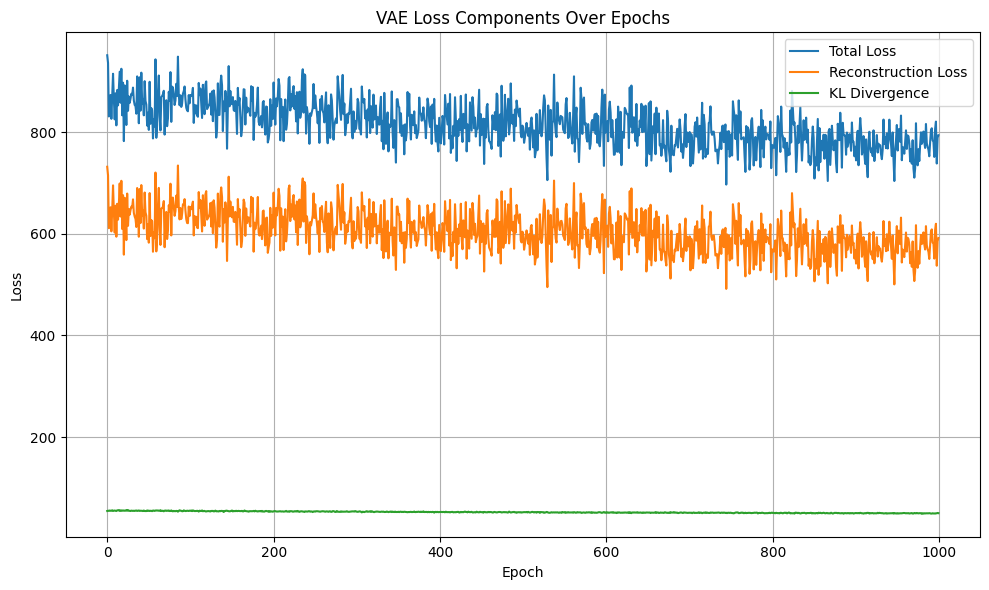

In [46]:
plot_vae_losses(total_loss_hist, recon_loss_hist, kld_loss_hist)

In [49]:
mu_all = get_latent_mu(model, X_tensor, device=DEVICE)

dim of latent mu: (331, 10)


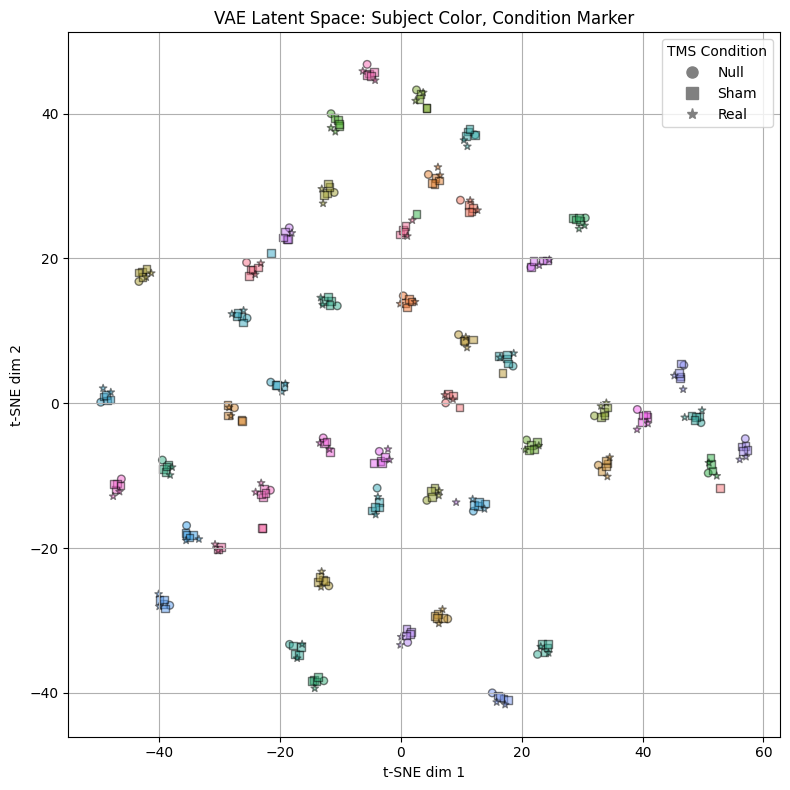

In [50]:
# plot 2d-TSNE
z_2d = TSNE(n_components=2, perplexity=8).fit_transform(mu_all)
plot_latent_embedding_by_condition_and_subject(z_2d, all_tms_type, all_subject_id)

In [51]:
df = compute_condition_distances(mu_all, all_tms_type, all_subject_id, condition_map)
print(df.head())
print(df.describe())

     subject  d_null_sham  d_null_real  diff_real_minus_sham
0  NODEAP_06     4.419337     4.572434              0.153097
1  NODEAP_07     6.350360     3.993592             -2.356769
2  NODEAP_08     4.943906     4.917918             -0.025989
3  NODEAP_09     3.764069     3.620900             -0.143169
4  NODEAP_10     4.051930     4.997994              0.946064
       d_null_sham  d_null_real  diff_real_minus_sham
count    46.000000    46.000000             46.000000
mean      4.063104     4.694855              0.631751
std       0.784694     0.856507              0.990278
min       2.307221     3.474082             -2.356769
25%       3.608163     3.963138              0.041432
50%       3.937244     4.546909              0.620384
75%       4.429178     5.162614              1.077403
max       6.350360     6.645374              3.091856


Paired t-test: t = -4.327, p = 0.0001


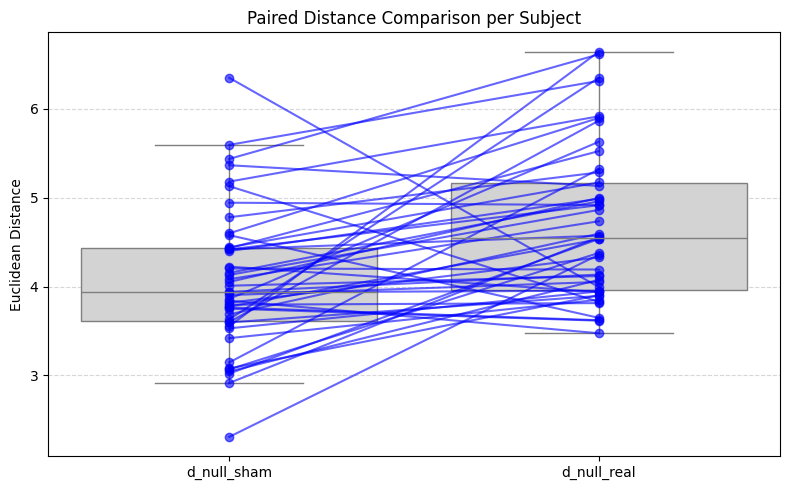

In [52]:
# Paired t-test
t_stat, p_val_t = ttest_rel(df["d_null_sham"], df["d_null_real"])
print(f"Paired t-test: t = {t_stat:.3f}, p = {p_val_t:.4f}")
plot_subject_distance_comparison(df)

In [39]:
df_session_dists = compute_per_session_dist_to_null(mu_all, all_subject_id, all_tms_type)
df_session_dists.head(10)

,subject,index,condition,distance_to_null
0,NODEAP_06,1,S,9.042662
1,NODEAP_06,2,S,10.128119
2,NODEAP_06,3,S,9.355347
3,NODEAP_06,4,C,10.864218
4,NODEAP_06,5,C,9.868118
5,NODEAP_06,6,S,10.594269
6,NODEAP_07,8,S,11.716213
7,NODEAP_07,9,S,12.288519
8,NODEAP_07,10,C,11.391337
9,NODEAP_07,11,S,33.830624


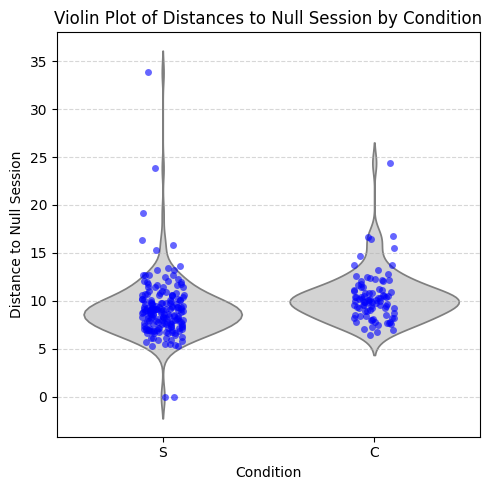

In [40]:
plt.figure(figsize=(5, 5))
sns.violinplot(data=df_session_dists, x='condition', y='distance_to_null', inner=None, color='lightgray')
sns.stripplot(data=df_session_dists, x='condition', y='distance_to_null',
              jitter=True, alpha=0.6, color='blue')

plt.title('Violin Plot of Distances to Null Session by Condition')
plt.ylabel('Distance to Null Session')
plt.xlabel('Condition')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()